## Fashion AI: End-to-End Fashion Item Classification and Colour Extraction


In [3]:

import os                                                      # for path manipulations
import requests
# import gzip                                                  # handles the extraction of .gz files
import numpy as np                                             # for numerical operations like handling arrays
import matplotlib.pyplot as plt                                # useful for visualization
import random                                                  # for shuffling the list of images to split them randomly
import cv2                                                     # useful for manipulation
import shutil                                                  # Useful for high-level file operations (e.g., copying files or directories)
import glob                                                    # commonly used to list files in a directory

# from transformers import VisionEncoderDecoderModel, ViTFeatureExtractor, AutoTokenizer
# from torchvision import transforms
from PIL import Image, ImageDraw, ImageFont
import torch


from ultralytics import YOLO                                   # Importing YOLO object detection model from the Ultralytics package


# from segment_anything import sam_model_registry, SamPredictor
from sam2.build_sam import build_sam2                          #Function used to initialize and build the SAMv2 model from a configuration file and checkpoint.
from sam2.sam2_image_predictor import SAM2ImagePredictor       # SAM2ImagePredictor: A class used to make predictions with the SAMv2 model, specifically for image segmentation tasks.

from tqdm import tqdm                                          # for keep track of execution progress
import scipy                                                   # used for cientific and technical computing







base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'


# This checkpoint file contains the pre-trained model parameters for SAMv2
checkpoint = os.path.join(base_path, "segment-anything-2/checkpoints/sam2_hiera_large.pt")


# The YAML file typically contains information on the model architecture and training configuration
model_cfg = "sam2_hiera_l.yaml"      # Define the configuration file for the SAMv2 model


# The mask_predictor object will be used to generate masks (segmentations) in future steps
mask_predictor = SAM2ImagePredictor(build_sam2(model_cfg, checkpoint))





/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/segment-anything-2/sam2/modeling/sam/transformer.py:23: UserWarning: Flash Attention is disabled as it requires a GPU with Ampere (8.0) CUDA capability.
  OLD_GPU, USE_FLASH_ATTN, MATH_KERNEL_ON = get_sdpa_settings()


### 1. Dataset Preparation

#### 1.1. Introduce Pathes to dataset and Visualize some Images

['JPEGImages/110094.jpg', 'JPEGImages/14487.jpg', 'JPEGImages/171333.jpg', 'JPEGImages/5083.jpg', 'JPEGImages/63693.jpg', 'JPEGImages/185734.jpg', 'JPEGImages/137557.jpg', 'JPEGImages/190401.jpg', 'JPEGImages/44699.jpg', 'JPEGImages/34330.jpg', 'JPEGImages/126558.jpg', 'JPEGImages/30742.jpg', 'JPEGImages/189281.jpg', 'JPEGImages/24740.jpg', 'JPEGImages/57175.jpg', 'JPEGImages/67317.jpg', 'JPEGImages/40836.jpg', 'JPEGImages/141529.jpg', 'JPEGImages/64292.jpg', 'JPEGImages/190668.jpg', 'JPEGImages/146188.jpg', 'JPEGImages/154108.jpg', 'JPEGImages/185518.jpg', 'JPEGImages/105848.jpg', 'JPEGImages/34066.jpg', 'JPEGImages/98409.jpg', 'JPEGImages/71912.jpg', 'JPEGImages/183082.jpg', 'JPEGImages/183067.jpg', 'JPEGImages/179874.jpg', 'JPEGImages/121499.jpg', 'JPEGImages/97381.jpg', 'JPEGImages/32633.jpg', 'JPEGImages/53715.jpg', 'JPEGImages/45131.jpg', 'JPEGImages/54661.jpg', 'JPEGImages/46727.jpg', 'JPEGImages/52946.jpg', 'JPEGImages/177810.jpg', 'JPEGImages/182800.jpg', 'JPEGImages/167287.jp

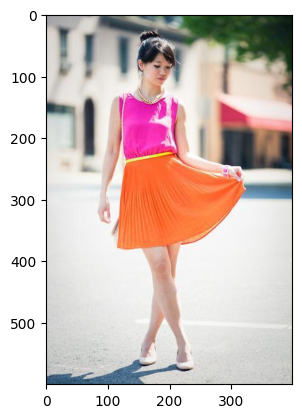

In [4]:

annotations_path = "Annotations"                                            # path to Annotations
list_of_xml_files = glob.glob(os.path.join(annotations_path, "*.xml"))      # create a list of xml file
# print(list_of_xml_files)


annotations_txt_path = "Annotations_txt"                                     # path to Annotations_txt
list_of_txt_files = glob.glob(os.path.join(annotations_txt_path, "*.txt"))   # list of Annotations_txt file


image_sets_path = "ImageSets/Main"                                           # path to ImageSets/Main
jpeg_images_path = "JPEGImages"                                              # path to JPEGImages
list_of_jpeg_images_path = glob.glob(os.path.join(jpeg_images_path, "*.jpg"))
print(list_of_jpeg_images_path)

# path to trainval and test files
trainval_files = os.path.join(image_sets_path, "trainval.txt")               # path to trainval.txt files
test_files= os.path.join(image_sets_path, "test.txt")                        # path to test.txt files


# read the trainval file
with open(trainval_files, 'r') as f:                                         
    trainval_images = f.readlines()
trainval_images = [line.strip() for line in trainval_images]

# read the test file
with open(test_files, 'r') as f:
    test_images = f.readlines()
test_images = [line.strip() for line in test_images]

print(f"trainval images list :{trainval_images}")
print(f"test images list:{test_images}")

#visualize images

trainval_images_path = [os.path.join(jpeg_images_path, f"{img_id}.jpg") for img_id in trainval_images]
test_images_path = [os.path.join(jpeg_images_path, f'{img_id}.jpg') for img_id in test_images]
image = Image.open(trainval_images_path[0]).convert('RGB')
plt.imshow(image)
plt.show()



#### Visualize more Images

['JPEGImages/127704.jpg', 'JPEGImages/70107.jpg', 'JPEGImages/155803.jpg', 'JPEGImages/4611.jpg', 'JPEGImages/37902.jpg', 'JPEGImages/191323.jpg']


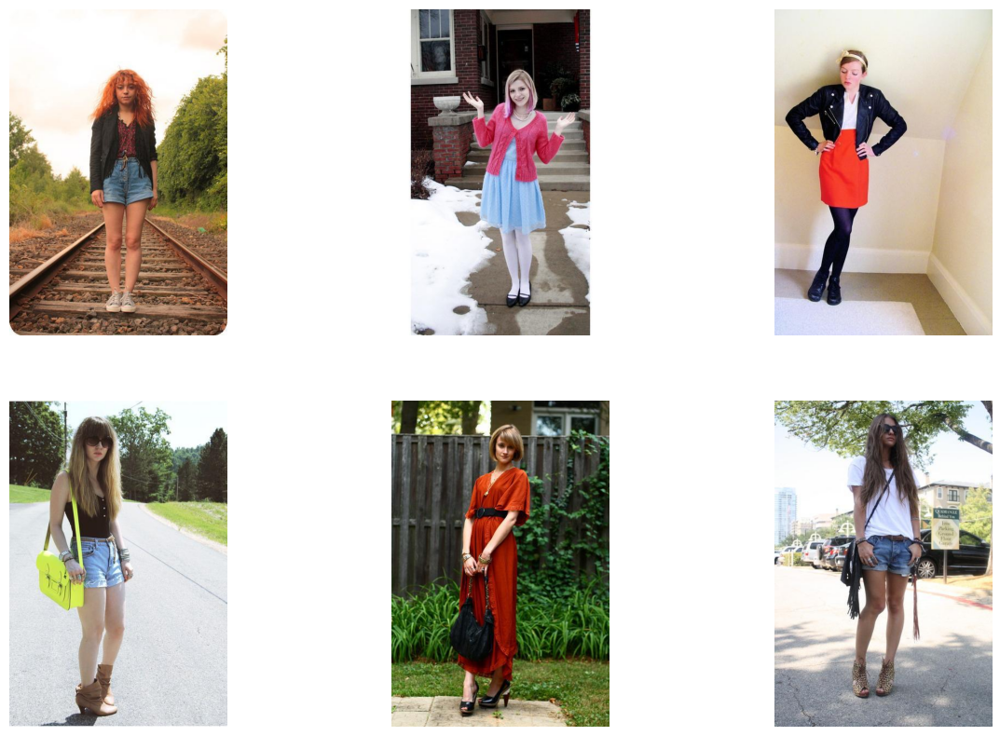

In [5]:
import PIL
import os

annotations_path = "Annotations"
list_of_xml_files = glob.glob(os.path.join(annotations_path, "*.xml"))


annotations_txt_path = "Annotations_txt"
list_of_txt_files = glob.glob(os.path.join(annotations_txt_path, "*.txt"))


image_sets_path = "ImageSets/Main"
jpeg_images_path = "JPEGImages"
list_of_jpeg_images_path = glob.glob(os.path.join(jpeg_images_path, "*.jpg"))

# function to visualize some images with their pathes
def visualize_images(list_of_jpeg_images_path):
    random_sample_images_path = random.sample(list_of_jpeg_images_path, 6)
    print(random_sample_images_path)
    fig, axes = plt.subplots(2, 3, figsize = (15, 10))
    axes = axes.ravel()
    for i in range(len(random_sample_images_path)):   
        image = Image.open(random_sample_images_path[i]).convert('RGB')
        axes[i].imshow(image)
        axes[i].axis('off')
    plt.show()
visualize_images(list_of_jpeg_images_path)
    
    

- the txt format of annotations are in this format:

- class_id   x_center   y_center   width   height

- class_id is the class of object

- x_center, y_center are the center of the bounding boxes  

- width, height are width and height of the image 


- for this image we want to get bounding boxes for each clothing item and then crop image based on the bboxes in ground truth

- we define a function to parse txt file to extract bounding box coordinates along with the class id.

- The typical YOLO .txt format has the following structure:


- Class_id center_x center_y width height
- Each line in the .txt file represents one bounding box.

- The values center_x, center_y, width, and height are normalized (between 0 and 1) relative to the image dimensions.
- we want to convert these format to pixel coordinates format like : x_min, y_min, x_max, y_max only for visualization  (overlay) of bounding box on the object. but when using YOLO for both fine tuning and inference we need the original txt format.


-we will need to load the image using a library like PIL or OpenCV.
- Reading the Bounding Boxes:


we Convert the normalized coordinates into pixel coordinates in order to overlay bounding boxes on image for exploring.



['3 0.426250 0.308333 0.257500 0.186667\n', '9 0.501250 0.930000 0.222500 0.060000\n', '6 0.547500 0.508333 0.520000 0.253333']
['3', '0.426250', '0.308333', '0.257500', '0.186667']
['9', '0.501250', '0.930000', '0.222500', '0.060000']
['6', '0.547500', '0.508333', '0.520000', '0.253333']
[(3, 119, 128, 222, 240), (9, 155, 540, 244, 576), (6, 114, 228, 323, 380)]


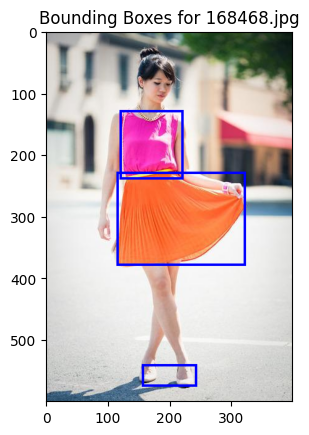

In [8]:
import os
from PIL import Image, ImageDraw
import glob
import matplotlib.pyplot as plt

# Define paths
annotations_txt_path = "Annotations_txt"
jpeg_images_path = "JPEGImages"

# Get lists of annotation files and images
list_of_txt_files = glob.glob(os.path.join(annotations_txt_path, "*.txt"))
list_of_jpeg_images_path = glob.glob(os.path.join(jpeg_images_path, "*.jpg"))


# Read the trainval file
image_sets_path = "ImageSets/Main"
trainval_files = os.path.join(image_sets_path, "trainval.txt")

with open(trainval_files, 'r') as f:
    trainval_images = f.readlines()
trainval_images = [line.strip() for line in trainval_images]

# Construct full paths to the images
trainval_images_path = [os.path.join(jpeg_images_path, f"{img_id}.jpg") for img_id in trainval_images]



# Function to read bounding boxes from a YOLO format text file
def read_bounding_box(txt_file):
    
    with open(txt_file, 'r') as f:     # function to load and read a file
        lines = f.readlines()         
        print(lines)
    boxes = []
    for line in lines:                # loop through each line
        parts = line.strip().split()  
        print(parts)
        class_id = int(parts[0])      # the first part is the class id
        center_x = float(parts[1])     # the second part is center_x
        center_y = float(parts[2])     # the third part is center_y
        width = float(parts[3])        # the forth part is bounding box width
        height = float(parts[4])       # the fifth part is bounding box height
        boxes.append([class_id, center_x, center_y, width, height])
        
    return boxes

# Function to convert YOLO bounding box coordinates to pixel coordinates
def convert_yolo_to_pixel(box, img_width, img_height):
    class_id, center_x, center_y, width, height = box
    x_min = int((center_x - width / 2) * img_width)
    y_min = int((center_y - height / 2) * img_height)
    x_max = int((center_x + width / 2) * img_width)
    y_max = int((center_y + height / 2) * img_height)
    return (class_id, x_min, y_min, x_max, y_max)

# Function to draw bounding boxes on an image
def draw_bounding_boxes(image_path, annotation_path):
    # Open the image and get its dimensions
    image = Image.open(image_path).convert('RGB')
    img_width, img_height = image.size

    # Read bounding boxes from the annotation file
    boxes = read_bounding_box(annotation_path)
    pixel_boxes = [convert_yolo_to_pixel(box, img_width, img_height) for box in boxes]
    print(pixel_boxes)
    
    # Draw bounding boxes on the image
    draw = ImageDraw.Draw(image)
    for pixel_box in pixel_boxes:
        class_id, x_min, y_min, x_max, y_max = pixel_box
        draw.rectangle([x_min, y_min, x_max, y_max], outline="blue", width=4)
    
    # Display the image with the bounding boxes
    plt.imshow(image)
    plt.title(f"Bounding Boxes for {os.path.basename(image_path)}")
    plt.show()

# Assuming the first image and first annotation file correspond
image_file = trainval_images_path[0]
annotation_file = os.path.join(annotations_txt_path, f"{trainval_images[0]}.txt")

# Draw bounding boxes on the selected image
draw_bounding_boxes(image_file, annotation_file)


#### 1.2. Preparing dataset for custom training and inference  with YOLOV8

- when applying YOLO, we need to have a particular format which is different with the original format of dataset. the dataset should have a format like this:


Colorful_Fashion_Dataset

    JPEGImages

        train
            img1.jpg
            img1.txt
            img2.jpg
            img2.txt
            ...
        
        val
            img3.jpg
            img3.txt
            ...


        test
            img4.jpg
            img4.txt
            ...

we can define a function organize images and their corresponding YOLO annotations into train / val / test directories under JPEGImages.

In [2]:
import os
import shutil
import glob
import random
from PIL import Image
import matplotlib.pyplot as plt

# Define paths based on our directory structure
annotations_path = "Annotations"
annotations_txt_path = "Annotations_txt"
image_sets_path = "ImageSets/Main"
jpeg_images_path = "JPEGImages"

# List XML, TXT, and JPEG files
list_of_xml_files = glob.glob(os.path.join(annotations_path, "*.xml"))
list_of_txt_files = glob.glob(os.path.join(annotations_txt_path, "*.txt"))
list_of_jpeg_images_path = glob.glob(os.path.join(jpeg_images_path, "*.jpg"))

# Paths to trainval.txt and test.txt
trainval_files = os.path.join(image_sets_path, "trainval.txt")
test_files = os.path.join(image_sets_path, "test.txt")

# Read the trainval and test files
with open(trainval_files, 'r') as f:
    trainval_images = f.readlines()
trainval_images = [line.strip() for line in trainval_images]
# print(len(trainval_images))

with open(test_files, 'r') as f:
    test_images = f.readlines()
test_images = [line.strip() for line in test_images]
print(len(test_images))

# Convert image IDs to full paths
trainval_images_path = [os.path.join(jpeg_images_path, f"{img_id}.jpg") for img_id in trainval_images]
test_images_path = [os.path.join(jpeg_images_path, f'{img_id}.jpg') for img_id in test_images]

# Now we want to split trainval images into two separate folders: train and val with 80/20 split.
random.shuffle(trainval_images)
split_idx = int(0.8 * len(trainval_images))

train_images = trainval_images[0:split_idx]
print(len(train_images))

val_images = trainval_images[split_idx:]
print(len(val_images))

# function to organize the dataset into YOLO format

def organize_file_to_yolo_format(image_list, subset):
    
    # Create subdirectory for images and annotations within the subset directory
    sub_dir = os.path.join(jpeg_images_path, subset)
    os.makedirs(sub_dir, exist_ok=True)
    
    for image_id in image_list:
        image_file = f"{image_id}.jpg"
        annot_file = f"{image_id}.txt"
        
        src_image = os.path.join(jpeg_images_path, image_file)          # Path to the image file in the current images directory

        dst_image = os.path.join(sub_dir, image_file)                   # Path to the image file in the destination directory (sub_dir)

        
        src_annotation = os.path.join(annotations_txt_path, annot_file) # Path to the current annotation file in the annotations directory

        dst_annotation = os.path.join(sub_dir, annot_file)              # Path to the annotations file in the destination directory (sub_dir)
 
        
        if os.path.exists(src_image) and os.path.exists(src_annotation):
            shutil.copy(src_image, dst_image)                           # Copy the source image to the destination directory

            shutil.copy(src_annotation, dst_annotation)                 # Copy the source annotation file to the destination directory

# Organize files for train, val, and test sets
organize_file_to_yolo_format(train_images, 'train')
organize_file_to_yolo_format(val_images, 'val')
organize_file_to_yolo_format(test_images, 'test')

print("Dataset organized successfully!")

537
1716
429
Dataset organized successfully!


#### 1.3. Create Yaml File

when using YOLOV8, a YAML file typically contains configuration information for the dataset, model parameters, and training settings. Here's a common structure 

for a YOLO dataset configuration YAML file

In [8]:
import torch
import ultralytics
import os

print(f"Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# print(device)

print(os.path.exists('obj_detect.yaml'))   # to check if yaml file exists or not

Using torch 2.4.0+cu121 (NVIDIA GeForce GTX 1080 Ti)
cuda
True


In [26]:
import os
import torch

#Define paths based on our directory structure

annotations_path = "Annotations"
annotations_txt_path = "Annotations_txt"
image_sets_path = "ImageSets/Main"
jpeg_images_path = "JPEGImages"
train_image_path = os.path.join(jpeg_images_path, "train")
val_image_path = os.path.join(jpeg_images_path, "val")
test_image_path = os.path.join(jpeg_images_path, "test")


yaml_path = 'obj_detect.yaml'  # to check yaml file exists
if os.path.exists(yaml_path):
    print("YAML file exists!")
else:
    print("YAML file does not exist!")
print(yaml_path)


YAML file exists!
obj_detect.yaml


when using frameworks like YOLO we need some directories and subdirectories for organizing the results

1- runs/detect:

This directory structure is used to organize and store the results of different training runs. Each time we train a model, we might want to save the model's weights, logs, evaluation metrics, and sample predictions for later analysis or comparison with other runs

2- train:

This subdirectory specifically stores the results related to a training run. Each training session might generate new data, and keeping this organized helps in managing different experiments

3- weights:

Within the train directory, the weights subdirectory stores the model's weights after training. These weights are essential if you want to later load the model for inference or further training

### 2. Fine-tune YOLOV8 on Colorful Fashion Dataset

In [9]:
import os
import torch
from ultralytics import YOLO

device = 'cuda' if torch.cuda.is_available() else 'cpu'

base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'

#define  path for runs and detect
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train', 'weights')
# Ensure the runs/detect directory exists
os.makedirs(runs_path, exist_ok = True)
# Ensure the weights save directory exists




# Define the path to your dataset and model
model_path = 'yolov8l.pt'



yaml_path =  os.path.join(base_path, "obj_detect.yaml")


# fine tune yolov8 on our colorful fashion dataset
model = YOLO("yolov8l.pt")
model.train(data= yaml_path, epochs=30, imgsz=640, device = device, project = runs_path, save_period = -1, save = True)  # train the model on 30 epochs with image size 640 * 640


New https://pypi.org/project/ultralytics/8.2.101 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.78 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11162MiB)
engine/trainer: task=detect, mode=train, model=yolov8l.pt, data=/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/obj_detect.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/runs/detect, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_st

train: Scanning /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train... 1716 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1716/1716 [00:00<00:00, 1797.87it/s]

train: New cache created: /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train.cache



val: Scanning /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/val... 429 images, 0 backgrounds, 0 corrupt: 100%|██████████| 429/429 [00:00<00:00, 765.42it/s]

val: New cache created: /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/val.cache


Plotting labels to /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/runs/detect/train6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/runs/detect/train6
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      10.8G      1.315      1.827      1.488         33        640: 100%|██████████| 108/108 [04:18<00:00,  2.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:16<00:00,  1.20s/it]

                   all        429       1665      0.574      0.537      0.547      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      11.1G      1.309      1.368      1.485         37        640: 100%|██████████| 108/108 [05:19<00:00,  2.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]

                   all        429       1665       0.56      0.578      0.582       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      11.1G      1.332      1.324      1.519         37        640: 100%|██████████| 108/108 [05:43<00:00,  3.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:19<00:00,  1.39s/it]

                   all        429       1665      0.636      0.559      0.589       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      11.1G      1.334      1.263      1.531         33        640: 100%|██████████| 108/108 [05:58<00:00,  3.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:19<00:00,  1.39s/it]

                   all        429       1665       0.57       0.65      0.641      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      10.8G      1.286        1.2      1.493         23        640: 100%|██████████| 108/108 [06:04<00:00,  3.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:20<00:00,  1.46s/it]

                   all        429       1665      0.624      0.656      0.656      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      10.2G      1.273      1.165      1.485         33        640: 100%|██████████| 108/108 [06:06<00:00,  3.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:19<00:00,  1.43s/it]

                   all        429       1665      0.636      0.686      0.687      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      11.1G      1.218      1.101      1.446         32        640: 100%|██████████| 108/108 [06:11<00:00,  3.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:20<00:00,  1.47s/it]

                   all        429       1665      0.743      0.672      0.711      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      10.8G      1.211      1.051      1.436         54        640: 100%|██████████| 108/108 [06:14<00:00,  3.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:21<00:00,  1.50s/it]

                   all        429       1665      0.742      0.688      0.721      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      10.8G      1.189      1.028      1.431         27        640: 100%|██████████| 108/108 [06:13<00:00,  3.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:21<00:00,  1.52s/it]

                   all        429       1665      0.651      0.728      0.728      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      10.8G       1.17     0.9824      1.417         39        640: 100%|██████████| 108/108 [06:18<00:00,  3.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:19<00:00,  1.41s/it]

                   all        429       1665      0.724       0.72      0.752      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      11.1G      1.154     0.9501      1.399         29        640: 100%|██████████| 108/108 [06:16<00:00,  3.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:21<00:00,  1.53s/it]

                   all        429       1665      0.748      0.721      0.749       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      11.1G      1.116     0.9032      1.374         29        640: 100%|██████████| 108/108 [06:16<00:00,  3.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:20<00:00,  1.49s/it]

                   all        429       1665      0.682      0.748      0.748      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      11.1G      1.106     0.8762       1.37         39        640: 100%|██████████| 108/108 [06:15<00:00,  3.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:21<00:00,  1.53s/it]

                   all        429       1665        0.7       0.77      0.767      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      11.1G      1.084     0.8605       1.36         35        640: 100%|██████████| 108/108 [06:15<00:00,  3.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:22<00:00,  1.58s/it]

                   all        429       1665      0.737       0.72      0.763      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      11.1G      1.067     0.8227      1.342         18        640: 100%|██████████| 108/108 [06:15<00:00,  3.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:21<00:00,  1.50s/it]

                   all        429       1665      0.695      0.764       0.77      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      11.1G      1.055      0.808      1.338         18        640: 100%|██████████| 108/108 [06:18<00:00,  3.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:21<00:00,  1.56s/it]

                   all        429       1665      0.734      0.729      0.762      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      11.1G      1.043     0.7888       1.32         26        640: 100%|██████████| 108/108 [06:17<00:00,  3.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:21<00:00,  1.53s/it]

                   all        429       1665      0.711      0.775      0.774       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      11.1G      1.022     0.7442      1.299         23        640: 100%|██████████| 108/108 [06:16<00:00,  3.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:22<00:00,  1.57s/it]

                   all        429       1665      0.766      0.712      0.771      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      11.1G      1.005     0.7335      1.298         26        640: 100%|██████████| 108/108 [06:16<00:00,  3.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:21<00:00,  1.57s/it]

                   all        429       1665      0.707      0.767      0.772      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      11.1G     0.9841     0.7209       1.29         21        640: 100%|██████████| 108/108 [06:18<00:00,  3.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:20<00:00,  1.45s/it]

                   all        429       1665      0.755       0.76      0.785      0.532


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      11.1G     0.9542     0.6504      1.307         13        640: 100%|██████████| 108/108 [06:16<00:00,  3.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:20<00:00,  1.50s/it]

                   all        429       1665      0.752      0.762      0.783      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      11.1G      0.922     0.6185      1.286         15        640: 100%|██████████| 108/108 [06:13<00:00,  3.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:21<00:00,  1.55s/it]

                   all        429       1665      0.724      0.749       0.77       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      11.1G     0.9011     0.5914      1.273         14        640: 100%|██████████| 108/108 [06:13<00:00,  3.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:22<00:00,  1.60s/it]

                   all        429       1665      0.751      0.755      0.787      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      10.8G     0.8836     0.5748      1.265         15        640: 100%|██████████| 108/108 [06:15<00:00,  3.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:22<00:00,  1.58s/it]

                   all        429       1665      0.745       0.76      0.783      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      11.1G     0.8701     0.5521      1.241         14        640: 100%|██████████| 108/108 [06:17<00:00,  3.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:20<00:00,  1.49s/it]

                   all        429       1665      0.755      0.769      0.785      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      11.1G     0.8539     0.5255      1.235         17        640: 100%|██████████| 108/108 [06:16<00:00,  3.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:20<00:00,  1.49s/it]

                   all        429       1665      0.739      0.773      0.787      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      11.1G     0.8251     0.5025       1.22         16        640: 100%|██████████| 108/108 [06:16<00:00,  3.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:21<00:00,  1.56s/it]

                   all        429       1665      0.724      0.766      0.783      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      11.1G     0.8041      0.477      1.191         14        640: 100%|██████████| 108/108 [06:15<00:00,  3.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:21<00:00,  1.52s/it]

                   all        429       1665      0.729      0.765      0.783      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      11.1G     0.7949     0.4648      1.194         15        640: 100%|██████████| 108/108 [06:15<00:00,  3.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:21<00:00,  1.55s/it]

                   all        429       1665      0.758      0.754      0.785      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      10.8G     0.7705     0.4433      1.169         14        640: 100%|██████████| 108/108 [06:16<00:00,  3.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:22<00:00,  1.64s/it]

                   all        429       1665      0.767      0.755      0.784      0.547



30 epochs completed in 3.258 hours.
Optimizer stripped from /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/runs/detect/train6/weights/last.pt, 87.6MB
Optimizer stripped from /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/runs/detect/train6/weights/best.pt, 87.6MB

Validating /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/runs/detect/train6/weights/best.pt...
Ultralytics YOLOv8.2.78 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11162MiB)
Model summary (fused): 268 layers, 43,614,318 parameters, 0 gradients, 164.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:20<00:00,  1.45s/it]


                   all        429       1665      0.758      0.754      0.784      0.548
              sunglass         69         69      0.449      0.217      0.356      0.129
                   hat         52         52      0.675      0.692      0.737      0.412
                jacket        158        162       0.76      0.883      0.843      0.673
                 shirt        290        299      0.814      0.807      0.859      0.598
                 pants        102        102       0.92      0.912      0.925      0.753
                shorts         74         74      0.825      0.765      0.781      0.524
                 skirt        148        148      0.811      0.899      0.894      0.693
                 dress        107        107      0.775      0.879      0.872      0.743
                   bag        235        235      0.756      0.706      0.773      0.475
                  shoe        417        417      0.797      0.779      0.803      0.478
Speed: 0.2ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c56e43fecb0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0

### 3. Evaluate the model on the test set with (Precision- Recall Curve) and calculate Accuracy on train/val/test

#### 3.1 Evaluate precision-recall curve and calculate precisions across all classess when recall = 1

in order to evaluate precision-recall curve we defined 10 function.

1. Run YOLO-based object detection model.

2. It reads test images and annotations, performs object detection, and matches predictions to ground truth using IoU and Hungarian matching. 

3. It then calculates precision, recall, AP, and AUC-PR for each class, generates precision-recall curves, and saves the results for analysis.

4. Finally, it computes and displays micro-average precision and AUC-PR across all classes

another objective is calculating first elements of precisions across all classes when recall = 1, meaning the model successfully predicts all objects in each class.
then we draw a grapg of it.

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image
import glob
from tqdm import tqdm
import scipy.optimize
from sklearn.metrics import precision_recall_curve, auc, average_precision_score
from icecream import ic


# Initialize counters for precision-recall and AUC-PR data
def initialize_pr_data(num_classes):
    return {
        'true_labels': [[] for _ in range(num_classes)],  # to store  true labels across each class individually
        'confidences': [[] for _ in range(num_classes)],   # to store confidence scores across each class individually
        'global_true_labels': [],                          # store true labels across all classes
        'global_confidences': []                            # store confidence scores across all classes
    }
  
    

# Specifies paths for images, annotations, and the pre-trained YOLO model checkpoint
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
jpeg_images_path = "JPEGImages"
test_image_path = os.path.join(jpeg_images_path, "test")
best_weights_path = os.path.join(base_path, 'runs/detect/train/weights', 'best.pt')




# Maps class IDs to corresponding class labels for easier interpretation
def class_to_label(class_id):
    classes = ['sunglass', 'hat', 'jacket', 'shirt', 'pants', 'shorts', 'skirt', 'dress', 'bag', 'shoe']
    return classes[class_id], len(classes)




# Loads ground truth bounding boxes (in YOLO format) from .txt annotation files
def read_txt_annotations(file_path):
    annots = {}
    with open(file_path, 'r') as f:
        lines = f.readlines()
    for line in lines:
        elems = line.split()
        annots[int(elems[0])] = [float(elems[1]), float(elems[2]), float(elems[3]), float(elems[4])]
    return annots




# Convert YOLO bounding boxes from [cx, cy, w, h] to [x1, y1, x2, y2] 
def convert_whn_to_xyxy(box_whn, img_width, img_height):
    center_x, center_y, width, height = box_whn
    x_min = int((center_x - width / 2) * img_width)
    y_min = int((center_y - height / 2) * img_height)
    x_max = int((center_x + width / 2) * img_width)
    y_max = int((center_y + height / 2) * img_height)
    return [x_min, y_min, x_max, y_max]



# Computes the IoU between predicted and ground truth bounding boxes for evaluating detection accuracy
def bb_intersection_over_union(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxB[3], boxA[3])
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou



# Matches detected objects with ground truth objects using the Hungarian algorithm based on IoU value
def find_all_gt_labels(final_items, annots, img_width, img_height):
    cost_matrix = []
    keys = list(annots.keys())

    for item in final_items:
        pred_box_xyxy = convert_whn_to_xyxy(item['box_xywhn'], img_width, img_height)
        
        ious = []
        for k in keys:
            gt_box_xyxy = convert_whn_to_xyxy(annots[k], img_width, img_height)
            ious.append(bb_intersection_over_union(pred_box_xyxy, gt_box_xyxy))
        
        cost_matrix.append(1 - np.array(ious))  # We want to minimize 1 - IoU
    
    # Perform Hungarian matching
    row_ind, col_ind = scipy.optimize.linear_sum_assignment(cost_matrix)
    
    
    
    # Assign best matching ground truth to each prediction
    matched_items = []
    for i, l in enumerate(col_ind):
        final_items[i]['gt_id'] = keys[l]
        final_items[i]['gt_label'] = class_to_label(keys[l])[0]
        matched_items.append(final_items[i])
    
    return matched_items




# Loads the YOLO model, detects objects in images, and stores predicted bounding boxes, confidence scores, and class IDs
def detect_and_match_objects(image_path, yolo_weights_path, pr_data, num_classes):
    annotations_path = image_path.replace('.jpg', '.txt')
    annotations = read_txt_annotations(annotations_path)

    model = YOLO(yolo_weights_path).to('cuda')
    results = model(image_path)

    detected_items = []
    for result in results:
        for box in result.boxes:
            confidence = box.conf.item()
            class_id = int(box.cls.item())
            label = class_to_label(class_id)[0]
            detected_items.append({
                'confidence': confidence,
                'box_xywhn': box.xywhn[0].cpu().numpy().tolist(),
                'class_id': class_id,
                'label': label
            })

    # Get image dimensions
    img = Image.open(image_path)
    img_width, img_height = img.size
    
    # Perform Hungarian matching between predictions and ground truth
    final_items = find_all_gt_labels(detected_items, annotations, img_width, img_height)
    
    

    # keep track of model's prediction for each class/ true positives and false positives so that later we can use for calculating precision and recall curve
    for item in final_items:
        class_id = item['class_id']
        confidence = item['confidence']
        gt_label = item['gt_label']

        pr_data['confidences'][class_id].append(confidence)                                           # keep track of confidence score per class
        pr_data['true_labels'][class_id].append(1 if class_to_label(class_id)[0] == gt_label else 0)  #keep track of true labels per class

        pr_data['global_confidences'].append(confidence)                                              # tracks confidence scores for predictions across all classes
        pr_data['global_true_labels'].append(1 if class_to_label(class_id)[0] == gt_label else 0)     # keep track of true labels per class
    
        
        
               
# Calculate precision, recall, Average Precision (AP), and AUC-PR for each class and the global average
def calculate_precision_recall_auc_sk(pr_data, num_classes):
    aps = []                #store average precisions
    auc_prs = []            # store auc-pr for each class
    for class_id in range(num_classes):
        if len(pr_data['true_labels'][class_id]) == 0:
            continue
        
        confidences = np.array(pr_data['confidences'][class_id]) # convert confidence score  to numpy array for later processing
        true_labels = np.array(pr_data['true_labels'][class_id])   # convert true labels on each class id to numpy array for further processing

        # Sort by confidence
        sorted_indices = np.argsort(-confidences)   #The predictions are sorted by their confidence scores in descending order

        true_labels = true_labels[sorted_indices]    # Both true_labels and confidences arrays are rearranged according to this sorted order
        confidences = confidences[sorted_indices]
        
        # Calculate precision, recall, and AUC using scikit-learn
        precision, recall, _ = precision_recall_curve(true_labels, confidences)
        ic(precision[0], recall[0], class_id) # the first element (precision[0] and recall[0]) corresponds to the highest confidence threshold

        auc_pr = auc(recall, precision)
        ap = average_precision_score(true_labels, confidences)

        aps.append(ap)
        auc_prs.append(auc_pr)

    # Calculate micro-average precision, recall, and AUC
    global_true_labels = np.array(pr_data['global_true_labels'])
    global_confidences = np.array(pr_data['global_confidences'])
    precision_micro, recall_micro, _ = precision_recall_curve(global_true_labels, global_confidences)
    auc_pr_micro = auc(recall_micro, precision_micro)
    ap_micro = average_precision_score(global_true_labels, global_confidences)

    # Calculate mAP and mean AUC-PR
    mAP = np.mean(aps) if aps else 0
    mean_auc_pr = np.mean(auc_prs) if auc_prs else 0
    return mAP, mean_auc_pr, ap_micro, auc_pr_micro, precision_micro, recall_micro





# Plot Precision-Recall curve, including AP and AUC-PR for each class and micro-average
def plot_pr_curve(pr_data, num_classes, mAP, mean_auc_pr, ap_micro, auc_pr_micro, precision_micro, recall_micro):
    plt.figure(figsize=(10, 8))

    for class_id in range(num_classes):
        if len(pr_data['true_labels'][class_id]) == 0:
            continue
        confidences = np.array(pr_data['confidences'][class_id])
        true_labels = np.array(pr_data['true_labels'][class_id])
        precision, recall, _ = precision_recall_curve(true_labels, confidences)

        plt.plot(recall, precision, 
                 label=f"{class_to_label(class_id)[0]} (AP: {average_precision_score(true_labels, confidences):.2f}, AUC-PR: {auc(recall, precision):.2f})")

    # Plot micro-average precision-recall curve
    plt.plot(recall_micro, precision_micro, linestyle='--', color='black',
            label=f'Micro-Average (AP: {ap_micro:.2f}, AUC-PR: {auc_pr_micro:.2f})')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve for Each Class with AP, mAP = {mAP:.2f}, AUC-PR = {mean_auc_pr:.2f}')
    plt.legend(loc='lower left')
    plt.grid(True)

    # Save the plot to a file
    plot_file_path = os.path.join(base_path, "precision_recall_curve_with_micro_average.png")
    plt.savefig(plot_file_path)
    print(f"Precision-Recall curve saved to {plot_file_path}")
    
    

# Process the test dataset and generate Precision-Recall curves with AP, AUC-PR, and micro-average
def process_test_set():
    # Get number of classes
    _, num_classes = class_to_label(0)
    
    # Initialize PR data for each class
    pr_data = initialize_pr_data(num_classes)

    # Test Set
    test_files = glob.glob(os.path.join(test_image_path, '*.jpg'))

    # Process all test images
    for image_path in tqdm(test_files):
        detect_and_match_objects(image_path, best_weights_path, pr_data, num_classes)

    # Calculate precision, recall, AP, and AUC-PR
    mAP, mean_auc_pr, ap_micro, auc_pr_micro, precision_micro, recall_micro = calculate_precision_recall_auc_sk(pr_data, num_classes)

    # Plot Precision-Recall Curve and display AP, AUC-PR, and micro-average for each class
    plot_pr_curve(pr_data, num_classes, mAP, mean_auc_pr, ap_micro, auc_pr_micro, precision_micro, recall_micro)

    # Print mAP and mean AUC-PR
    print(f"\nMean Average Precision (mAP): {mAP:.2f}")
    print(f"Mean AUC-PR: {mean_auc_pr:.2f}")
    print(f"Micro-Average Precision: {ap_micro:.2f}")
    print(f"Micro-Average AUC-PR: {auc_pr_micro:.2f}")



# Run the process for the test dataset
process_test_set()

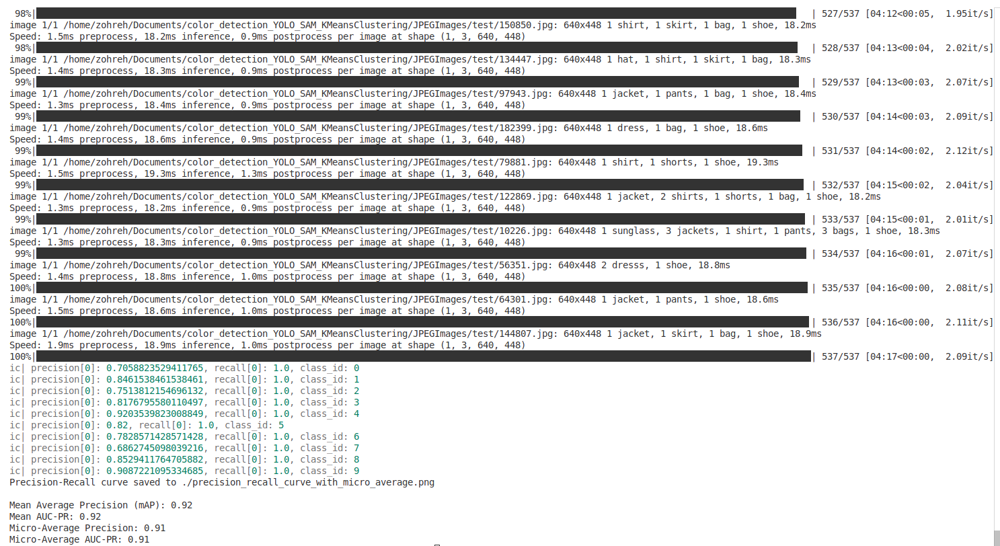

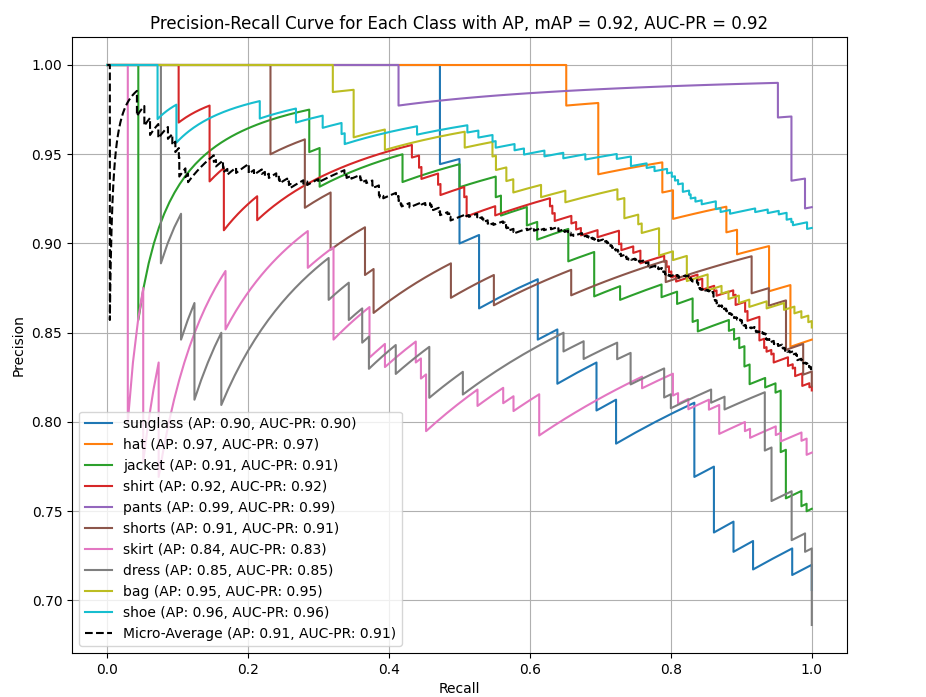

In [4]:
# this operation is computationally intensive and can not be executed on jupyter notbook, thus we run the code in terminal and saved screen shot of the result
from IPython.display import Image, display
display(Image(filename='/home/zohreh/Pictures/Screenshots/Screenshot from 2024-09-20 00-10-31.png'))

display(Image(filename='/home/zohreh/Pictures/Screenshots/Screenshot from 2024-09-20 00-04-04.png'))

First we calculate precision-recall curve.
As we can see, the AP (Average Precision) is the overall precision-recall trade-off. The higher the AP, the better the model’s overall ability to balance precision and recall for that class.

mAP= 0.92

AUC-PR = 0.92  (Area Under the Precision-Recall Curve). higher AUC-PR means the model performs better at maintaining precision as recall increases.

Micro-Average : This is a combined average of precision and recall across all classes. It shows the overall performance of the model when looking at all classes together. The micro-average curve is a good indicator of how the model is performing in general.

#### 3.1.1 graph of precisions across all classes when recall = 1

As we can see when recall = 1 means the model successfully predict all the objects in each class on the test set. There were no instances that the model missed . we get all precisions for all classes when recall = 1 in order to calculate percentage of all those positive predictions that are actually correct.

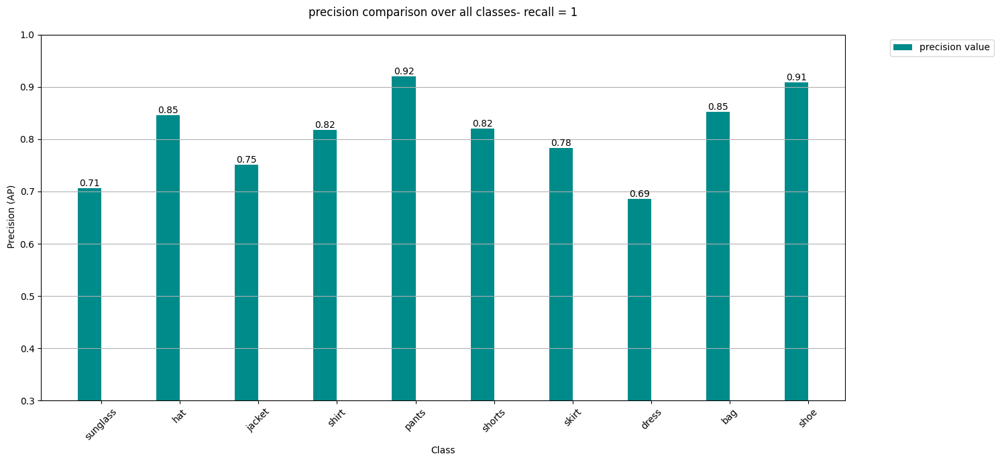

In [17]:

import matplotlib.pyplot as plt
import numpy as np

# Data for AP values
precision_values_when_recall_1 = {
    'sunglass': 0.7059,
    'hat': 0.8461 ,
    'jacket': 0.7513,
    'shirt': 0.8176 ,
    'pants': 0.9203,
    'shorts': 0.82 ,
    'skirt': 0.7828,
    'dress': 0.6862,
    'bag': 0.8529,
    'shoe': 0.9087 
}


# Extract class names and corresponding AP values for both cases
classes = list(precision_values_when_recall_1.keys())
precision_values = [precision_values_when_recall_1[cls] for cls in classes]



# Define bar width and positions
bar_width = 0.3
index = np.arange(len(classes))



# Create the bar plot
plt.figure(figsize=(15, 7))
bars1 = plt.bar(index, precision_values, bar_width, label='precision value', color='darkcyan')



# Add labels, title, and legend
plt.xlabel('Class')
plt.ylabel(' Precision (AP)')
plt.title('precision comparison over all classes- recall = 1', pad=20)
plt.xticks(index + bar_width / 2, classes, rotation=45)
plt.ylim(0.3, 1)  # Set the y-axis range to [0.3, 1] to fit all AP values
plt.grid(True, axis='y')



# Add numbers on the bars
for bar in bars1:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}', ha='center', va='bottom')



# Add a legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# # Show the plot
plt.tight_layout()  # Adjust layout to fit labels and title
plt.show()






Overall, the graph shows that the precision varies across classes:

with pants and shoe with the precision of 0.92 and 0.91 respectively, having the highest precision.

dress and sunglass with precision of 0.69 and  0.71 respectively, having the lowest precision.

#### 3.1.2 Calculate Accuracy of predicted clothing items based on Hungarian Matching Algorithm 

In [ ]:
import os
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image
import glob
from tqdm import tqdm
import scipy.optimize




# keep track of correct and total detections both for per item and per image
def initialize_counters():
    return {
        'per_item_correct': torch.tensor(0, device='cuda'),
        'per_item_total': torch.tensor(0, device='cuda'),
        'per_image_correct': torch.tensor(0, device='cuda'),
        'per_image_total': torch.tensor(0, device='cuda')
    }



# Initialize counters for train, val, and test sets
train_counters = initialize_counters()
val_counters = initialize_counters()
test_counters = initialize_counters()

# Paths to the YOLO model checkpoint and image directories
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
jpeg_images_path = "JPEGImages"
train_image_path = os.path.join(jpeg_images_path, "train")
val_image_path = os.path.join(jpeg_images_path, "val")
test_image_path = os.path.join(jpeg_images_path, "test")
best_weights_path = os.path.join(base_path, 'runs/detect/train/weights', 'best.pt')



# Function to convert class ID to label name
def class_to_label(class_id):
    classes = ['sunglass', 'hat', 'jacket', 'shirt', 'pants', 'shorts', 'skirt', 'dress', 'bag', 'shoe']
    return classes[class_id]




# Read annotations from text file
def read_txt_annotations(file_path):
    annots = {}
    with open(file_path, 'r') as f:
        lines = f.readlines()
    for line in lines:
        elems = line.split()
        annots[int(elems[0])] = [float(elems[1]), float(elems[2]), float(elems[3]), float(elems[4])]
    return annots




# Convert YOLO bounding boxes from [cx, cy, w, h] to [x1, y1, x2, y2] format
def convert_whn_to_xyxy(box_whn, img_width, img_height):
    center_x, center_y, width, height = box_whn
    x_min = int((center_x - width / 2) * img_width)
    y_min = int((center_y - height / 2) * img_height)
    x_max = int((center_x + width / 2) * img_width)
    y_max = int((center_y + height / 2) * img_height)
    return [x_min, y_min, x_max, y_max]




# Computes the IoU between predicted and ground truth bounding boxes for evaluating detection accuracy
def bb_intersection_over_union(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxB[3], boxA[3])
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou




# Matches detected objects with ground truth objects using the Hungarian algorithm based on IoU value
def find_all_gt_labels(final_items, annots, img_width, img_height):
    cost_matrix = []
    keys = list(annots.keys())

    for item in final_items:
        pred_box_xyxy = convert_whn_to_xyxy(item['box_xywhn'], img_width, img_height)
        
        ious = []
        for k in keys:
            gt_box_xyxy = convert_whn_to_xyxy(annots[k], img_width, img_height)
            ious.append(bb_intersection_over_union(pred_box_xyxy, gt_box_xyxy))
        
        cost_matrix.append(1 - np.array(ious))  # Minimizes the cost (1 - IoU) to assign each prediction to the best matching ground truth box
    
    # Perform Hungarian matching
    row_ind, col_ind = scipy.optimize.linear_sum_assignment(cost_matrix)
    
    # Assign best matching ground truth to each prediction
    matched_items = []
    for i, l in enumerate(col_ind):
        final_items[i]['gt_id'] = keys[l]
        final_items[i]['gt_label'] = class_to_label(keys[l])
        matched_items.append(final_items[i])
    
    return matched_items




# Detect objects using YOLO and apply Hungarian matching
def detect_and_match_objects(image_path, yolo_weights_path, counters):
    annotations_path = image_path.replace('.jpg', '.txt')
    annotations = read_txt_annotations(annotations_path)

    model = YOLO(yolo_weights_path).to('cuda')
    results = model(image_path)

    detected_items = []
    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            confidence = box.conf.item()
            class_id = int(box.cls.item())
            label = model.names[class_id]
            detected_items.append({
                'label': label,
                'coordinates': [x1, y1, x2, y2],
                'confidence': confidence,
                'box_xywhn': box.xywhn[0].cpu().numpy().tolist(),
                'class_id': class_id
            })


    # Get image dimensions
    img = Image.open(image_path)
    img_width, img_height = img.size
    
    final_items = find_all_gt_labels(detected_items, annotations, img_width, img_height)

    # Calculate accuracy
    per_image_not_correct = False
    for item in final_items:
        counters['per_item_total'] += 1
        if item['label'] == item['gt_label']:
            counters['per_item_correct'] += 1
        else:
            per_image_not_correct = True

    if not per_image_not_correct:
        counters['per_image_correct'] += 1

    counters['per_image_total'] += 1
    
    
    

# Accuracy calculation
def calculate_and_print_accuracy(counters, dataset_name):
    per_image_accuracy = counters['per_image_correct'].item() / counters['per_image_total'].item()
    per_item_accuracy = counters['per_item_correct'].item() / counters['per_item_total'].item()
    print(f'{dataset_name} - Per image accuracy: {per_image_accuracy:.4f}')
    print(f'{dataset_name} - Per item accuracy: {per_item_accuracy:.4f}')
    
    
    

# Run detection on the entire dataset
def process_all_images(image_paths, yolo_weights_path, counters):
    if not image_paths:
        print(f"No images found in dataset.")
        return
    for image_path in tqdm(image_paths):  # Process all images
        detect_and_match_objects(image_path, yolo_weights_path, counters)
        
        
        

# Process train, val, and test sets
def process_dataset():
    # Train Set
    print("\nProcessing Train Set...")
    train_files = glob.glob(os.path.join(train_image_path, '*.jpg'))
    process_all_images(train_files, best_weights_path, train_counters)
    calculate_and_print_accuracy(train_counters, "Train")

    # Validation Set
    print("\nProcessing Validation Set...")
    val_files = glob.glob(os.path.join(val_image_path, '*.jpg'))
    process_all_images(val_files, best_weights_path, val_counters)
    calculate_and_print_accuracy(val_counters, "Validation")

    # Test Set
    print("\nProcessing Test Set...")
    test_files = glob.glob(os.path.join(test_image_path, '*.jpg'))
    process_all_images(test_files, best_weights_path, test_counters)
    calculate_and_print_accuracy(test_counters, "Test")
    
    
    

# Run the process for all datasets
process_dataset()

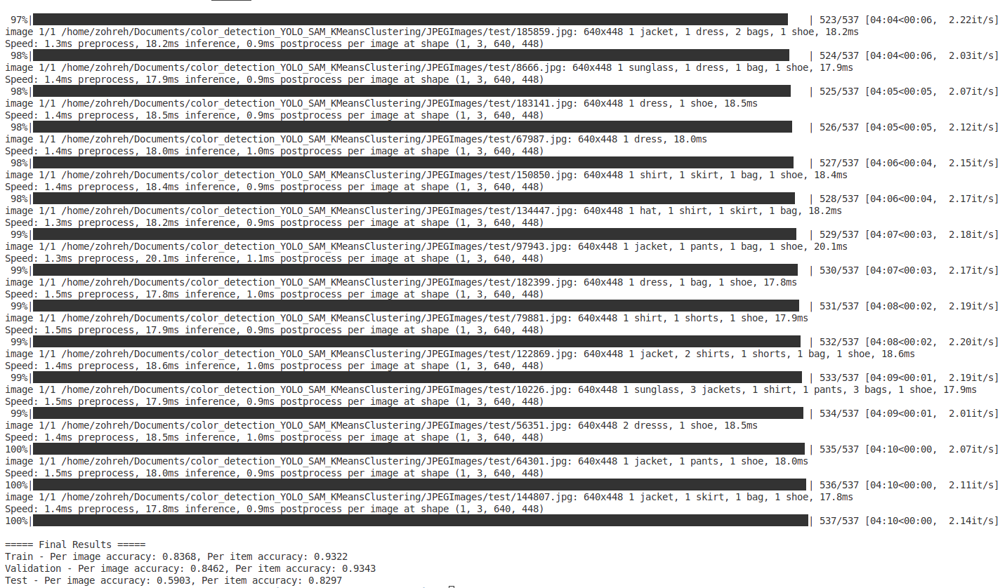

In [23]:
# this operation is computationaly intensive and can not be run in jupyter notbook, thus we run it in terminal and saved the result
from IPython.display import Image, display

display(Image(filename='/home/zohreh/Pictures/Screenshots/Screenshot from 2024-09-15 12-35-08.png'))


#### 3.1.2.1 graph for Accuracy per item and per image for train/validation/test set

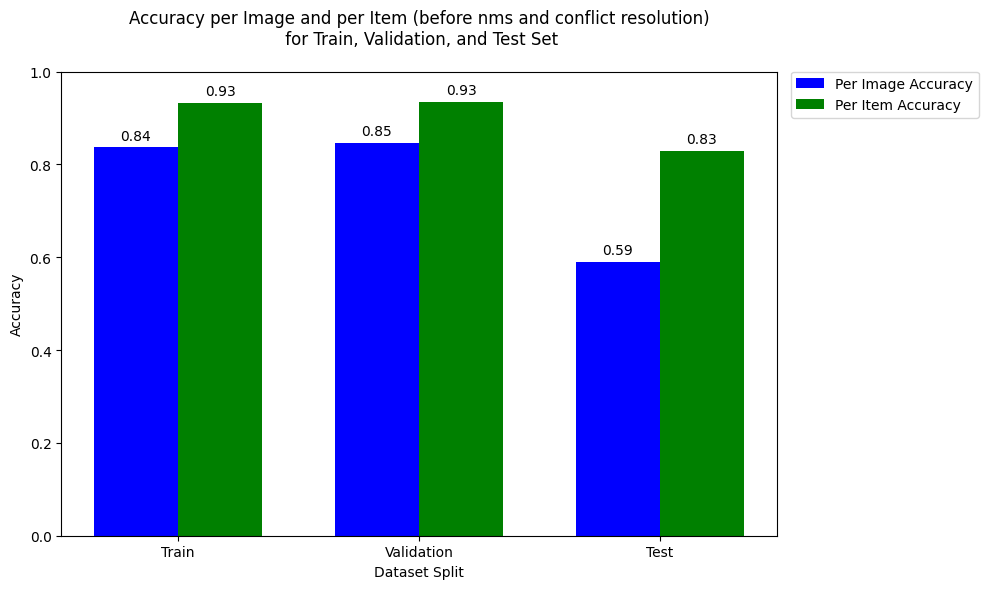

In [5]:
import matplotlib.pyplot as plt
import numpy as np

# Define accuracy data
categories = ['Train', 'Validation', 'Test']
per_image_accuracy = [0.8368, 0.8462, 0.5903]
per_item_accuracy = [0.9322, 0.9343, 0.8297]

# Define bar width and positions
bar_width = 0.35
index = np.arange(len(categories))

# Create the bar plot
plt.figure(figsize=(10, 6))
bars_image = plt.bar(index, per_image_accuracy, bar_width, label='Per Image Accuracy', color='blue')
bars_item = plt.bar(index + bar_width, per_item_accuracy, bar_width, label='Per Item Accuracy', color='green')

# Add labels and title
plt.xlabel('Dataset Split')
plt.ylabel('Accuracy')
plt.title('Accuracy per Image and per Item (before nms and conflict resolution)\n for Train, Validation, and Test Set' , pad=20)

plt.xticks(index + bar_width / 2, categories)
plt.ylim(0, 1)  # Set y-axis limit from 0 to 1 since accuracy is a percentage

# Move the legend outside the plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0.)

# Add text labels on top of the bars
for bar in bars_image:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.01, f'{yval:.2f}', ha='center', va='bottom')

for bar in bars_item:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.01, f'{yval:.2f}', ha='center', va='bottom')

# Display the plot
plt.tight_layout()
plt.show()


### 4. Identification of Issues

The test set shows an accuracy of 0.83 per item but only 0.59 per image. This means the model is good at detecting individual objects but struggles when there are 

multiple objects in an image.

To improve the per image accuracy, we need to focus on fixing cases where multiple conflicting items are detected together, such as when the model predicts items 

that can’t logically be worn together. This confusion leads to lower accuracy.








#### 4.1 Use Inference on the dataset to Visualize the detected clothing items for one sample from images


image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/test/10226.jpg: 640x448 1 sunglass, 3 jackets, 1 shirt, 1 pants, 3 bags, 1 shoe, 19.1ms
Speed: 1.5ms preprocess, 19.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)


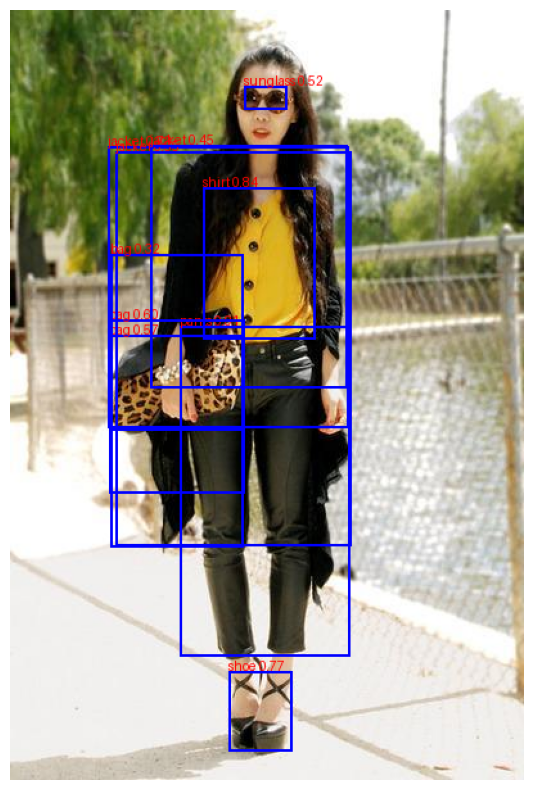

In [20]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from PIL import Image, ImageDraw, ImageFont
from ultralytics import YOLO


# define the pathes
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
annotations_path = "Annotations"
annotations_txt_path = "Annotations_txt"
image_sets_path = "ImageSets/Main"
jpeg_images_path = "JPEGImages"

train_image_path = os.path.join(jpeg_images_path, "train")
val_image_path = os.path.join(jpeg_images_path, "val")
test_image_path = os.path.join(jpeg_images_path, "test")



train_file = os.path.join(image_sets_path, "trainval.txt")
test_file = os.path.join(image_sets_path, "test.txt")

#Load one sample image from the test set
sample_image_path = os.path.join(test_image_path, "10226.jpg")

image = Image.open(sample_image_path).convert('RGB')
draw = ImageDraw.Draw(image)
font = ImageFont.load_default()


# path to the best weight from fine tuning yolov8 on our dataset
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train','weights')
best_weights_path = os.path.join(weights_save_path, "best.pt")



# define a function to draw bounding boxes predicted by yolo
def show_image_with_bbox(best_weights_path):
  
  # Load model and run inference
  model = YOLO(best_weights_path)
  results = model(sample_image_path)
  # print(results[0])
    
  for result in results:
    boxes = result.boxes

    for box in boxes:

      x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
      confidence = box.conf[0].item()         # Get confidence score
      class_id = int(box.cls[0])              # Get class id
      label = model.names[class_id]           # Get label for class id

      # Draw bounding box on the image
      draw.rectangle([x1, y1, x2, y2], outline="blue", width=2)
      
      # Put label and confidence score on the image
      draw.text((x1, y1 - 10), f"{label} {confidence:.2f}", fill="red", font=font)
      
      

  #Display the image with bounding boxes
  plt.figure(figsize=(10, 10))
  plt.imshow(image)
  plt.axis('off')
  plt.show()
  
show_image_with_bbox(best_weights_path)



As we can see, there are multiple bboxes detected by model over the same object with different confidence scores.

To ensure more reliable results in later stages, such as segmentation and color detection, it's crucial to address and eliminate these overlapping and redundant
bounding boxes first. 

In order to retain bounding boxes with highest confidence score and discard the ones with lowest score, we use Non-Maximum-Suppression, which handle this situation

perfectly.

#### 4.2. Post-Processing-Non-Maximum-Suppression


image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/test/10226.jpg: 640x448 1 sunglass, 3 jackets, 1 shirt, 1 pants, 3 bags, 1 shoe, 18.0ms
Speed: 1.5ms preprocess, 18.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)


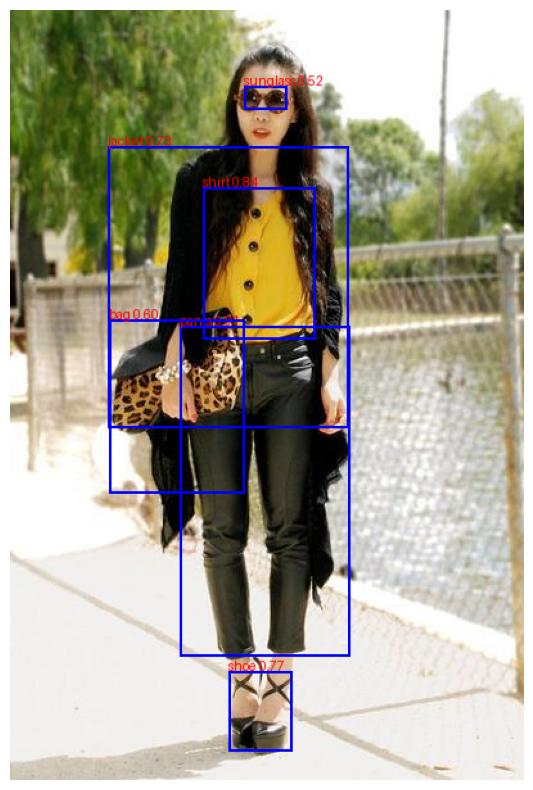

In [36]:
import os
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision.ops import nms  # Import NMS from torchvision
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont


def detect_and_draw_nms_boxes(image_path, model_path, iou_threshold=0.5):
    
    """
    Detect objects in an image using a YOLO model, apply Non-Maximum Suppression (NMS),
    and draw the resulting bounding boxes on the image.

    Parameters:
    - image_path: Path to the image file.
    - model_path: Path to the YOLO model weights file.
    - iou_threshold: IoU threshold for NMS (default is 0.5).

    Returns:
    - image_with_boxes: Image with drawn bounding boxes after NMS.
    
    """
    # Load model and perform inference
    model = YOLO(best_weights_path)
    results = model(sample_image_path)
    
    # Load sample image
    image = Image.open(image_path).convert('RGB')
    draw = ImageDraw.Draw(image)
    font = ImageFont.load_default()
    
    # Prepare the data for NMS
    boxes_list = []
    scores_list = []
    labels_list = []
    
    for result in results:
        boxes = result.boxes                        #list of dictionries containing(xysy, conf, cls)
        for box in boxes:                           # extract the box object from the result
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
            confidence = box.conf[0].item()         # Get confidence score
            class_id = int(box.cls[0])              # Get class id
            label = model.names[class_id]           # Get label for class id

            boxes_list.append([x1, y1, x2, y2])
            scores_list.append(confidence)
            labels_list.append(class_id)
            
    # Convert to tensors for applying NMS
    boxes_tensor = torch.tensor(boxes_list, dtype=torch.float32)
    scores_tensor = torch.tensor(scores_list, dtype=torch.float32)
    
    #Perform Non-Maximum Suppression (NMS)
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)
    
     # Filter boxes, scores, and labels based on NMS output
    nms_boxes = boxes_tensor[nms_indices].tolist()
    nms_scores = scores_tensor[nms_indices].tolist()
    nms_labels = [labels_list[i] for i in nms_indices]
    
    
     # Draw the best bounding boxes on the image
    for i, box in enumerate(nms_boxes):
        x1, y1, x2, y2 = map(int, box)
        confidence = nms_scores[i]
        label = model.names[nms_labels[i]]

        draw.rectangle([x1, y1, x2, y2], outline="blue", width=2)
        draw.text((x1, y1 - 10), f"{label} {confidence:.2f}", fill="red", font=font)

    # Display the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    return image

             

# path to annotations and images
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
annotations_path = "Annotations"
annotations_txt_path = "Annotations_txt"
image_sets_path = "ImageSets/Main"
jpeg_images_path = "JPEGImages"

train_image_path = os.path.join(jpeg_images_path, "train")
val_image_path = os.path.join(jpeg_images_path, "val")
test_image_path = os.path.join(jpeg_images_path, "test")

train_file = os.path.join(image_sets_path, "trainval.txt")
test_file = os.path.join(image_sets_path, "test.txt")

# Load sample image
sample_image_path = os.path.join(test_image_path, "10226.jpg")
image = Image.open(sample_image_path).convert('RGB')
draw = ImageDraw.Draw(image)
font = ImageFont.load_default()

# path to best weight from finetuning model
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train', 'weights')
best_weights_path = os.path.join(weights_save_path, "best.pt")


#call the function
image_with_nms_boxes = detect_and_draw_nms_boxes(sample_image_path, best_weights_path, iou_threshold=0.5)


As we see after post-processing with NMS, image shows cleaner and more precise detections, making it suitable for later tasks like segmentation and color detection.

### 4.2.1 Use Inference on the dataset considering NMS logic, for further exploring issues


image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train/13689.jpg: 640x448 1 shirt, 1 dress, 1 shoe, 18.2ms
Speed: 1.5ms preprocess, 18.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 448)


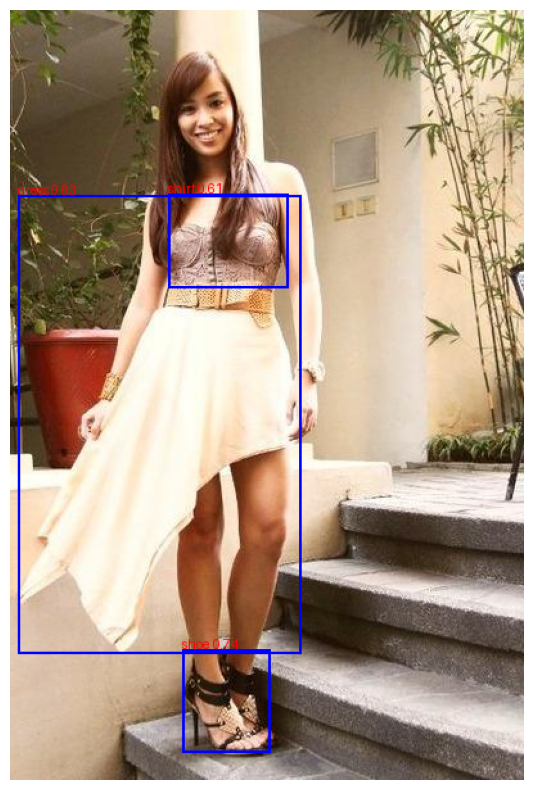

In [37]:
import os
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision.ops import nms  # Import NMS from torchvision
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont


def detect_and_draw_nms_boxes(image_path, model_path, iou_threshold=0.5):
    
    """
    Detect objects in an image using a YOLO model, apply Non-Maximum Suppression (NMS),
    and draw the resulting bounding boxes on the image.

    Parameters:
    - image_path: Path to the image file.
    - model_path: Path to the YOLO model weights file.
    - iou_threshold: IoU threshold for NMS (default is 0.5).

    Returns:
    - image_with_boxes: Image with drawn bounding boxes after NMS.
    
    """
    # Load model and perform inference
    model = YOLO(best_weights_path)
    results = model(sample_image_path)
    
    # Load sample image
    image = Image.open(image_path).convert('RGB')
    draw = ImageDraw.Draw(image)
    font = ImageFont.load_default()
    
    # Prepare the data for NMS
    boxes_list = []
    scores_list = []
    labels_list = []
    
    for result in results:
        boxes = result.boxes  #list of dictionries containing(xysy, conf, cls)
        for box in boxes: # extract the box object from the result
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
            confidence = box.conf[0].item()  # Get confidence score
            class_id = int(box.cls[0])  # Get class id
            label = model.names[class_id]  # Get label for class id

            boxes_list.append([x1, y1, x2, y2])
            scores_list.append(confidence)
            labels_list.append(class_id)
            
            
    # Convert to tensors for NMS
    boxes_tensor = torch.tensor(boxes_list, dtype=torch.float32)
    scores_tensor = torch.tensor(scores_list, dtype=torch.float32)
    
    
    #Perform Non-Maximum Suppression (NMS)
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)
    
     # Filter boxes, scores, and labels based on NMS output
    nms_boxes = boxes_tensor[nms_indices].tolist()
    nms_scores = scores_tensor[nms_indices].tolist()
    nms_labels = [labels_list[i] for i in nms_indices]
    
    
     # Draw the best bounding boxes on the image
    for i, box in enumerate(nms_boxes):
        x1, y1, x2, y2 = map(int, box)
        confidence = nms_scores[i]
        label = model.names[nms_labels[i]]

        draw.rectangle([x1, y1, x2, y2], outline="blue", width=2)
        draw.text((x1, y1 - 10), f"{label} {confidence:.2f}", fill="red", font=font)

    # Display the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    return image

            
    

# path to images and annotations
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
annotations_path = "Annotations"
annotations_txt_path = "Annotations_txt"
image_sets_path = "ImageSets/Main"
jpeg_images_path = "JPEGImages"

train_image_path = os.path.join(jpeg_images_path, "train")
val_image_path = os.path.join(jpeg_images_path, "val")
test_image_path = os.path.join(jpeg_images_path, "test")

train_file = os.path.join(image_sets_path, "trainval.txt")
test_file = os.path.join(image_sets_path, "test.txt")

# Load sample image
sample_image_path = os.path.join(train_image_path, "13689.jpg")
image = Image.open(sample_image_path).convert('RGB')
draw = ImageDraw.Draw(image)
font = ImageFont.load_default()

# path to best weight from fine-tuning model on dataset
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train', 'weights')
best_weights_path = os.path.join(weights_save_path, "best.pt")


#call the function
image_with_nms_boxes = detect_and_draw_nms_boxes(sample_image_path, best_weights_path, iou_threshold=0.5)

in this image there are two items detected by model. shirt and dress. we know these items can not be worn by a person at the same time. so we need to provide a dictionary of conflicting items and we need to resolve this issue .

The conflict resolution step in this code aims to remove logically inconsistent items from the final object detection results. The logic is based on the 
assumption that certain clothing items cannot be worn together simultaneously, such as wearing a skirt and pants at the same time or dress and shirt. To address this, a conflict resolution logic is implemented to filter out conflicting detections based on their confidence scores

### 4.2.2 Post-Processing (Conflict Resolution)


image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train/13689.jpg: 640x448 1 shirt, 1 dress, 1 shoe, 19.1ms
Speed: 1.5ms preprocess, 19.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)


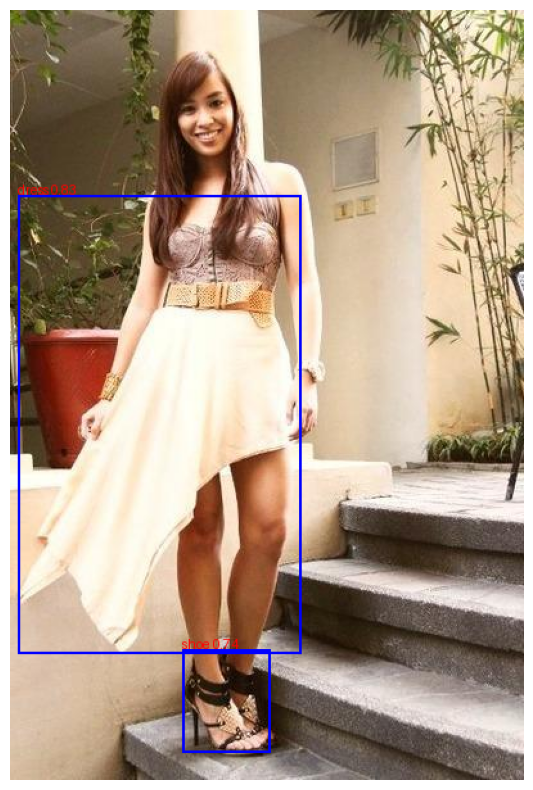

In [21]:
import os
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision.ops import nms  # Import NMS from torchvision
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont


def detect_and_draw_nms_boxes(image_path, model_path, iou_threshold=0.5):
    """
    Detect objects in an image using a YOLO model, apply Non-Maximum Suppression (NMS),
    apply conflict resolution, and draw the resulting bounding boxes on the image.

    Parameters:
    - image_path: Path to the image file.
    - model_path: Path to the YOLO model weights file.
    - iou_threshold: IoU threshold for NMS (default is 0.5).

    Returns:
    - image_with_boxes: Image with drawn bounding boxes after NMS and conflict resolution.
    """
    # Load model and perform inference
    model = YOLO(model_path)
    results = model(image_path)

    # Load sample image
    image = Image.open(image_path).convert('RGB')
    draw = ImageDraw.Draw(image)
    font = ImageFont.load_default()

    # Prepare the data for NMS
    detected_items = []

    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
            confidence = box.conf.item()  # Get confidence score
            class_id = int(box.cls.item())  # Get class id
            label = model.names[class_id]  # Get label for class id

            detected_items.append({
                'bbox': [x1, y1, x2, y2],
                'confidence': confidence,
                'label': label,
                'class_id': class_id
            })

    # Convert to tensors for NMS
    boxes_tensor = torch.tensor([item['bbox'] for item in detected_items], dtype=torch.float32)
    scores_tensor = torch.tensor([item['confidence'] for item in detected_items], dtype=torch.float32)

    # Perform Non-Maximum Suppression (NMS)
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)

    # Filter the detected items based on NMS output
    nms_filtered_items = [detected_items[i] for i in nms_indices]

    # Apply conflict resolution on the filtered items
    final_items = conflict_resolution(nms_filtered_items)
    
    
    
    # Draw the final bounding boxes on the image after conflict resolution
    for item in final_items:
        x1, y1, x2, y2 = item['bbox']
        confidence = item['confidence']
        label = item['label']

        draw.rectangle([x1, y1, x2, y2], outline="blue", width=2)
        draw.text((x1, y1 - 10), f"{label} {confidence:.2f}", fill="red", font=font)
        

    # Display the image with bounding boxes
        plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    return image



# conflict resolution function
def conflict_resolution(items):
    final_items = []
    items_dict = {}                           # each detected items is stored in items_dict dictionary
    for i, item in enumerate(items):
        items_dict[item['label']] = {'confidence': item['confidence'],
                                     'idx': i}


# A predefined dictionary conflicts specifies which clothing items conflict with each other

    conflicts = {
        'shirt': ['dress'],
        'pants': ['shorts', 'skirt'],
        'shorts': ['pants', 'skirt'],
        'skirt': ['pants', 'shorts'],
        'dress': ['shirt']
    }
    
#for each item in items_dict, if its label is in the conflicts dictionary, it checks for other items that have conflicting labels.
    conflict_pairs = []   
    for k in items_dict.keys():   
        if k not in conflicts:
            final_items.append(items[items_dict[k]['idx']])
        else:
            flag = True
            for conflict in conflicts[k]:
                if conflict in items_dict.keys():
                    if set([k, conflict]) not in conflict_pairs:
                        conflict_pairs.append(set([k, conflict]))  # pair of conflicting items will be added to conflict_pairs dictionary
                    flag = False
            if flag:
                final_items.append(items[items_dict[k]['idx']])

    for i, pair in enumerate(conflict_pairs):
        conflict_pairs[i] = list(pair)
    winners = []
    

# resolves conflicts by comparing the confidence scores of the conflicting items. The item with the higher confidence is kept, and the item with the lower confidence is discarded.
#if neither item in a conflicting pair is already present in the final list (winners), the one with the higher confidence is added to final_items.

    for pair in conflict_pairs:
        if pair[0] in winners:
            final_items.append(items[items_dict[pair[0]]['idx']])
        elif pair[1] in winners:
            final_items.append(items[items_dict[pair[1]]['idx']])
        elif items_dict[pair[0]]['confidence'] > items_dict[pair[1]]['confidence']:
            final_items.append(items[items_dict[pair[0]]['idx']])
            winners.append(pair[0])
        else:
            final_items.append(items[items_dict[pair[1]]['idx']])
            winners.append(pair[1])
    return final_items




# path to images and annotations
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
annotations_path = "Annotations"
annotations_txt_path = "Annotations_txt"
image_sets_path = "ImageSets/Main"
jpeg_images_path = "JPEGImages"

train_image_path = os.path.join(jpeg_images_path, "train")
val_image_path = os.path.join(jpeg_images_path, "val")
test_image_path = os.path.join(jpeg_images_path, "test")

train_file = os.path.join(image_sets_path, "trainval.txt")
test_file = os.path.join(image_sets_path, "test.txt")

# Load sample image
sample_image_path = os.path.join(train_image_path, "13689.jpg")


# pathes to best weights from fine-tuning with yolo
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train', 'weights')
best_weights_path = os.path.join(weights_save_path, "best.pt")

# Call the function
image_with_nms_boxes = detect_and_draw_nms_boxes(sample_image_path, best_weights_path, iou_threshold=0.5)

This process is to ensure the model does not detect clothing items that are conflicting with each other. For instance, if the model detects a “dress” and a “shirt” separately, we remove the one that has a lower confidence, since a person cannot wear a dress and a shirt at the same time

### 5.Evaluate the model on the test set with(Precision-Recall Curve) and calculate Accuracy on train/val/test after Post-Processing

In [ ]:
import os
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision.ops import nms  # Import NMS from torchvision
from ultralytics import YOLO
from PIL import Image, ImageDraw
import glob
from tqdm import tqdm
import scipy.optimize
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from icecream import ic  # Importing the icecream library



# path to the images
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
train_image_path = os.path.join(jpeg_images_path, "train")
val_image_path = os.path.join(jpeg_images_path, "val")
test_image_path = os.path.join(jpeg_images_path, "test")


# Initialize SAM2 model
checkpoint = os.path.join(base_path, "segment-anything-2/checkpoints/sam2_hiera_large.pt")
model_cfg = "sam2_hiera_l.yaml"
sam_model = build_sam2(model_cfg, checkpoint).to('cuda')  # Move SAM model to GPU
mask_predictor = SAM2ImagePredictor(sam_model)  # Initialize the SAM2ImagePredictor


# Initialize performance counters
def initialize_counters():
    return {
        'per_item_correct': torch.tensor(0, device='cuda'),
        'per_item_total': torch.tensor(0, device='cuda'),
        'per_image_correct': torch.tensor(0, device='cuda'),
        'per_image_total': torch.tensor(0, device='cuda')
    }

train_counters = initialize_counters()
val_counters = initialize_counters()
test_counters = initialize_counters()

# path to the images
jpeg_images_path = "JPEGImages"
train_image_path = os.path.join(jpeg_images_path, "train")
val_image_path = os.path.join(jpeg_images_path, "val")
test_image_path = os.path.join(jpeg_images_path, "test")

annotations_path = "Annotations"


# Paths to the YOLO model checkpoint and image directories
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train', 'weights')
best_weights_path = os.path.join(weights_save_path, "best.pt")



# function for inference yolo on dataset, then apply NMS , Apply conflict resolution to get finall items
def detect_and_draw_nms_boxes(image_path, model_path, iou_threshold=0.5):
    model = YOLO(model_path).to('cuda')  # Move YOLO model to GPU
    results = model(image_path)
    image = Image.open(image_path).convert('RGB')
    draw = ImageDraw.Draw(image)

    detected_items = []   # detected items by yolo is added to detected_items list

    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            confidence = box.conf.item()
            class_id = int(box.cls.item())
            label = model.names[class_id]

            detected_items.append({
                'bbox': [x1, y1, x2, y2],
                'confidence': confidence,
                'label': label,
                'class_id': class_id
            })
        

    boxes_tensor = torch.tensor([item['bbox'] for item in detected_items], dtype=torch.float32, device='cuda')
    scores_tensor = torch.tensor([item['confidence'] for item in detected_items], dtype=torch.float32, device='cuda')
    
    # apply nms on detected boxes
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)
    nms_filtered_items = [detected_items[i] for i in nms_indices]
    
    
    # apply conflict_resolution on items that filtered by nms
    final_items = conflict_resolution(nms_filtered_items)

    for item in final_items:
        x1, y1, x2, y2 = item['bbox']
        confidence = item['confidence']
        label = item['label']

        draw.rectangle([x1, y1, x2, y2], outline="blue", width=2)
        draw.text((x1, y1 - 10), f"{label} {confidence:.2f}", fill="red")

    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    return image


# define conflict resolution function/in order to resolve conflict between items
def conflict_resolution(items):
    final_items = []
    items_dict = {}
    for i, item in enumerate(items):
        items_dict[item['label']] = {'confidence': item['confidence'], 'idx': i}

    conflicts = {
        'shirt': ['dress'],
        'pants': ['shorts', 'skirt'],
        'shorts': ['pants', 'skirt'],
        'skirt': ['pants', 'shorts'],
        'dress': ['shirt']
    }

    conflict_pairs = []
    for k in items_dict.keys():
        if k not in conflicts:
            final_items.append(items[items_dict[k]['idx']])
        else:
            flag = True
            for conflict in conflicts[k]:
                if conflict in items_dict.keys():
                    if set([k, conflict]) not in conflict_pairs:
                        conflict_pairs.append(set([k, conflict]))
                    flag = False
            if flag:
                final_items.append(items[items_dict[k]['idx']])

    for i, pair in enumerate(conflict_pairs):
        conflict_pairs[i] = list(pair)
    winners = []

    for pair in conflict_pairs:
        if pair[0] in winners:
            final_items.append(items[items_dict[pair[0]]['idx']])
        elif pair[1] in winners:
            final_items.append(items[items_dict[pair[1]]['idx']])
        elif items_dict[pair[0]]['confidence'] > items_dict[pair[1]]['confidence']:
            final_items.append(items[items_dict[pair[0]]['idx']])
            winners.append(pair[0])
        else:
            final_items.append(items[items_dict[pair[1]]['idx']])
            winners.append(pair[1])
    return final_items



# function to read annotations from files
def read_txt_annotations(file_path):
    annots = {}
    with open(file_path, 'r') as f:
        lines = f.readlines()
    for line in lines:
        elems = line.split('\n')[0].split(' ')
        annots[int(elems[0])] = [float(elems[1]), float(elems[2]), float(elems[3]), float(elems[4])]
    return annots




#this function calculates the Intersection over Union (IoU) for two bounding boxes given in the [x1, y1, x2, y2] format.
def bb_intersection_over_union(boxA, boxB):
    xA = max(boxA[0], boxB[0])                                         # calculate the coordinates of the intersection
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxB[3], boxA[3])
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)              # calculate the area  of intersection
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)       # calculate the area of both boxes
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    iou = interArea / float(boxAArea + boxBArea - interArea)           # This value is between 0 (no overlap) and 1 (complete overlap)
    return iou



# step to convert Cx, Cy, w, h into format  x,1, y1, x2, y2 and apply bb_intersection_over_union to return iou 
def iou(bbox1, bbox2):
    x1, y1, w1, h1 = bbox1
    x2, y2, w2, h2 = bbox2
    bbox1_xyxy = np.array([x1 - w1, y1 - h1, x1 + w1, y1 + h1])
    bbox2_xyxy = np.array([x2 - w2, y2 - h2, x2 + w2, y2 + h2])
    iou_value = bb_intersection_over_union(bbox1_xyxy, bbox2_xyxy)
    return iou_value




def class_to_label(class_id):
    classes = ['sunglass', 'hat', 'jacket', 'shirt', 'pants', 'shorts', 'skirt', 'dress', 'bag', 'shoe']
    return classes[class_id]



# define hungarian matching algorithm
def find_all_gt_labels(final_items, annots, model):
    new_final_items = []
    cost_matrix = []
    keys = list(annots.keys())
    class_ids = []
    for item in final_items:
        class_id = item['class_id']
        class_ids.append(class_id)
        
        ious = []
        for k in keys:
            ious.append(iou(annots[k], item['box_xywhn']))
        cost_matrix.append(ious)
    row_ind, col_ind = scipy.optimize.linear_sum_assignment(cost_matrix=cost_matrix, maximize=True)
   
    for i, l in enumerate(col_ind):
        final_items[i]['gt_id'] = keys[l]
        final_items[i]['gt_label'] = class_to_label(keys[l])
        new_final_items.append(final_items[i])
    
    return new_final_items



# define function for run inference with yolo and generate segmentation masks with sam 
def detect_and_segment_objects(base_path, sub_folder, segmented_images_dir, image_path, yolo_weights_path, counters):
    orig_filename = os.path.basename(image_path)
    annotations_path = image_path.split('.jpg')[0] + '.txt'
    annotations = read_txt_annotations(annotations_path)

    model = YOLO(yolo_weights_path).to('cuda')

    image = Image.open(image_path).convert('RGB')
    image_rgb = np.array(image)
    image_bgr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)

    results = model(image_path)

    detected_items = []
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])  
            confidence = box.conf[0].item()  
            class_id = int(box.cls[0])  
            label = model.names[class_id]  
            detected_items.append({
                'label': label,
                'coordinates': (x1, y1, x2, y2),
                'confidence': confidence,
                'box_xywhn': box.xywhn[0].cpu().numpy().tolist(),
                'class_id': class_id
            })

    boxes_tensor = torch.tensor([item['coordinates'] for item in detected_items], dtype=torch.float32, device='cuda')
    scores_tensor = torch.tensor([item['confidence'] for item in detected_items], dtype=torch.float32, device='cuda')
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold=0.5)
    nms_filtered_items = [detected_items[i] for i in nms_indices]

    final_items = conflict_resolution(nms_filtered_items)
    final_items = find_all_gt_labels(final_items, annotations, model)

    predicted_boxes = []
    labels = []
    gt_labels = []

    mask_predictor.set_image(image_bgr)

    for item in final_items:
        predicted_boxes.append(item['coordinates'])
        labels.append(item['label'])
        gt_labels.append(item['gt_label'])

    per_image_not_correct = False
    for i, l in enumerate(labels):
        counters['per_item_total'] += 1
        if gt_labels[i] == l:
            counters['per_item_correct'] += 1
        else:
            per_image_not_correct = True

    if not per_image_not_correct:
        counters['per_image_correct'] += 1

    counters['per_image_total'] += 1

    predicted_boxes = np.array(predicted_boxes)
    masks, scores, _ = mask_predictor.predict(
                        point_coords=None,
                        point_labels=None,
                        box=predicted_boxes[None, :],
                        multimask_output=False,
    )

    save_path_orig_filename = os.path.join(segmented_images_dir, orig_filename)
    orig_image = Image.fromarray(image_rgb)
    orig_image.save(save_path_orig_filename)

    for i, mask in enumerate(masks):
        mask = mask[0].astype(np.uint8)  

        mask_image = Image.fromarray(mask * 255)  
        mask_filename = os.path.join(segmented_images_dir, orig_filename.split('.')[0] + f'_mask_yolo_{labels[i]}_gt_{gt_labels[i]}.png')
        mask_image.save(mask_filename)
        
        

def process_dataset(image_paths, segmented_images_dir, yolo_weights_path, counters):
    os.makedirs(segmented_images_dir, exist_ok=True)
    for image_path in tqdm(image_paths):
        detect_and_segment_objects(base_path, sub_folder, segmented_images_dir, image_path, yolo_weights_path, counters)

# Process training set
sub_folder = 'train'
train_files = glob.glob(os.path.join(train_image_path, '*.jpg'))
segmented_train_dir = os.path.join(base_path, "segmented_images", sub_folder)
process_dataset(train_files, segmented_train_dir, best_weights_path, train_counters)

# Process validation set
sub_folder = 'val'
val_files = glob.glob(os.path.join(val_image_path, '*.jpg'))
segmented_val_dir = os.path.join(base_path, "segmented_images", sub_folder)
process_dataset(val_files, segmented_val_dir, best_weights_path, val_counters)

# Process test sets
sub_folder = 'test'
test_files = glob.glob(os.path.join(test_image_path, '*.jpg'))
segmented_test_dir = os.path.join(base_path, "segmented_images", sub_folder)
process_dataset(test_files, segmented_test_dir, best_weights_path, test_counters)

# Calculate and print accuracy for train, val, and test sets
def calculate_and_print_accuracy(counters, dataset_name):
    per_image_accuracy = counters['per_image_correct'].item() / counters['per_image_total'].item()
    per_item_accuracy = counters['per_item_correct'].item() / counters['per_item_total'].item()
    print(f'{dataset_name} - Per image accuracy: {per_image_accuracy:.4f}')
    print(f'{dataset_name} - Per item accuracy: {per_item_accuracy:.4f}')

calculate_and_print_accuracy(train_counters, "Train")
calculate_and_print_accuracy(val_counters, "Validation")
calculate_and_print_accuracy(test_counters, "Test")

### 5.1. The result of using Non-Maximum Suppression/ Resolved Conflict / Hungarian Algorithm

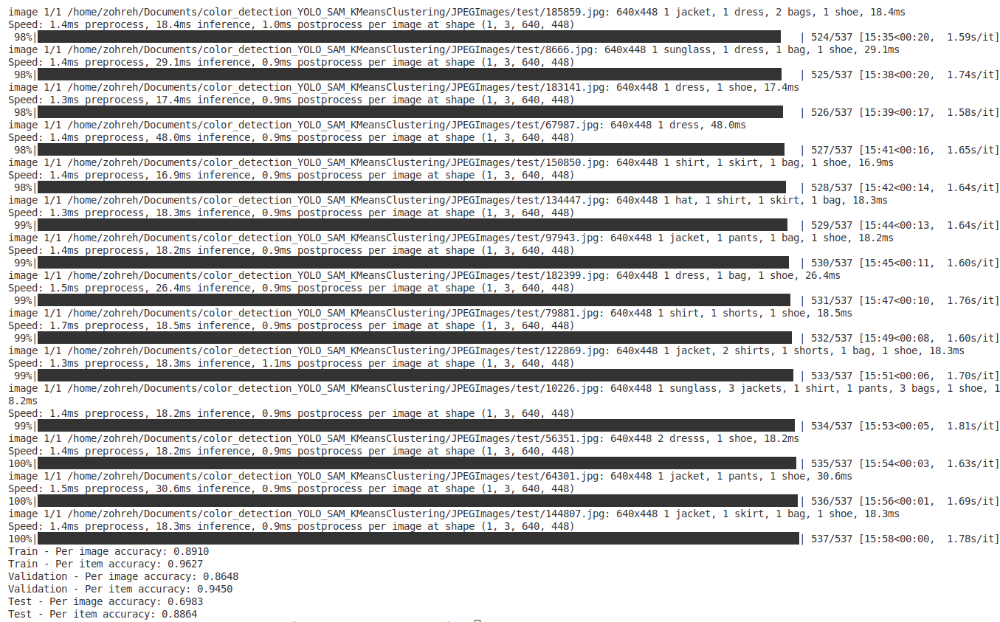

In [2]:
# the previous code is computationaly intensive and can not be run in jupyter notebook, hence we run it in terminal and saved the result and graph

from IPython.display import Image, display

display(Image(filename='/home/zohreh/Pictures/Screenshots/Screenshot from 2024-08-30 07-20-09.png'))


### 5.2. Graph for Accuracy per item and per image for test and validation set

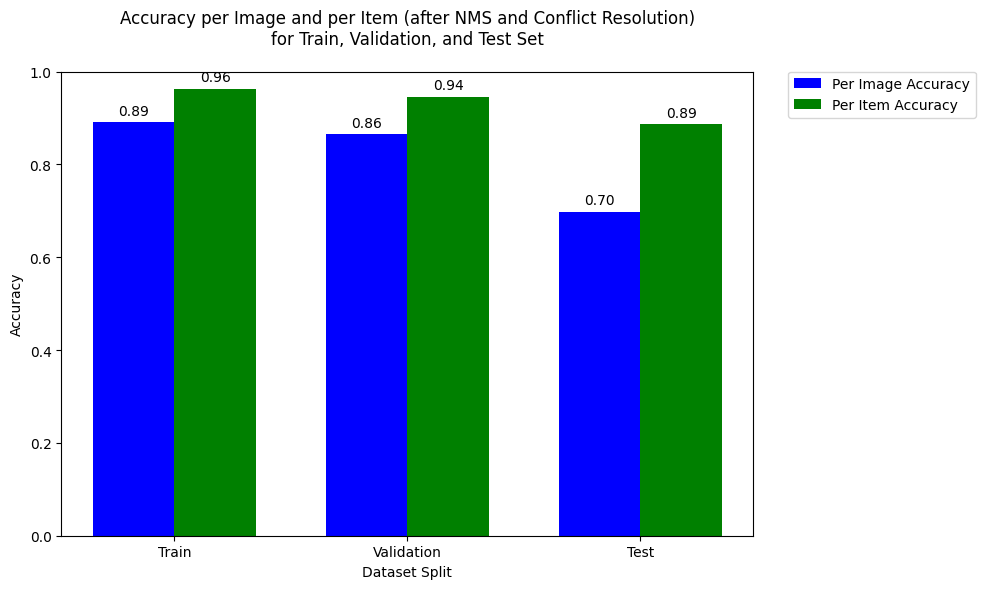

In [8]:
import matplotlib.pyplot as plt
import numpy as np

# Define accuracy data
categories = ['Train', 'Validation', 'Test']
per_image_accuracy = [0.8910, 0.8648, 0.6983]
per_item_accuracy = [0.9627, 0.9450, 0.8864]

# Define bar width and positions
bar_width = 0.35
index = np.arange(len(categories))

# Create the bar plot
plt.figure(figsize=(10, 6))
bars_image = plt.bar(index, per_image_accuracy, bar_width, label='Per Image Accuracy', color='blue')
bars_item = plt.bar(index + bar_width, per_item_accuracy, bar_width, label='Per Item Accuracy', color='green')

# Add labels and title
plt.xlabel('Dataset Split')
plt.ylabel('Accuracy')
plt.title('Accuracy per Image and per Item (after NMS and Conflict Resolution)\nfor Train, Validation, and Test Set', pad=20)  # Add space with pad
plt.xticks(index + bar_width / 2, categories)
plt.ylim(0, 1)  # Set y-axis limit from 0 to 1 since accuracy is a percentage

# Move the legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

# Add text labels on top of the bars
for bar in bars_image:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.01, f'{yval:.2f}', ha='center', va='bottom')

for bar in bars_item:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.01, f'{yval:.2f}', ha='center', va='bottom')

# Display the plot
plt.tight_layout()
plt.show()

as we see  in bar chart, per item accuracy  is 0.89 and per image accuracy is 0.70. in comparison with the result from baseline model(before preprocessing), the model predict better after post processing.

### 5.3. Percision-Recall Curve (PRC) and AUC-PR

Precision measures the proportion of true positive detections out of all detections made by the model, i.e., how many of the detected objects are actually relevant.


Recall measures the proportion of true positive detections out of all actual objects in the ground truth, i.e., how many of the relevant objects were detected.


AUC-PR is the Area Under the Precision-Recall Curve. It provides a single number summarizing the trade-off between precision and recall across different thresholds.

Mean Average Percision(mAP)

mAP is one of the most commonly used metrics in object detection. It calculates the average precision (AP) for each class and then averages them to produce a single metric.

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision.ops import nms
from ultralytics import YOLO
from PIL import Image
import glob
from tqdm import tqdm
import scipy.optimize
from sklearn.metrics import precision_recall_curve, average_precision_score, auc
from icecream import ic

# Initialize counters for precision-recall
def initialize_pr_data(num_classes):
    return {
        'true_labels': [[] for _ in range(num_classes)],
        'confidences': [[] for _ in range(num_classes)],
        'global_true_labels': [],
        'global_confidences': []
    }

# Paths to the YOLO model checkpoint and image directories
base_path = "./"
jpeg_images_path = "JPEGImages"
test_image_path = os.path.join(jpeg_images_path, "test")
best_weights_path = os.path.join(base_path, 'runs/detect/train/weights', 'best.pt')
# best_weights_path = os.path.join(base_path, 'best.pt')



# Function to convert class ID to label name
def class_to_label(class_id):
    classes = ['sunglass', 'hat', 'jacket', 'shirt', 'pants', 'shorts', 'skirt', 'dress', 'bag', 'shoe']
    return classes[class_id], len(classes)

# Read annotations from text file
def read_txt_annotations(file_path):
    annots = {}
    with open(file_path, 'r') as f:
        lines = f.readlines()
    for line in lines:
        elems = line.split()
        annots[int(elems[0])] = [float(elems[1]), float(elems[2]), float(elems[3]), float(elems[4])]
    return annots

# Convert YOLO bounding boxes from [cx, cy, w, h] to [x1, y1, x2, y2] format
def convert_whn_to_xyxy(box_whn, img_width, img_height):
    center_x, center_y, width, height = box_whn
    x_min = int((center_x - width / 2) * img_width)
    y_min = int((center_y - height / 2) * img_height)
    x_max = int((center_x + width / 2) * img_width)
    y_max = int((center_y + height / 2) * img_height)
    return [x_min, y_min, x_max, y_max]

# IoU calculation
def bb_intersection_over_union(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxB[3], boxA[3])
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

# Conflict resolution function
def conflict_resolution(items):
    final_items = []
    items_dict = {}
    for i,item in enumerate(items):
        items_dict[item['label']] = {'confidence': item['confidence'],
                                     'idx': i}
        
    classes = ['sunglass', 'hat', 'jacket', 'shirt', 'pants', 'shorts', 'skirt', 'dress', 'bag', 'shoe']
    
    conflicts = {'shirt': ['dress'],
                 'pants': ['shorts','skirt'],
                 'shorts': ['pants', 'skirt'],
                 'skirt' : ['pants', 'shorts'],
                 'dress' : ['shirt']
                 }
    
    conflict_pairs = []
    for k in items_dict.keys():
        if k in ['sunglass', 'hat', 'jacket', 'bag', 'shoe']:
            final_items.append(items[items_dict[k]['idx']])
        else:
            flag = True
            for conflict in conflicts[k]:
                if conflict in items_dict.keys():
                    if set([k, conflict]) not in conflict_pairs:
                        conflict_pairs.append(set([k,conflict]))
                    flag = False
            if flag:
                final_items.append(items[items_dict[k]['idx']])
    
    for i,pair in enumerate(conflict_pairs):
        conflict_pairs[i] = list(pair)
    winners = []

    for pair in conflict_pairs:
        if pair[0] in winners:
            final_items.append(items[items_dict[pair[0]]['idx']])
        elif pair[1] in winners:
            final_items.append(items[items_dict[pair[1]]['idx']])
        elif items_dict[pair[0]]['confidence'] > items_dict[pair[1]]['confidence']:
            final_items.append(items[items_dict[pair[0]]['idx']])
            winners.append(pair[0])
        elif items_dict[pair[1]]['confidence'] > items_dict[pair[0]]['confidence']:
            final_items.append(items[items_dict[pair[1]]['idx']])
            winners.append(pair[1])
    return final_items
# Hungarian matching and ground truth association
def find_all_gt_labels(final_items, annots, img_width, img_height):
    cost_matrix = []
    keys = list(annots.keys())

    for item in final_items:
        pred_box_xyxy = convert_whn_to_xyxy(item['box_xywhn'], img_width, img_height)
        
        ious = []
        for k in keys:
            gt_box_xyxy = convert_whn_to_xyxy(annots[k], img_width, img_height)
            ious.append(bb_intersection_over_union(pred_box_xyxy, gt_box_xyxy))
        
        cost_matrix.append(1 - np.array(ious))  # We want to minimize 1 - IoU
    
    # Perform Hungarian matching
    row_ind, col_ind = scipy.optimize.linear_sum_assignment(cost_matrix)
    
    # Assign best matching ground truth to each prediction
    matched_items = []
    for i, l in enumerate(col_ind):
        final_items[i]['gt_id'] = keys[l]
        final_items[i]['gt_label'] = class_to_label(keys[l])[0]
        matched_items.append(final_items[i])
    
    return matched_items

# Detect objects using YOLO, apply NMS, conflict resolution, and Hungarian matching
def detect_and_match_objects(image_path, yolo_weights_path, pr_data, num_classes):
    annotations_path = image_path.replace('.jpg', '.txt')
    annotations = read_txt_annotations(annotations_path)

    model = YOLO(yolo_weights_path).to('cuda')
    results = model(image_path, verbose=False)

    detected_items = []
    for result in results:
        for box in result.boxes:
            confidence = box.conf.item()
            class_id = int(box.cls.item())
            label = class_to_label(class_id)[0]
            detected_items.append({
                'confidence': confidence,
                'box_xywhn': box.xywhn[0].cpu().numpy().tolist(),
                'class_id': class_id,
                'label': label
            })

    # Get image dimensions
    img = Image.open(image_path)
    img_width, img_height = img.size

    # Apply NMS
    boxes_tensor = torch.tensor([convert_whn_to_xyxy(item['box_xywhn'], img_width, img_height) for item in detected_items], dtype=torch.float32)
    scores_tensor = torch.tensor([item['confidence'] for item in detected_items], dtype=torch.float32)
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold=0.5)
    nms_filtered_items = [detected_items[i] for i in nms_indices]

    # Apply conflict resolution
    final_items = conflict_resolution(nms_filtered_items)
    # final_items = nms_filtered_items

    # Perform Hungarian matching between predictions and ground truth
    final_items = find_all_gt_labels(final_items, annotations, img_width, img_height)

    # Update precision-recall data
    for item in final_items:
        class_id = item['class_id']
        confidence = item['confidence']
        gt_label = item['gt_label']

        pr_data['confidences'][class_id].append(confidence)
        pr_data['true_labels'][class_id].append(1 if class_to_label(class_id)[0] == gt_label else 0)

        # Update global precision-recall data for micro-average
        pr_data['global_confidences'].append(confidence)
        pr_data['global_true_labels'].append(1 if class_to_label(class_id)[0] == gt_label else 0)

# Plot Precision-Recall curve, including micro-average PR curve and calculate mAP
def plot_pr_curve_and_auc(pr_data, num_classes):
    plt.figure(figsize=(10, 8))
    ap_per_class = {}
    auc_per_class = {}
    aps = []

    for class_id in range(num_classes):
        if len(pr_data['true_labels'][class_id]) == 0:
            continue

        precision, recall, _ = precision_recall_curve(pr_data['true_labels'][class_id], pr_data['confidences'][class_id])
        ic(precision[0], recall[0], class_id)
        ap = average_precision_score(pr_data['true_labels'][class_id], pr_data['confidences'][class_id])
        pr_auc = auc(recall, precision)

        ap_per_class[class_to_label(class_id)[0]] = ap
        auc_per_class[class_to_label(class_id)[0]] = pr_auc
        aps.append(ap)  # Collect AP for mAP calculation

        plt.plot(recall, precision, label=f"{class_to_label(class_id)[0]} (AP: {ap:.2f}, PR-AUC: {pr_auc:.2f})")

    # Calculate mean average precision (mAP)
    mAP = np.mean(aps)

    # Calculate micro-average precision-recall
    global_precision, global_recall, _ = precision_recall_curve(pr_data['global_true_labels'], pr_data['global_confidences'])
    micro_ap = average_precision_score(pr_data['global_true_labels'], pr_data['global_confidences'])
    micro_pr_auc = auc(global_recall, global_precision)

    plt.plot(global_recall, global_precision, color='black', linestyle='--', label=f"Micro-Average (AP: {micro_ap:.2f}, PR-AUC: {micro_pr_auc:.2f})")

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve for Each Class with AP, PR-AUC, and mAP = {mAP:.2f}')
    plt.legend(loc='lower left')
    plt.grid(True)

    # Save the plot to a file
    # plot_file_path = os.path.join(base_path, "precision_recall_curve_with_ap_and_pr_auc_with_mAP_no_conflict_resolution.png")
    plot_file_path = os.path.join(base_path, "precision_recall_curve_with_ap_and_pr_auc_with_mAP.png")
    plt.savefig(plot_file_path)
    print(f"Precision-Recall curve saved to {plot_file_path}")

    # Print AP, PR-AUC for each class, and mAP
    print("\nAverage Precision (AP) and PR-AUC per class:")
    for class_name in ap_per_class.keys():
        print(f"{class_name}: AP = {ap_per_class[class_name]:.2f}, PR-AUC = {auc_per_class[class_name]:.2f}")

    # Print mAP and micro-average results
    print(f"\nMean Average Precision (mAP): {mAP:.2f}")
    print(f"Micro-Average: AP = {micro_ap:.2f}, PR-AUC = {micro_pr_auc:.2f}")

# Run detection on the entire test set
def process_test_set():
    # Get number of classes
    _, num_classes = class_to_label(0)
    
    # Initialize PR data for each class
    pr_data = initialize_pr_data(num_classes)

    # Test Set
    test_files = glob.glob(os.path.join(test_image_path, '*.jpg'))

    # Process all test images
    for i, image_path in enumerate(tqdm(test_files)):
        
        detect_and_match_objects(image_path, best_weights_path, pr_data, num_classes)

    # Plot Precision-Recall Curve, calculate AUC, mAP
    plot_pr_curve_and_auc(pr_data, num_classes)

# Run the process for the test dataset
process_test_set()


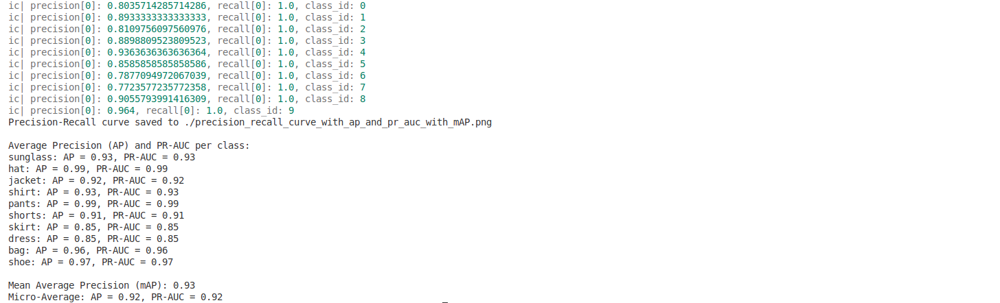

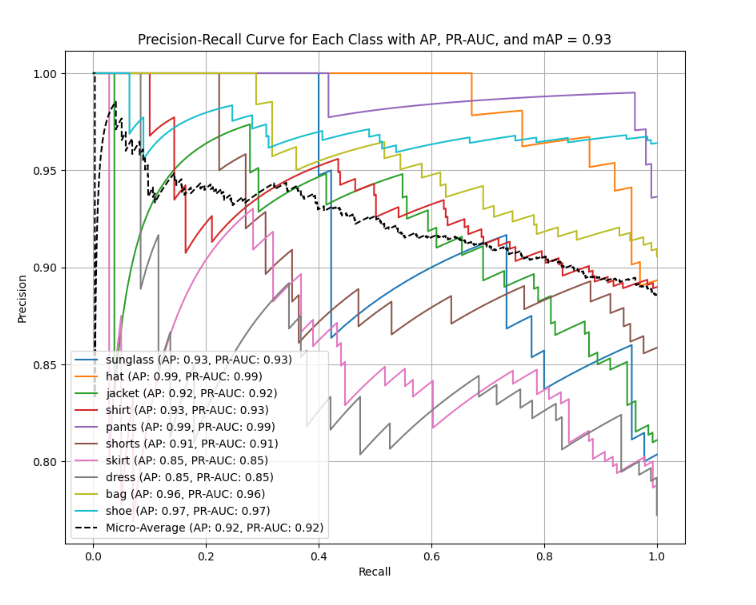

In [6]:
from IPython.display import Image, display

display(Image(filename='/home/zohreh/Pictures/Screenshots/Screenshot from 2024-09-20 00-23-05.png'))
display(Image(filename='/home/zohreh/Pictures/Screenshots/Screenshot from 2024-09-19 23-27-23.png'))



in this graph there is no significance improvement compared to the result before post processing. this might be due to the average  precision.we need further analysing.

### 5.4. Comparison of AUC-PR Curve before and after using Non-Max-Suppression and Conflict Resolution

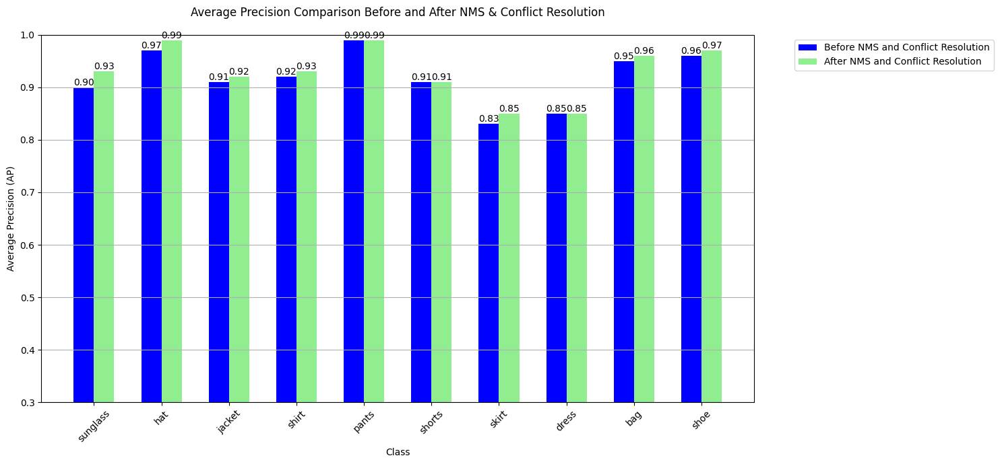

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# Data for AP values
ap_values_before_nms_conflict_resolution = {
    'sunglass': 0.90,
    'hat': 0.97,
    'jacket': 0.91,
    'shirt': 0.92,
    'pants': 0.99,
    'shorts': 0.91,
    'skirt': 0.83,
    'dress': 0.85,
    'bag': 0.95,
    'shoe': 0.96
}

ap_values_after_nms_conflict_resolution = {
    'sunglass': 0.93,
    'hat': 0.99,
    'jacket': 0.92,
    'shirt': 0.93,
    'pants': 0.99,
    'shorts': 0.91,
    'skirt': 0.85,
    'dress': 0.85,
    'bag': 0.96,
    'shoe': 0.97
}

# Extract class names and corresponding AP values for both cases
classes = list(ap_values_before_nms_conflict_resolution.keys())
previous_aps = [ap_values_before_nms_conflict_resolution[cls] for cls in classes]
recent_aps = [ap_values_after_nms_conflict_resolution[cls] for cls in classes]

# Define bar width and positions
bar_width = 0.3
index = np.arange(len(classes))

# Create the bar plot
plt.figure(figsize=(15, 7))
bars1 = plt.bar(index, previous_aps, bar_width, label='Before NMS and Conflict Resolution', color='blue')
bars2 = plt.bar(index + bar_width, recent_aps, bar_width, label='After NMS and Conflict Resolution', color='lightgreen')

# Add labels, title, and legend
plt.xlabel('Class')
plt.ylabel('Average Precision (AP)')
plt.title('Average Precision Comparison Before and After NMS & Conflict Resolution', pad=20)
plt.xticks(index + bar_width / 2, classes, rotation=45)
plt.ylim(0.3, 1)  # Set the y-axis range to [0.3, 1] to fit all AP values
plt.grid(True, axis='y')

# Add numbers on the bars
for bar in bars1:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}', ha='center', va='bottom')

for bar in bars2:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}', ha='center', va='bottom')

# Add a legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()  # Adjust layout to fit labels and title
plt.show()


Across most categories, there is a slight increase in AP after post-processing, which indicates an overall improvement in model performance. This enhancement, 

although not drastic, demonstrates the positive impact of refining bounding box predictions.

#### 5.5. comparison of precision after post processing and improve baseline model predictions

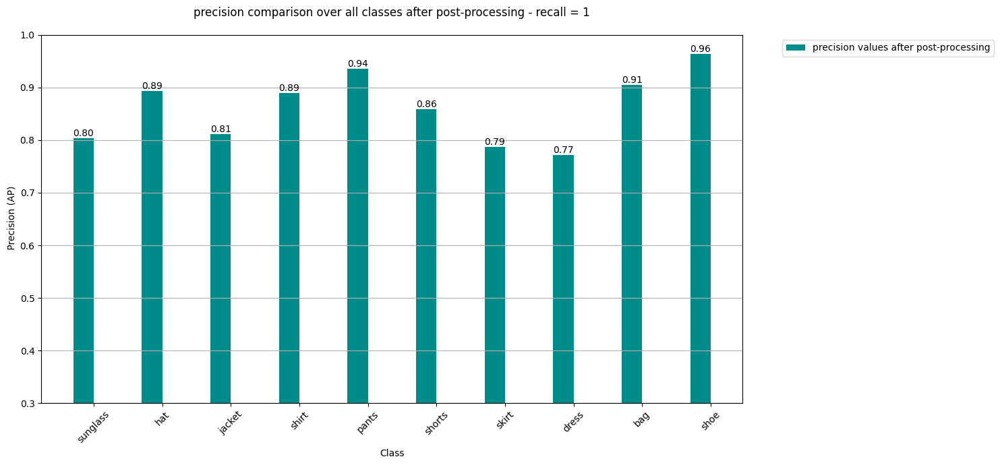

In [18]:

import matplotlib.pyplot as plt
import numpy as np

# Data for AP values
precision_values_when_recall_1 = {
    'sunglass': 0.8036,
    'hat': 0.8933 ,
    'jacket': 0.8109,
    'shirt': 0.8898 ,
    'pants': 0.9363,
    'shorts': 0.8585 ,
    'skirt': 0.7877,
    'dress': 0.7723,
    'bag': 0.9055,
    'shoe': 0.964 
}


# Extract class names and corresponding AP values for both cases
classes = list(precision_values_when_recall_1.keys())
precision_values = [precision_values_when_recall_1[cls] for cls in classes]



# Define bar width and positions
bar_width = 0.3
index = np.arange(len(classes))



# Create the bar plot
plt.figure(figsize=(15, 7))
bars1 = plt.bar(index, precision_values, bar_width, label='precision values after post-processing', color='darkcyan')



# Add labels, title, and legend
plt.xlabel('Class')
plt.ylabel(' Precision (AP)')
plt.title('precision comparison over all classes after post-processing - recall = 1', pad=20)
plt.xticks(index + bar_width / 2, classes, rotation=45)
plt.ylim(0.3, 1)  # Set the y-axis range to [0.3, 1] to fit all AP values
plt.grid(True, axis='y')



# Add numbers on the bars
for bar in bars1:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}', ha='center', va='bottom')



# Add a legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# # Show the plot
plt.tight_layout()  # Adjust layout to fit labels and title
plt.show()






### 5.6. Comparison of Precision in different class when recall = 1

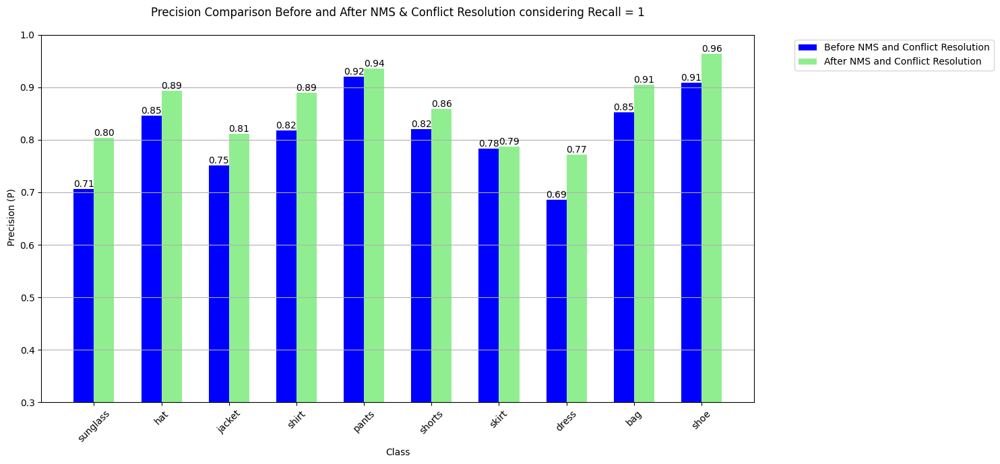

In [21]:
import matplotlib.pyplot as plt
import numpy as np

# Data for AP values
ap_values_before_nms_conflict_resolution = {
    'sunglass': 0.7058,
    'hat': 0.8461,
    'jacket': 0.7513,
    'shirt': 0.8176,
    'pants': 0.9203,
    'shorts': 0.82,
    'skirt': 0.7828,
    'dress': 0.6862,
    'bag': 0.8529,
    'shoe': 0.9087
}

ap_values_after_nms_conflict_resolution = {
    'sunglass': 0.8035,
    'hat': 0.8933,
    'jacket': 0.8109,
    'shirt': 0.8898,
    'pants': 0.9363,
    'shorts': 0.8585,
    'skirt': 0.7877,
    'dress': 0.7723,
    'bag': 0.9055,
    'shoe': 0.964
}

# Extract class names and corresponding AP values for both cases
classes = list(ap_values_before_nms_conflict_resolution.keys())
previous_aps = [ap_values_before_nms_conflict_resolution[cls] for cls in classes]
recent_aps = [ap_values_after_nms_conflict_resolution[cls] for cls in classes]

# Define bar width and positions
bar_width = 0.3
index = np.arange(len(classes))

# Create the bar plot
plt.figure(figsize=(15, 7))
bars1 = plt.bar(index, previous_aps, bar_width, label='Before NMS and Conflict Resolution', color='blue')
bars2 = plt.bar(index + bar_width, recent_aps, bar_width, label='After NMS and Conflict Resolution', color='lightgreen')

# Add labels, title, and legend
plt.xlabel('Class')
plt.ylabel(' Precision (P)')
plt.title('Precision Comparison Before and After NMS & Conflict Resolution considering Recall = 1', pad=20)
plt.xticks(index + bar_width / 2, classes, rotation=45)
plt.ylim(0.3, 1)  # Set the y-axis range to [0.3, 1] to fit all AP values
plt.grid(True, axis='y')

# Add numbers on the bars
for bar in bars1:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}', ha='center', va='bottom')

for bar in bars2:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}', ha='center', va='bottom')

# Add a legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()  # Adjust layout to fit labels and title
plt.show()


the bar chart shows the precision values for all classes have consistently improved with post-processing, especially for categories like sunglass, jacket, and bag,

highlighting the effectiveness of NMS and conflict resolution in reducing false positives. However, challenging classes like dress and skirt still show room for 

improvement, even after the post-processing step.

### 5.7. Comparing Accuracy of prediction before and after applying Non-Max-Suppression and Conflict Resolution

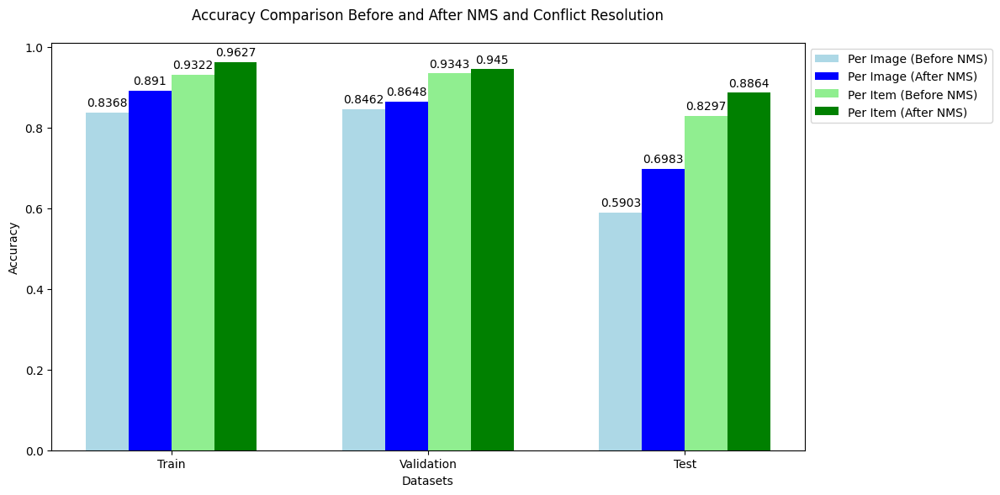

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# Data
datasets = ['Train', 'Validation', 'Test']

# Accuracy after NMS and conflict resolution
per_image_acc_after = [0.8910, 0.8648, 0.6983]
per_item_acc_after = [0.9627, 0.9450, 0.8864]

# Accuracy before NMS and conflict resolution
per_image_acc_before = [0.8368, 0.8462, 0.5903]
per_item_acc_before = [0.9322, 0.9343, 0.8297]

# Bar width and position
bar_width = 0.2
index = np.arange(len(datasets)) * 1.2  # Increase the multiplier to add more space between the groups

# Create subplots
fig, ax = plt.subplots(figsize=(12, 6))

# Adjust the position of the bars to create space between Per Image and Per Item groups
# First group: Per Image (Before and After NMS)
bar1 = ax.bar(index - bar_width, per_image_acc_before, bar_width, label='Per Image (Before NMS)', color='lightblue')
bar2 = ax.bar(index, per_image_acc_after, bar_width, label='Per Image (After NMS)', color='blue')

# Second group: Per Item (Before and After NMS)
bar3 = ax.bar(index + bar_width, per_item_acc_before, bar_width, label='Per Item (Before NMS)', color='lightgreen')
bar4 = ax.bar(index + 2 * bar_width, per_item_acc_after, bar_width, label='Per Item (After NMS)', color='green')

# Add numbers on top of the bars
for bar in bar1 + bar2 + bar3 + bar4:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval + 0.01, round(yval, 4), ha='center', va='bottom')

# Labels, title, and ticks
ax.set_xlabel('Datasets')
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy Comparison Before and After NMS and Conflict Resolution', pad=20)
ax.set_xticks(index + bar_width / 2)  # Shift ticks to align with the center of the bars
ax.set_xticklabels(datasets)

# Move the legend outside of the graph
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show the plot with adjusted layout
plt.tight_layout()
plt.show()

### 6. Segmentation with SAMv2 (Segment Anything Model)


image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train/191571.jpg: 640x448 1 jacket, 1 shirt, 1 pants, 1 bag, 1 shoe, 15.6ms
Speed: 2.0ms preprocess, 15.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 448)


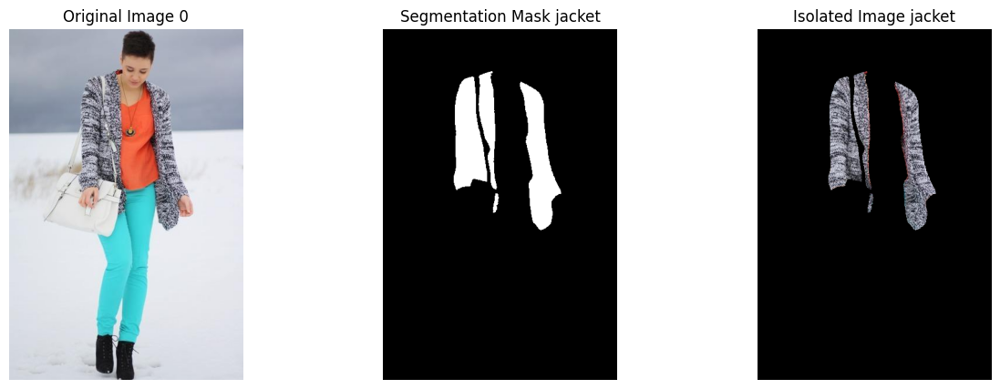

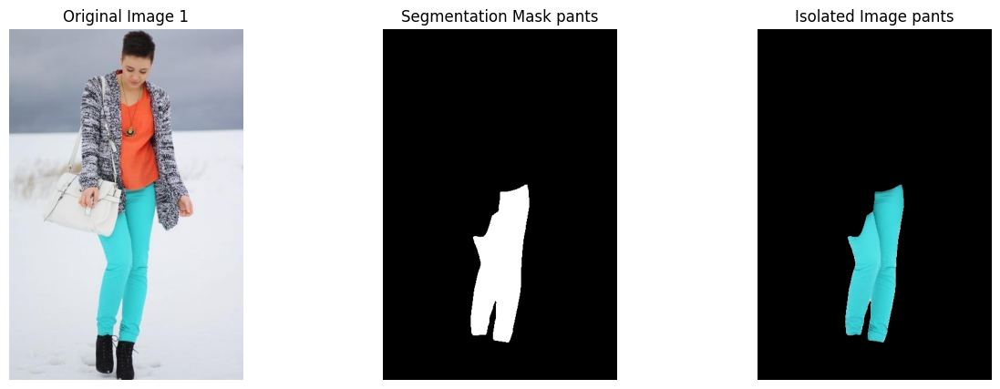

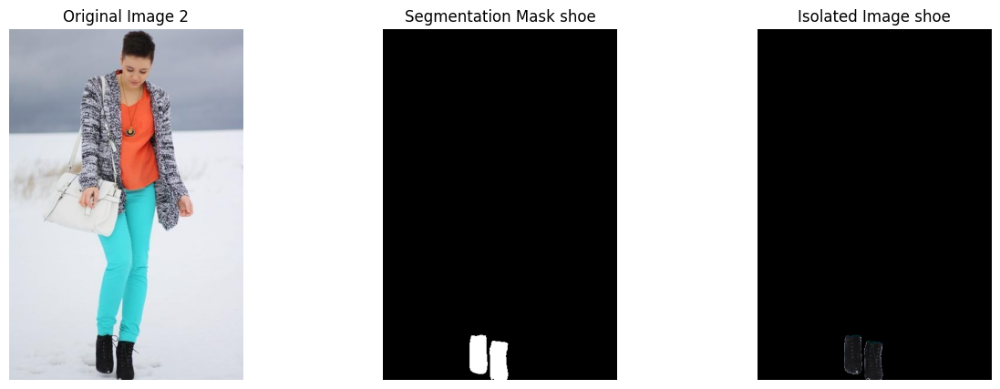

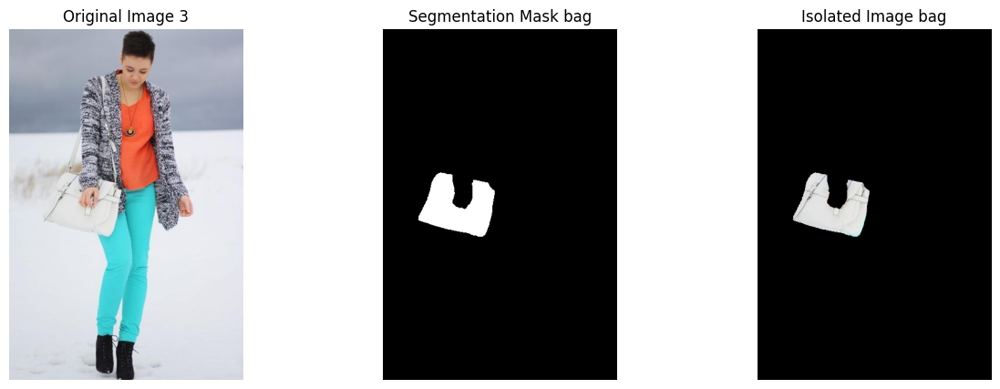

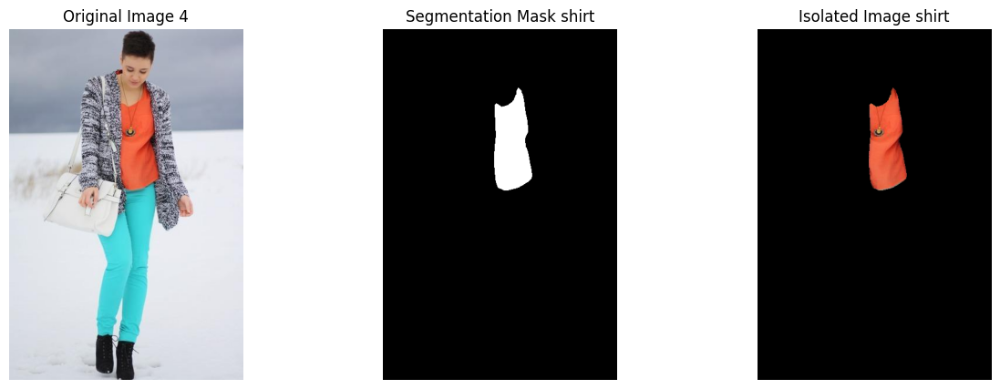

Segmentation complete.


In [4]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import torch
from ultralytics import YOLO
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from torchvision.ops import nms

torch.cuda.empty_cache()

def apply_nms(detected_items, iou_threshold=0.5):
    """
    Apply Non-Maximum Suppression (NMS) to filter overlapping boxes.
    """
    boxes = [item['coordinates'] for item in detected_items]
    scores = [item['confidence'] for item in detected_items]
    labels = [item['label'] for item in detected_items]
    
    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
    scores_tensor = torch.tensor(scores, dtype=torch.float32)

    # Apply NMS
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)
    
    # Filter boxes, scores, and labels based on NMS output
    nms_boxes = boxes_tensor[nms_indices].tolist()
    nms_scores = scores_tensor[nms_indices].tolist()
    nms_labels = [labels[i] for i in nms_indices]

    # Reformat the filtered results into the detected_items structure
    nms_items = []
    for i in range(len(nms_boxes)):
        nms_items.append({
            'label': nms_labels[i],
            'coordinates': nms_boxes[i],
            'confidence': nms_scores[i]
        })
    return nms_items

def conflict_resolution(items):
    """
    Apply conflict resolution based on predefined conflicting object pairs.
    """
    final_items = []
    items_dict = {}
    for i, item in enumerate(items):
        items_dict[item['label']] = {'confidence': item['confidence'], 'idx': i}

    conflicts = {
        'shirt': ['dress'],
        'pants': ['shorts', 'skirt'],
        'shorts': ['pants', 'skirt'],
        'skirt': ['pants', 'shorts'],
        'dress': ['shirt']
    }

    conflict_pairs = []
    for k in items_dict.keys():
        if k not in conflicts:
            final_items.append(items[items_dict[k]['idx']])
        else:
            flag = True
            for conflict in conflicts[k]:
                if conflict in items_dict.keys():
                    if set([k, conflict]) not in conflict_pairs:
                        conflict_pairs.append(set([k, conflict]))
                    flag = False
            if flag:
                final_items.append(items[items_dict[k]['idx']])

    for i, pair in enumerate(conflict_pairs):
        conflict_pairs[i] = list(pair)
    
    winners = []
    for pair in conflict_pairs:
        if pair[0] in winners:
            final_items.append(items[items_dict[pair[0]]['idx']])
        elif pair[1] in winners:
            final_items.append(items[items_dict[pair[1]]['idx']])
        elif items_dict[pair[0]]['confidence'] > items_dict[pair[1]]['confidence']:
            final_items.append(items[items_dict[pair[0]]['idx']])
            winners.append(pair[0])
        else:
            final_items.append(items[items_dict[pair[1]]['idx']])
            winners.append(pair[1])
    
    return final_items

def detect_and_segment_objects(base_path, sample_image_path, yolo_weights_path, sam2_weights_path, sam2_config_path):
    """
    Detect objects using YOLO, resolve conflicts, and apply SAM2 for segmentation.
    """
    segmented_images_dir = os.path.join(base_path, "segmented_images")
    os.makedirs(segmented_images_dir, exist_ok=True)

    # Load the SAMv2 model
    mask_predictor = SAM2ImagePredictor(build_sam2(sam2_config_path, sam2_weights_path))

    # Load the YOLO model
    model = YOLO(yolo_weights_path)

    # Load sample image
    image = Image.open(sample_image_path).convert('RGB')
    image_rgb = np.array(image)
    image_bgr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)

    # Perform object detection with YOLO
    results = model(sample_image_path)

    # Collect detected items
    detected_items = []
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
            confidence = box.conf[0].item()  # Get confidence score
            class_id = int(box.cls[0])  # Get class id
            label = model.names[class_id]  # Get label for class id

            detected_items.append({
                'label': label,
                'coordinates': (x1, y1, x2, y2),
                'confidence': confidence
            })

    # Apply NMS to filter out overlapping boxes
    resolved_items = apply_nms(detected_items)

    # Apply conflict resolution
    resolved_items = conflict_resolution(resolved_items)

    # Prepare boxes for SAMv2 segmentation
    predicted_boxes = np.array([item['coordinates'] for item in resolved_items])
    
    # Set the image for SAMv2 to generate segmentation masks
    mask_predictor.set_image(image_bgr)

    # Generate segmentation masks with SAMv2
    masks, _, _ = mask_predictor.predict(
        point_coords=None,
        point_labels=None,
        box=predicted_boxes[None, :],
        multimask_output=False,
    )

    labels = [item['label'] for item in resolved_items]

    # Save and visualize each mask separately using the label name
    for i, mask in enumerate(masks):
        mask = mask[0].astype(np.uint8)  # Ensure mask is already numpy.uint8 type

        # Save the mask with the class label in the filename
        mask_image = Image.fromarray(mask * 255)  # Convert mask to binary image
        mask_filename = os.path.join(segmented_images_dir, f"{labels[i]}_mask_{i}.png")
        mask_image.save(mask_filename)

        # Multiply the mask by the original image to isolate the object
        isolated_image = image_rgb * mask[:, :, np.newaxis]

        # Save the isolated image with the class label in the filename
        isolated_filename = os.path.join(segmented_images_dir, f"{labels[i]}_isolated_{i}.png")
        isolated_image_pil = Image.fromarray(isolated_image)
        isolated_image_pil.save(isolated_filename)

        # Visualize the mask and the isolated image
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(image_rgb)
        plt.title(f"Original Image {i}")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(mask, cmap='gray')
        plt.title(f"Segmentation Mask {labels[i]}")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(isolated_image)
        plt.title(f"Isolated Image {labels[i]}")
        plt.axis('off')

        plt.show()

    print("Segmentation complete.")

# Example usage:
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
jpeg_images_path = "JPEGImages"
train_image_path = os.path.join(jpeg_images_path, "train")

# Load the trained YOLO model
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train', 'weights')
yolo_best_weights_path = os.path.join(weights_save_path, "best.pt")

# Paths for SAMv2
sam2_weights_path = os.path.join(base_path, "segment-anything-2/checkpoints/sam2_hiera_large.pt")
sam2_config_path = "sam2_hiera_l.yaml"

# Select a sample image
sample_image_path = os.path.join(train_image_path, "191571.jpg")  # Replace with your image

# Perform detection and segmentation
detect_and_segment_objects(base_path, sample_image_path, yolo_best_weights_path, sam2_weights_path, sam2_config_path)

in this implementation we employed samv2 segmentation model for getting segmnetation masks  from each clothing item, then each segmentation mask multiplied  by original image and gives us back the isolated RGB Image.

#### 6.1. getting RGBA Isolated image from each RGB Isolated clothing item


image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train/191571.jpg: 640x448 1 jacket, 1 shirt, 1 pants, 1 bag, 1 shoe, 17.6ms
Speed: 1.5ms preprocess, 17.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)


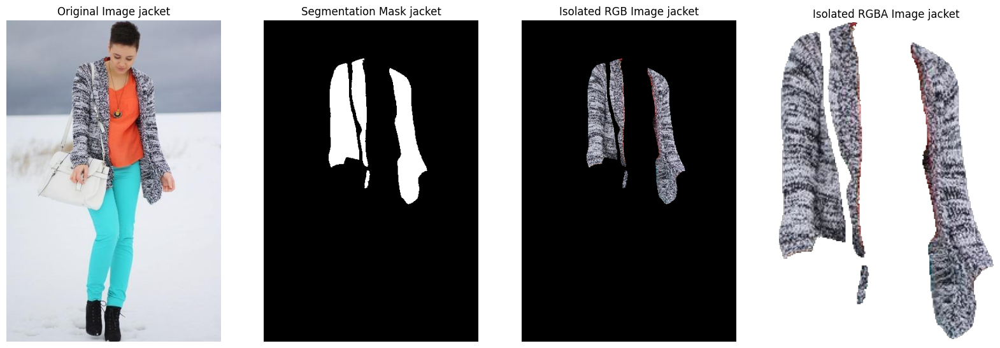

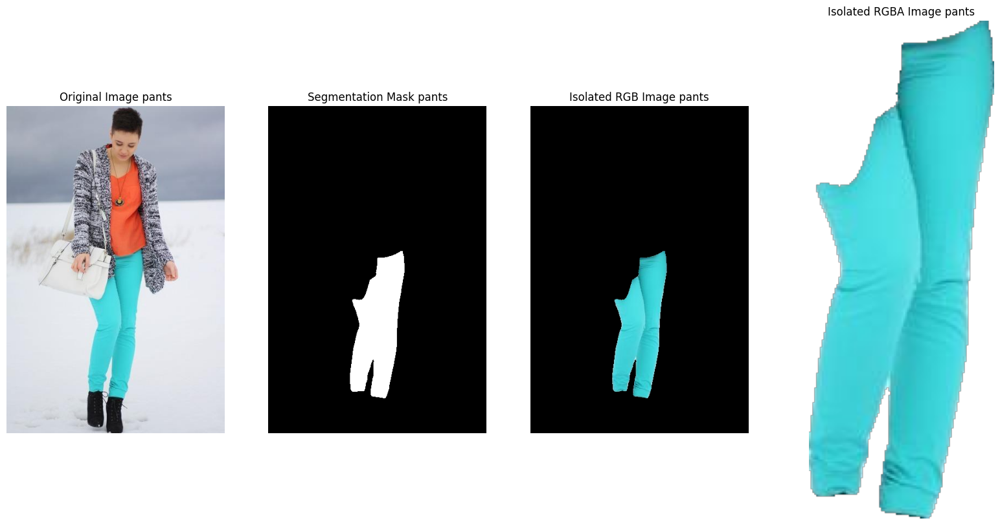

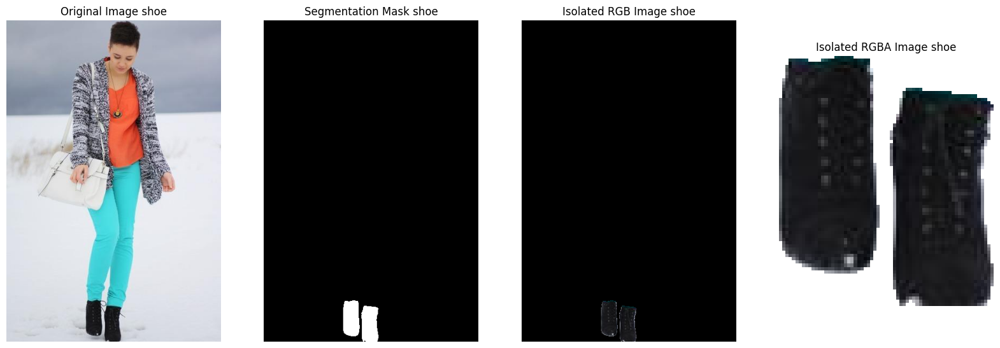

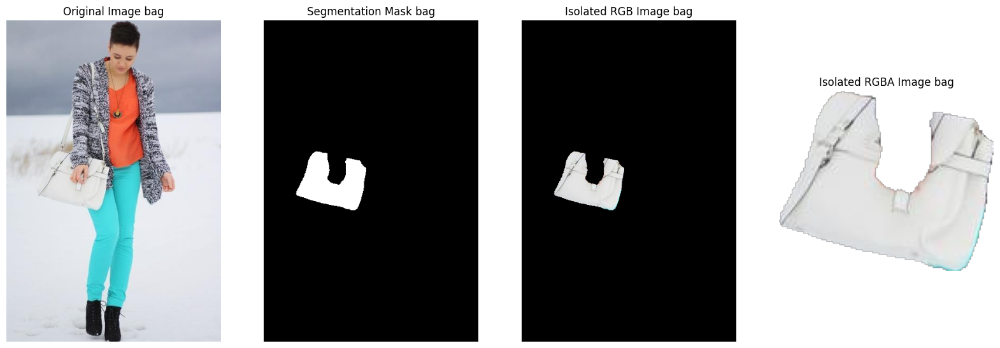

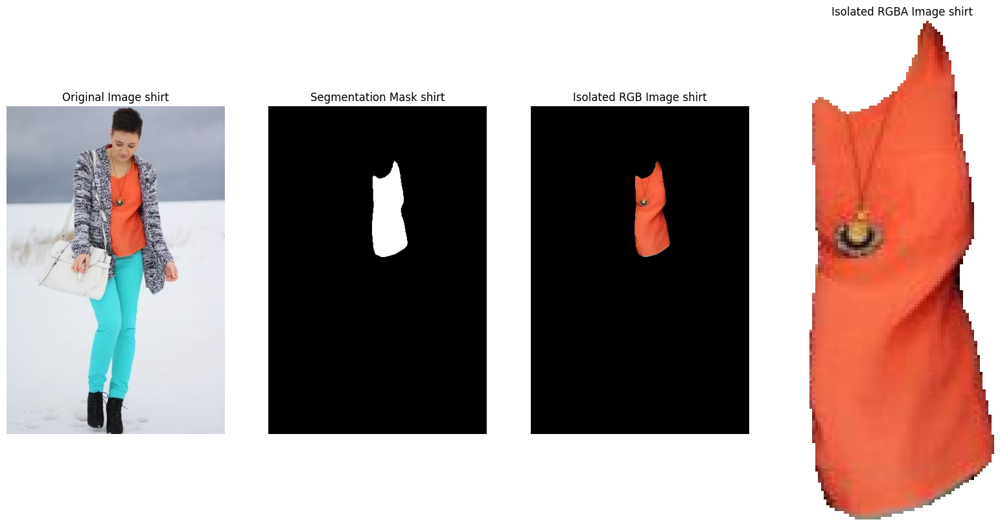

Segmentation complete.


In [5]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import torch
from ultralytics import YOLO
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from torchvision.ops import nms

torch.cuda.empty_cache()

def apply_nms(detected_items, iou_threshold=0.5):
    """
    Apply Non-Maximum Suppression (NMS) to filter overlapping boxes.
    """
    boxes = [item['coordinates'] for item in detected_items]
    scores = [item['confidence'] for item in detected_items]
    labels = [item['label'] for item in detected_items]
    
    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
    scores_tensor = torch.tensor(scores, dtype=torch.float32)

    # Apply NMS
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)
    
    # Filter boxes, scores, and labels based on NMS output
    nms_boxes = boxes_tensor[nms_indices].tolist()
    nms_scores = scores_tensor[nms_indices].tolist()
    nms_labels = [labels[i] for i in nms_indices]

    # Reformat the filtered results into the detected_items structure
    nms_items = []
    for i in range(len(nms_boxes)):
        nms_items.append({
            'label': nms_labels[i],
            'coordinates': nms_boxes[i],
            'confidence': nms_scores[i]
        })
    return nms_items

# function conflict resolution
def conflict_resolution(items):
    """
    Resolve conflicts between similar classes like 'shirt' vs 'dress', etc.
    """
    final_items = []
    items_dict = {}
    for i, item in enumerate(items):
        items_dict[item['label']] = {'confidence': item['confidence'], 'idx': i}

    conflicts = {
        'shirt': ['dress'],
        'pants': ['shorts', 'skirt'],
        'shorts': ['pants', 'skirt'],
        'skirt': ['pants', 'shorts'],
        'dress': ['shirt']
    }

    conflict_pairs = []
    for k in items_dict.keys():
        if k not in conflicts:
            final_items.append(items[items_dict[k]['idx']])
        else:
            flag = True
            for conflict in conflicts[k]:
                if conflict in items_dict.keys():
                    if set([k, conflict]) not in conflict_pairs:
                        conflict_pairs.append(set([k, conflict]))
                    flag = False
            if flag:
                final_items.append(items[items_dict[k]['idx']])

    for i, pair in enumerate(conflict_pairs):
        conflict_pairs[i] = list(pair)
    winners = []

    for pair in conflict_pairs:
        if pair[0] in winners:
            final_items.append(items[items_dict[pair[0]]['idx']])
        elif pair[1] in winners:
            final_items.append(items[items_dict[pair[1]]['idx']])
        elif items_dict[pair[0]]['confidence'] > items_dict[pair[1]]['confidence']:
            final_items.append(items[items_dict[pair[0]]['idx']])
            winners.append(pair[0])
        else:
            final_items.append(items[items_dict[pair[1]]['idx']])
            winners.append(pair[1])

    return final_items

def detect_and_segment_objects(base_path, sample_image_path, yolo_weights_path, sam2_weights_path, sam2_config_path):
    """
    Detect objects using YOLO, resolve conflicts, and apply SAM2 for segmentation.
    """
    segmented_images_dir = os.path.join(base_path, "segmented_images")
    segmented_cropped_images_dir = os.path.join(base_path, "segmented_cropped")
    os.makedirs(segmented_images_dir, exist_ok=True)
    os.makedirs(segmented_cropped_images_dir, exist_ok=True)

    # Load the SAMv2 model
    mask_predictor = SAM2ImagePredictor(build_sam2(sam2_config_path, sam2_weights_path))

    # Load the YOLO model
    model = YOLO(yolo_weights_path)

    # Load sample image
    image = Image.open(sample_image_path).convert('RGB')
    image_rgb = np.array(image)
    image_bgr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)

    # Perform object detection with YOLO
    results = model(sample_image_path)

    # Collect detected items
    detected_items = []
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
            confidence = box.conf[0].item()  # Get confidence score
            class_id = int(box.cls[0])  # Get class id
            label = model.names[class_id]  # Get label for class id

            detected_items.append({
                'label': label,
                'coordinates': (x1, y1, x2, y2),
                'confidence': confidence
            })

    # Apply NMS to filter out overlapping boxes
    resolved_items = apply_nms(detected_items)

    # Resolve conflicts
    resolved_items = conflict_resolution(resolved_items)

    # Prepare boxes for SAMv2 segmentation
    predicted_boxes = np.array([item['coordinates'] for item in resolved_items])
    
    # Set the image for SAMv2 to generate segmentation masks
    mask_predictor.set_image(image_bgr)

    # Generate segmentation masks with SAMv2
    masks, _, _ = mask_predictor.predict(
        point_coords=None,
        point_labels=None,
        box=predicted_boxes[None, :],
        multimask_output=False,
    )

    labels = [item['label'] for item in resolved_items]

    # Save and visualize each mask separately (both isolated RGB and RGBA images)
    for i, mask in enumerate(masks):
        mask = mask[0].astype(np.uint8)  # Ensure mask is uint8 type

        # Multiply the mask by the original image to isolate the object (RGB format)
        isolated_rgb_image = image_rgb * mask[:, :, np.newaxis]

        # Save the RGB isolated image
        isolated_rgb_filename = os.path.join(segmented_images_dir, f"{labels[i]}_isolated_rgb_{i}.png")
        isolated_rgb_image_pil = Image.fromarray(isolated_rgb_image)
        isolated_rgb_image_pil.save(isolated_rgb_filename)

        # Find the bounding box of the non-background pixels in the isolated image
        coords = np.column_stack(np.where(mask > 0))
        if coords.size == 0:
            print(f"No object found for mask {i}")
            continue
        y1, x1 = coords.min(axis=0)
        y2, x2 = coords.max(axis=0)

        # Crop the isolated image using the bounding box
        isolated_cropped_image = isolated_rgb_image[y1:y2+1, x1:x2+1]

        # Create an RGBA image with a transparent background
        isolated_cropped_image_rgba = np.zeros((y2 - y1 + 1, x2 - x1 + 1, 4), dtype=np.uint8)
        isolated_cropped_image_rgba[..., :3] = isolated_cropped_image
        isolated_cropped_image_rgba[..., 3] = mask[y1:y2+1, x1:x2+1] * 255  # Set the alpha channel based on the mask

        # Save the RGBA isolated image
        isolated_cropped_filename = os.path.join(segmented_cropped_images_dir, f"{labels[i]}_isolated_rgba_{i}.png")
        isolated_cropped_image_rgba_pil = Image.fromarray(isolated_cropped_image_rgba, 'RGBA')
        isolated_cropped_image_rgba_pil.save(isolated_cropped_filename)

        # Visualize the original image, mask, isolated RGB, and isolated RGBA images in 4 columns
        plt.figure(figsize=(20, 10))

        # Plot original image
        plt.subplot(1, 4, 1)
        plt.imshow(image_rgb)
        plt.title(f"Original Image {labels[i]}")
        plt.axis('off')

        # Plot segmented mask
        plt.subplot(1, 4, 2)
        plt.imshow(mask, cmap='gray')
        plt.title(f"Segmentation Mask {labels[i]}")
        plt.axis('off')

        # Plot isolated RGB image
        plt.subplot(1, 4, 3)
        plt.imshow(isolated_rgb_image_pil)
        plt.title(f"Isolated RGB Image {labels[i]}")
        plt.axis('off')

        # Plot isolated RGBA image
        plt.subplot(1, 4, 4)
        plt.imshow(isolated_cropped_image_rgba_pil)
        plt.title(f"Isolated RGBA Image {labels[i]}")
        plt.axis('off')

        plt.show()

    print("Segmentation complete.")

# Example usage:
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
jpeg_images_path = "JPEGImages"
train_image_path = os.path.join(jpeg_images_path, "train")

# Load the trained YOLO model
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train', 'weights')
yolo_best_weights_path = os.path.join(weights_save_path, "best.pt")

# Paths for SAMv2
sam2_weights_path = os.path.join(base_path, "segment-anything-2/checkpoints/sam2_hiera_large.pt")
sam2_config_path = "sam2_hiera_l.yaml"

# Select a sample image
sample_image_path = os.path.join(train_image_path, "191571.jpg")  # Replace with your image

# Perform detection and segmentation
detect_and_segment_objects(base_path, sample_image_path, yolo_best_weights_path, sam2_weights_path, sam2_config_path)

-When performing image segmentation and preparing the image for KMeans clustering, it is crucial to isolate the region of interest (the object) from the background.

- After applying the segmentation mask to isolate the object from the background, the mask will have non-zero values where the object is present and zero values where the background is.

- By identifying the bounding box of these non-zero values, we can crop the image to focus only on the region containing the object, discarding the background.

- convert to RGBA and remove the background:

- ensure that the image is in RGBA format where the alpha channel represents transparency. Pixels with alpha value 0 are considered background.
- Filter out background pixels before applying KMeans clustering to avoid the background being considered as a separate cluster.



### 7. Apply Kmeans clustering 

we fed RGBA isolated Image to Kmeans  in order to get the dominant color  from clothing items and give a short description of clothing type and their colors as 

" A red Pants" , "A green bag", ...


image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train/191571.jpg: 640x448 1 jacket, 1 shirt, 1 pants, 1 bag, 1 shoe, 16.1ms
Speed: 1.7ms preprocess, 16.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)


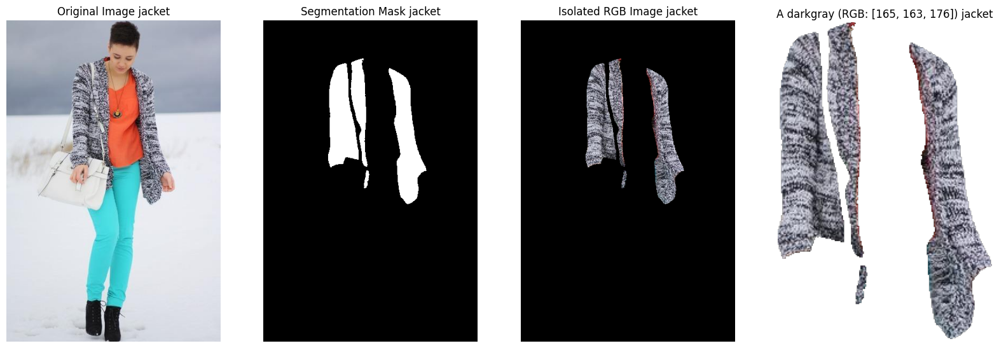

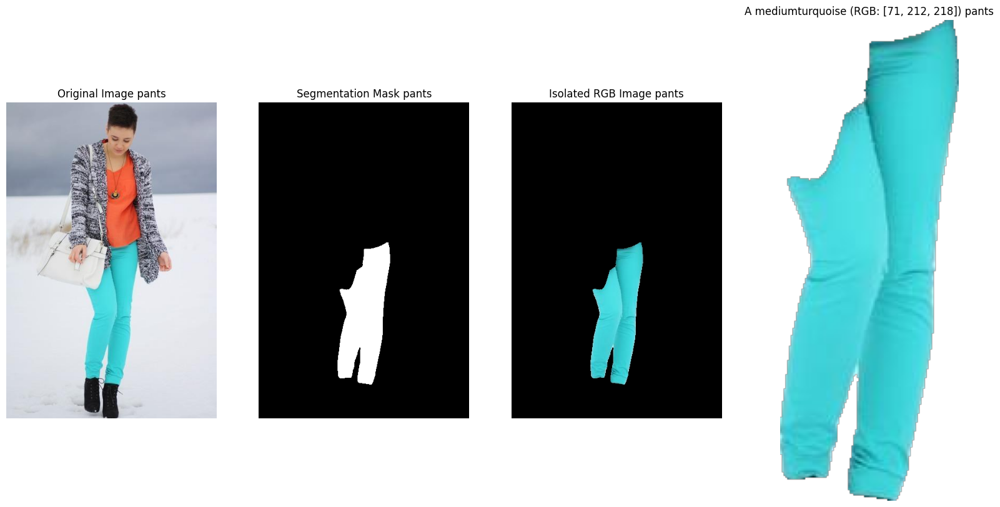

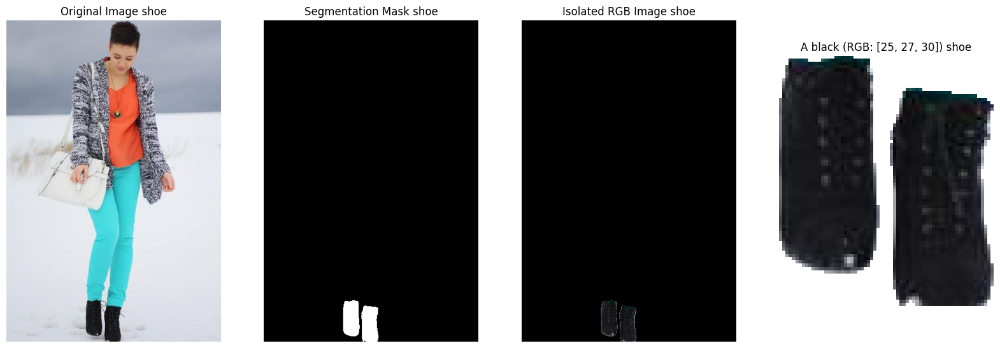

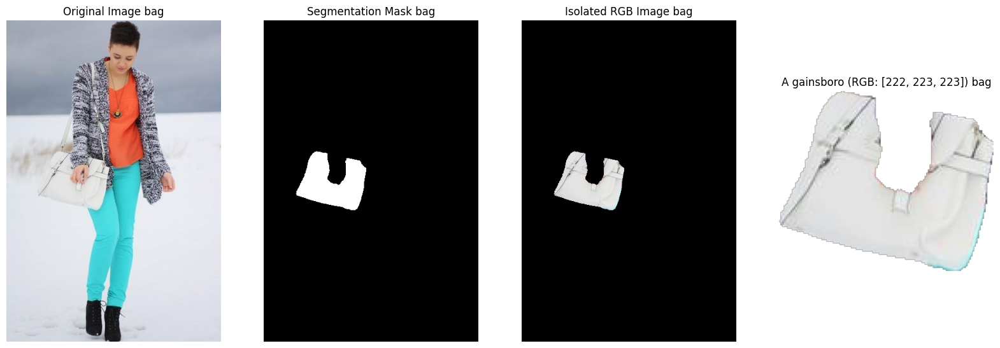

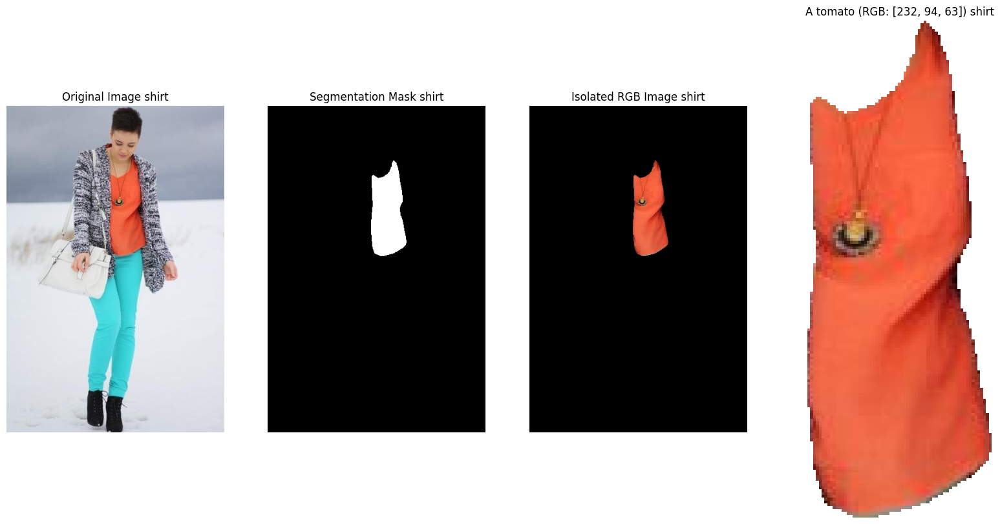

Segmentation complete.


In [6]:


import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from ultralytics import YOLO
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from torchvision.ops import nms
import random
from sklearn.cluster import KMeans




# Define the CSS3 colors and their RGB values
css3_colors = {
    'aliceblue': (240, 248, 255), 'antiquewhite': (250, 235, 215), 'aqua': (0, 255, 255),
    'aquamarine': (127, 255, 212), 'azure': (240, 255, 255), 'beige': (245, 245, 220),
    'bisque': (255, 228, 196), 'black': (0, 0, 0), 'blanchedalmond': (255, 235, 205),
    'blue': (0, 0, 255), 'blueviolet': (138, 43, 226), 'brown': (165, 42, 42),
    'burlywood': (222, 184, 135), 'cadetblue': (95, 158, 160), 'chartreuse': (127, 255, 0),
    'chocolate': (210, 105, 30), 'coral': (255, 127, 80), 'cornflowerblue': (100, 149, 237),
    'cornsilk': (255, 248, 220), 'crimson': (220, 20, 60), 'cyan': (0, 255, 255),
    'darkblue': (0, 0, 139), 'darkcyan': (0, 139, 139), 'darkgoldenrod': (184, 134, 11),
    'darkgray': (169, 169, 169), 'darkgreen': (0, 100, 0), 'darkkhaki': (189, 183, 107),
    'darkmagenta': (139, 0, 139), 'darkolivegreen': (85, 107, 47), 'darkorange': (255, 140, 0),
    'darkorchid': (153, 50, 204), 'darkred': (139, 0, 0), 'darksalmon': (233, 150, 122),
    'darkseagreen': (143, 188, 143), 'darkslateblue': (72, 61, 139), 'darkslategray': (47, 79, 79),
    'darkturquoise': (0, 206, 209), 'darkviolet': (148, 0, 211), 'deeppink': (255, 20, 147),
    'deepskyblue': (0, 191, 255), 'dimgray': (105, 105, 105), 'dodgerblue': (30, 144, 255),
    'firebrick': (178, 34, 34), 'floralwhite': (255, 250, 240), 'forestgreen': (34, 139, 34),
    'fuchsia': (255, 0, 255), 'gainsboro': (220, 220, 220), 'ghostwhite': (248, 248, 255),
    'gold': (255, 215, 0), 'goldenrod': (218, 165, 32), 'gray': (128, 128, 128),
    'green': (0, 128, 0), 'greenyellow': (173, 255, 47), 'honeydew': (240, 255, 240),
    'hotpink': (255, 105, 180), 'indianred': (205, 92, 92), 'indigo': (75, 0, 130),
    'ivory': (255, 255, 240), 'khaki': (240, 230, 140), 'lavender': (230, 230, 250),
    'lavenderblush': (255, 240, 245), 'lawngreen': (124, 252, 0), 'lemonchiffon': (255, 250, 205),
    'lightblue': (173, 216, 230), 'lightcoral': (240, 128, 128), 'lightcyan': (224, 255, 255),
    'lightgoldenrodyellow': (250, 250, 210), 'lightgreen': (144, 238, 144), 'lightgrey': (211, 211, 211),
    'lightpink': (255, 182, 193), 'lightsalmon': (255, 160, 122), 'lightseagreen': (32, 178, 170),
    'lightskyblue': (135, 206, 250), 'lightslategray': (119, 136, 153), 'lightsteelblue': (176, 196, 222),
    'lightyellow': (255, 255, 224), 'lime': (0, 255, 0), 'limegreen': (50, 205, 50),
    'linen': (250, 240, 230), 'magenta': (255, 0, 255), 'maroon': (128, 0, 0),
    'mediumaquamarine': (102, 205, 170), 'mediumblue': (0, 0, 205), 'mediumorchid': (186, 85, 211),
    'mediumpurple': (147, 112, 219), 'mediumseagreen': (60, 179, 113), 'mediumslateblue': (123, 104, 238),
    'mediumspringgreen': (0, 250, 154), 'mediumturquoise': (72, 209, 204), 'mediumvioletred': (199, 21, 133),
    'midnightblue': (25, 25, 112), 'mintcream': (245, 255, 250), 'mistyrose': (255, 228, 225),
    'moccasin': (255, 228, 181), 'navajowhite': (255, 222, 173), 'navy': (0, 0, 128),
    'oldlace': (253, 245, 230), 'olive': (128, 128, 0), 'olivedrab': (107, 142, 35),
    'orange': (255, 165, 0), 'orangered': (255, 69, 0), 'orchid': (218, 112, 214),
    'palegoldenrod': (238, 232, 170), 'palegreen': (152, 251, 152), 'paleturquoise': (175, 238, 238),
    'palevioletred': (219, 112, 147), 'papayawhip': (255, 239, 213), 'peachpuff': (255, 218, 185),
    'peru': (205, 133, 63), 'pink': (255, 192, 203), 'plum': (221, 160, 221),
    'powderblue': (176, 224, 230), 'purple': (128, 0, 128), 'rebeccapurple': (102, 51, 153),
    'red': (255, 0, 0), 'rosybrown': (188, 143, 143), 'royalblue': (65, 105, 225),
    'saddlebrown': (139, 69, 19), 'salmon': (250, 128, 114), 'sandybrown': (244, 164, 96),
    'seagreen': (46, 139, 87), 'seashell': (255, 245, 238), 'sienna': (160, 82, 45),
    'silver': (192, 192, 192), 'skyblue': (135, 206, 235), 'slateblue': (106, 90, 205),
    'slategray': (112, 128, 144), 'snow': (255, 250, 250), 'springgreen': (0, 255, 127),
    'steelblue': (70, 130, 180), 'tan': (210, 180, 140), 'teal': (0, 128, 128),
    'thistle': (216, 191, 216), 'tomato': (255, 99, 71), 'turquoise': (64, 224, 208),
    'violet': (238, 130, 238), 'wheat': (245, 222, 179), 'white': (255, 255, 255),
    'whitesmoke': (245, 245, 245), 'yellow': (255, 255, 0), 'yellowgreen': (154, 205, 50)
}




#def closest_color(requested_color):
def closest_color(requested_color):
    min_diff = float('inf')
    closest_color_name = None
    for color_name, rgb in css3_colors.items():
        diff = np.sqrt(np.sum((np.array(rgb) - np.array(requested_color)) ** 2))
        if diff < min_diff:
            min_diff = diff
            closest_color_name = color_name
    return closest_color_name, css3_colors[closest_color_name]

# Apply Non-Maximum Suppression (NMS)
def apply_nms(detected_items, iou_threshold=0.5):
    boxes = [item['coordinates'] for item in detected_items]
    scores = [item['confidence'] for item in detected_items]
    labels = [item['label'] for item in detected_items]

    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
    scores_tensor = torch.tensor(scores, dtype=torch.float32)

    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)

    nms_boxes = boxes_tensor[nms_indices].tolist()
    nms_scores = scores_tensor[nms_indices].tolist()
    nms_labels = [labels[i] for i in nms_indices]

    nms_items = []
    for i in range(len(nms_boxes)):
        nms_items.append({
            'label': nms_labels[i],
            'coordinates': nms_boxes[i],
            'confidence': nms_scores[i]
        })
    return nms_items

# Conflict resolution
def conflict_resolution(items):
    final_items = []
    items_dict = {}
    for i, item in enumerate(items):
        items_dict[item['label']] = {'confidence': item['confidence'], 'idx': i}

    conflicts = {
        'shirt': ['dress'],
        'pants': ['shorts', 'skirt'],
        'shorts': ['pants', 'skirt'],
        'skirt': ['pants', 'shorts'],
        'dress': ['shirt']
    }

    conflict_pairs = []
    for k in items_dict.keys():
        if k not in conflicts:
            final_items.append(items[items_dict[k]['idx']])
        else:
            flag = True
            for conflict in conflicts[k]:
                if conflict in items_dict.keys():
                    if set([k, conflict]) not in conflict_pairs:
                        conflict_pairs.append(set([k, conflict]))
                    flag = False
            if flag:
                final_items.append(items[items_dict[k]['idx']])

    for i, pair in enumerate(conflict_pairs):
        conflict_pairs[i] = list(pair)
    winners = []

    for pair in conflict_pairs:
        if pair[0] in winners:
            final_items.append(items[items_dict[pair[0]]['idx']])
        elif pair[1] in winners:
            final_items.append(items[items_dict[pair[1]]['idx']])
        elif items_dict[pair[0]]['confidence'] > items_dict[pair[1]]['confidence']:
            final_items.append(items[items_dict[pair[0]]['idx']])
            winners.append(pair[0])
        else:
            final_items.append(items[items_dict[pair[1]]['idx']])
            winners.append(pair[1])

    return final_items

# Process segmented patch and return the dominant color
def process_segmented_patch(image_rgba):
    pixels = image_rgba.reshape(-1, 4)
    pixels = pixels[pixels[:, 3] > 0]  # Consider only non-background pixels
    kmeans = KMeans(n_clusters=2)
    kmeans.fit(pixels[:, :3])
    cluster_centers = kmeans.cluster_centers_.astype(int)
    dominant_color = cluster_centers[np.argmax(np.bincount(kmeans.labels_))]
    dominant_color_name, _ = closest_color(dominant_color)
    return dominant_color_name, dominant_color

# Detect and segment objects, then display them with description
def detect_and_segment_objects_with_description(base_path, sample_image_path, yolo_weights_path, sam2_weights_path, sam2_config_path):
    segmented_images_dir = os.path.join(base_path, "segmented_images")
    segmented_cropped_images_dir = os.path.join(base_path, "segmented_cropped")
    os.makedirs(segmented_images_dir, exist_ok=True)
    os.makedirs(segmented_cropped_images_dir, exist_ok=True)

    mask_predictor = SAM2ImagePredictor(build_sam2(sam2_config_path, sam2_weights_path))
    model = YOLO(yolo_weights_path)

    image = Image.open(sample_image_path).convert('RGB')
    image_rgb = np.array(image)
    image_bgr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)

    results = model(sample_image_path)

    detected_items = []
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            confidence = box.conf[0].item()
            class_id = int(box.cls[0])
            label = model.names[class_id]

            detected_items.append({
                'label': label,
                'coordinates': (x1, y1, x2, y2),
                'confidence': confidence
            })

    resolved_items = apply_nms(detected_items)
    resolved_items = conflict_resolution(resolved_items)

    predicted_boxes = np.array([item['coordinates'] for item in resolved_items])
    mask_predictor.set_image(image_bgr)

    masks, _, _ = mask_predictor.predict(
        point_coords=None,
        point_labels=None,
        box=predicted_boxes[None, :],
        multimask_output=False,
    )

    labels = [item['label'] for item in resolved_items]

    for i, mask in enumerate(masks):
        mask = mask[0].astype(np.uint8)

        isolated_rgb_image = image_rgb * mask[:, :, np.newaxis]
        isolated_rgb_filename = os.path.join(segmented_images_dir, f"{labels[i]}_isolated_rgb_{i}.png")
        isolated_rgb_image_pil = Image.fromarray(isolated_rgb_image)
        isolated_rgb_image_pil.save(isolated_rgb_filename)

        coords = np.column_stack(np.where(mask > 0))
        if coords.size == 0:
            continue
        y1, x1 = coords.min(axis=0)
        y2, x2 = coords.max(axis=0)

        isolated_cropped_image = isolated_rgb_image[y1:y2+1, x1:x2+1]
        isolated_cropped_image_rgba = np.zeros((y2 - y1 + 1, x2 - x1 + 1, 4), dtype=np.uint8)
        isolated_cropped_image_rgba[..., :3] = isolated_cropped_image
        isolated_cropped_image_rgba[..., 3] = mask[y1:y2+1, x1:x2+1] * 255

        isolated_cropped_filename = os.path.join(segmented_cropped_images_dir, f"{labels[i]}_isolated_rgba_{i}.png")
        isolated_cropped_image_rgba_pil = Image.fromarray(isolated_cropped_image_rgba, 'RGBA')
        isolated_cropped_image_rgba_pil.save(isolated_cropped_filename)

        dominant_color_name, dominant_color = process_segmented_patch(isolated_cropped_image_rgba)

        # Visualize images and descriptions
        plt.figure(figsize=(20, 10))

        plt.subplot(1, 4, 1)
        plt.imshow(image_rgb)
        plt.title(f"Original Image {labels[i]}")
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.imshow(mask, cmap='gray')
        plt.title(f"Segmentation Mask {labels[i]}")
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.imshow(isolated_rgb_image_pil)
        plt.title(f"Isolated RGB Image {labels[i]}")
        plt.axis('off')

        plt.subplot(1, 4, 4)
        plt.imshow(isolated_cropped_image_rgba_pil)
        plt.title(f"A {dominant_color_name} (RGB: {dominant_color.tolist()}) {labels[i]}")
        plt.axis('off')

        plt.show()

    print("Segmentation complete.")

base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
jpeg_images_path = "JPEGImages"
train_image_path = os.path.join(jpeg_images_path, "train")

runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train', 'weights')
yolo_best_weights_path = os.path.join(weights_save_path, "best.pt")

# Paths for SAMv2
sam2_weights_path = os.path.join(base_path, "segment-anything-2/checkpoints/sam2_hiera_large.pt")
sam2_config_path = "sam2_hiera_l.yaml"

# Select a sample image
sample_image_path = os.path.join(train_image_path, "191571.jpg")  # Replace with your image

# Perform detection and segmentation
detect_and_segment_objects_with_description(base_path, sample_image_path, yolo_best_weights_path, sam2_weights_path, sam2_config_path)

### 7.1.  Calculate the Optimal Number of Clusters with Elbow Method


image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/colorful_fashion_dataset/JPEGImages/train/12877.jpg: 640x448 1 jacket, 1 dress, 1 bag, 1 shoe, 16.1ms
Speed: 1.5ms preprocess, 16.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/colorful_fashion_dataset/JPEGImages/val/104565.jpg: 640x448 1 shirt, 1 pants, 1 shoe, 20.7ms
Speed: 1.5ms preprocess, 20.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/colorful_fashion_dataset/JPEGImages/val/18000.jpg: 640x448 1 jacket, 1 shirt, 1 pants, 1 bag, 1 shoe, 19.6ms
Speed: 1.5ms preprocess, 19.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/colorful_fashion_dataset/JPEGImages/test/18650.jpg: 640x448 1 jacket, 1 shirt, 1 shorts, 1 shoe, 18.0

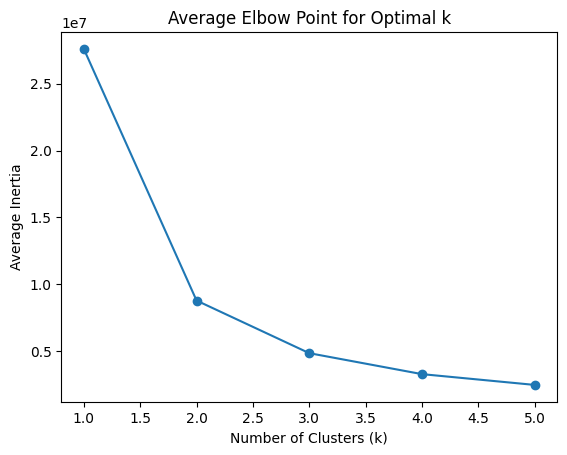

Segmentation and average elbow point calculation complete.


In [8]:
import numpy as np
import cv2
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import os
import random
from ultralytics import YOLO
from segment_anything import sam_model_registry, SamPredictor
from torchvision.ops import nms


def kmeans_clustering(image, n_clusters):
    pixels = image.reshape(-1, 4)
    pixels = pixels[pixels[:, 3] > 0]  # Only consider non-transparent pixels
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(pixels[:, :3])
    inertia = kmeans.inertia_
    return inertia

def calculate_average_elbow_point(all_segmented_images):
    max_k = 5
    all_inertias = []

    for image in all_segmented_images:
        inertias = []
        for k in range(1, max_k + 1):
            inertia = kmeans_clustering(image, n_clusters=k)
            inertias.append(inertia)
        all_inertias.append(inertias)

    # Convert to numpy array to easily compute the mean across all images
    all_inertias = np.array(all_inertias)
    print(f" all inertias:{all_inertias}")
    mean_inertias = np.mean(all_inertias, axis=0)

    # Plotting the average elbow point
    plt.figure()
    plt.plot(range(1, max_k + 1), mean_inertias, marker='o')
    plt.title('Average Elbow Point for Optimal k')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Average Inertia')
    plt.show()

class FashionDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image_path, image

# Define Non-Maximum Suppression (NMS) function
def apply_nms(detected_items, iou_threshold=0.5):
    boxes = [item['coordinates'] for item in detected_items]
    scores = [item['confidence'] for item in detected_items]
    labels = [item['label'] for item in detected_items]

    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
    scores_tensor = torch.tensor(scores, dtype=torch.float32)

    # Apply NMS
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)

    # Filter boxes, scores, and labels based on NMS output
    nms_boxes = boxes_tensor[nms_indices].tolist()
    nms_scores = scores_tensor[nms_indices].tolist()
    nms_labels = [labels[i] for i in nms_indices]

    # Reformat the filtered results into the detected_items structure
    nms_items = []
    for i in range(len(nms_boxes)):
        nms_items.append({
            'label': nms_labels[i],
            'coordinates': nms_boxes[i],
            'confidence': nms_scores[i]
        })
    return nms_items

def detect_and_segment_batch(base_path, image_paths, yolo_weights_path, sam_model_path, batch_size=4):
    sam = sam_model_registry["vit_h"](checkpoint=sam_model_path).to(device=torch.device('cuda:0'))
    mask_predictor = SamPredictor(sam)
    model = YOLO(yolo_weights_path)
    transform = transforms.Compose([transforms.ToTensor()])

    # Randomly sample 200 images
    if len(image_paths) > 200:
        sampled_image_paths = random.sample(image_paths, 200)
    else:
        sampled_image_paths = image_paths

    dataset = FashionDataset(sampled_image_paths, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    all_segmented_images = []

    for batch in dataloader:
        image_paths_batch, images_batch = batch
        images_batch = images_batch.to('cuda')

        for i, image in enumerate(images_batch):
            sample_image_path = image_paths_batch[i]
            image_pil = transforms.ToPILImage()(image.cpu())
            image_rgb = np.array(image_pil)
            image_bgr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)

            # Perform object detection with YOLO
            results = model(sample_image_path)

            # Collect detected items
            detected_items = []
            for result in results:
                boxes = result.boxes
                for box in boxes:
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    confidence = box.conf[0].item()
                    class_id = int(box.cls[0])
                    label = model.names[class_id]

                    detected_items.append({
                        'label': label,
                        'coordinates': (x1, y1, x2, y2),
                        'confidence': confidence
                    })

            # Apply Non-Maximum Suppression (NMS)
            resolved_items = apply_nms(detected_items, iou_threshold=0.5)

            predicted_boxes = []
            for item in resolved_items:
                x1, y1, x2, y2 = item['coordinates']
                predicted_boxes.append([x1, y1, x2, y2])

            predicted_boxes_tensor = torch.tensor(predicted_boxes, dtype=torch.float32).to('cuda')
            transformed_boxes = mask_predictor.transform.apply_boxes_torch(predicted_boxes_tensor, image_bgr.shape[:2])

            mask_predictor.set_image(image_bgr)
            masks, _, _ = mask_predictor.predict_torch(
                boxes=transformed_boxes.to('cuda'),
                multimask_output=False,
                point_coords=None,
                point_labels=None
            )

            for j, mask in enumerate(masks):
                mask = mask[0].cpu().numpy().astype(np.uint8)

                isolated_image = image_rgb * mask[:, :, np.newaxis]

                coords = np.column_stack(np.where(mask > 0))
                if coords.size == 0:
                    print(f"No object found for mask {j}")
                    continue
                y1, x1 = coords.min(axis=0)
                y2, x2 = coords.max(axis=0)

                isolated_cropped_image = isolated_image[y1:y2+1, x1:x2+1]
                isolated_cropped_image_rgba = np.zeros((y2 - y1 + 1, x2 - x1 + 1, 4), dtype=np.uint8)
                isolated_cropped_image_rgba[..., :3] = isolated_cropped_image
                isolated_cropped_image_rgba[..., 3] = mask[y1:y2+1, x1:x2+1] * 255

                # Store the segmented cropped image for elbow calculation
                all_segmented_images.append(isolated_cropped_image_rgba)

        torch.cuda.empty_cache()

    # Calculate the average elbow point for all segmented images
    calculate_average_elbow_point(all_segmented_images)

    print("Segmentation and average elbow point calculation complete.")

# Example usage:
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
annotations_path = "Annotations"
annotations_txt_path = "Annotations_txt"
image_sets_path = "ImageSets/Main"
jpeg_images_path = "JPEGImages"

train_image_path = os.path.join(jpeg_images_path, "train")
val_image_path = os.path.join(jpeg_images_path, "val")
test_image_path = os.path.join(jpeg_images_path, "test")

# Load the trained model
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train','weights')
yolo_best_weights_path = os.path.join(weights_save_path, "best.pt")
sam_model_path = os.path.join(base_path, "models","sam_vit_h_4b8939.pth")

train_images = [os.path.join(train_image_path, img) for img in os.listdir(train_image_path) if img.endswith(('.jpg', '.jpeg', '.png'))]
val_images = [os.path.join(val_image_path, img) for img in os.listdir(val_image_path) if img.endswith(('.jpg', '.jpeg', '.png'))]
test_images = [os.path.join(test_image_path, img) for img in os.listdir(test_image_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

all_image_paths = train_images + val_images + test_images

detect_and_segment_batch(base_path, all_image_paths, yolo_best_weights_path, sam_model_path, batch_size=10)

When extracting colors from a clothing item using clustering techniques like K-means, we need to decide how many clusters (k) to create. Each cluster corresponds

 to a different dominant color.The Elbow Method is used in the process of finding dominant colors to determine the optimal number of color clusters (k) in a given

 image. This helps in identifying the most representative colors present in a clothing item.

 the result after applying elboe method:

 The "elbow point" is where the rate of decrease in inertia significantly slows down, indicating the point beyond which adding more clusters does not improve the 
 
 clustering significantly.

In the given graph, the "elbow" is observed at k = 2. This means that choosing 2 clusters is optimal because increasing beyond 2 does not substantially decrease

 the inertia.

### 7.2. Quality of clustering with Silhouette Score

/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/segment-anything-2/sam2/modeling/sam/transformer.py:23: UserWarning: Flash Attention is disabled as it requires a GPU with Ampere (8.0) CUDA capability.
  OLD_GPU, USE_FLASH_ATTN, MATH_KERNEL_ON = get_sdpa_settings()



image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train/133533.jpg: 640x448 1 jacket, 2 shirts, 1 skirt, 1 shoe, 41.8ms
Speed: 3.2ms preprocess, 41.8ms inference, 141.3ms postprocess per image at shape (1, 3, 640, 448)
Image: JPEGImages/train/133533.jpg processed.
Image: JPEGImages/train/133533.jpg processed.
Image: JPEGImages/train/133533.jpg processed.
Image: JPEGImages/train/133533.jpg processed.

image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/test/70633.jpg: 640x448 2 sunglasss, 1 jacket, 1 shirt, 1 pants, 1 shoe, 17.9ms
Speed: 1.6ms preprocess, 17.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 448)
Image: JPEGImages/test/70633.jpg processed.
Image: JPEGImages/test/70633.jpg processed.
Image: JPEGImages/test/70633.jpg processed.
Image: JPEGImages/test/70633.jpg processed.
Image: JPEGImages/test/70633.jpg processed.

image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/

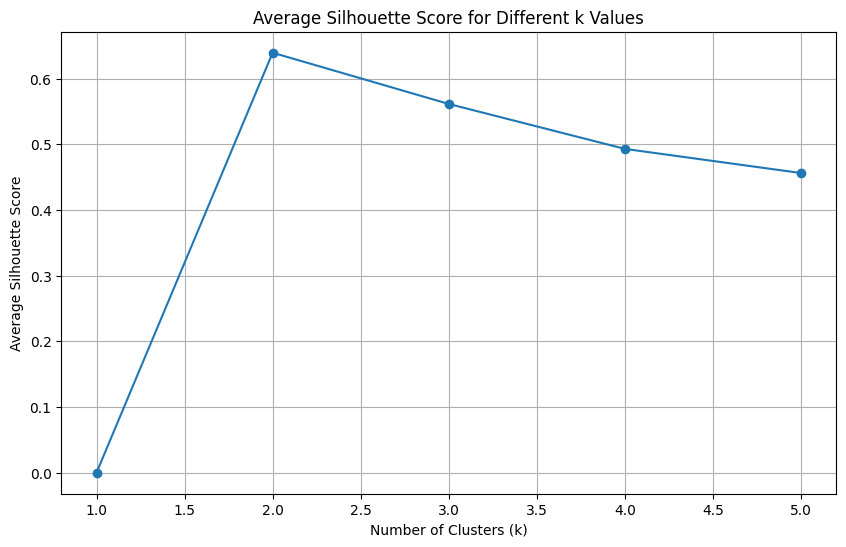

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import torch
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from ultralytics import YOLO
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from torchvision.ops import nms
from torch.utils.data import DataLoader, Dataset
import random
from torchvision import transforms

torch.cuda.empty_cache()

# Function to apply Non-Maximum Suppression (NMS)
def apply_nms(detected_items, iou_threshold=0.5):
    boxes = [item['coordinates'] for item in detected_items]
    scores = [item['confidence'] for item in detected_items]
    labels = [item['label'] for item in detected_items]

    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
    scores_tensor = torch.tensor(scores, dtype=torch.float32)

    # Apply NMS
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)

    # Filter boxes, scores, and labels based on NMS output
    nms_boxes = boxes_tensor[nms_indices].tolist()
    nms_scores = scores_tensor[nms_indices].tolist()
    nms_labels = [labels[i] for i in nms_indices]

    # Reformat the filtered results into the detected_items structure
    nms_items = []
    for i in range(len(nms_boxes)):
        nms_items.append({
            'label': nms_labels[i],
            'coordinates': nms_boxes[i],
            'confidence': nms_scores[i]
        })
    return nms_items

# Function for conflict resolution
def conflict_resolution(items):
    final_items = []
    items_dict = {}
    for i, item in enumerate(items):
        items_dict[item['label']] = {'confidence': item['confidence'], 'idx': i}

    conflicts = {
        'shirt': ['dress'],
        'pants': ['shorts', 'skirt'],
        'shorts': ['pants', 'skirt'],
        'skirt': ['pants', 'shorts'],
        'dress': ['shirt']
    }

    conflict_pairs = []
    for k in items_dict.keys():
        if k not in conflicts:
            final_items.append(items[items_dict[k]['idx']])
        else:
            flag = True
            for conflict in conflicts[k]:
                if conflict in items_dict.keys():
                    if set([k, conflict]) not in conflict_pairs:
                        conflict_pairs.append(set([k, conflict]))
                    flag = False
            if flag:
                final_items.append(items[items_dict[k]['idx']])

    for i, pair in enumerate(conflict_pairs):
        conflict_pairs[i] = list(pair)
    winners = []

    for pair in conflict_pairs:
        if pair[0] in winners:
            final_items.append(items[items_dict[pair[0]]['idx']])
        elif pair[1] in winners:
            final_items.append(items[items_dict[pair[1]]['idx']])
        elif items_dict[pair[0]]['confidence'] > items_dict[pair[1]]['confidence']:
            final_items.append(items[items_dict[pair[0]]['idx']])
            winners.append(pair[0])
        else:
            final_items.append(items[items_dict[pair[1]]['idx']])
            winners.append(pair[1])
    return final_items

# Function for K-means clustering on a single image and calculating silhouette score
def kmeans_clustering(image, n_clusters):
    pixels = image.reshape(-1, 4)
    pixels = pixels[pixels[:, 3] > 0]  # Only consider non-transparent pixels
    if len(pixels) < n_clusters:
        return 0

    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(pixels[:, :3])
    labels = kmeans.labels_

    if len(set(labels)) > 1:  # Silhouette score requires at least 2 clusters
        silhouette_avg = silhouette_score(pixels[:, :3], labels)
    else:
        silhouette_avg = 0  # No silhouette score if there's only one cluster

    return silhouette_avg

# Dataset class for loading and processing images
class FashionDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image_path, image

# Function to detect and segment objects in batches
def detect_and_segment_batch(base_path, image_paths, yolo_weights_path, sam2_weights_path, sam2_config_path, batch_size=4, k_values=[1, 2, 3, 4, 5]):
    # Load the SAMv2 model
    mask_predictor = SAM2ImagePredictor(build_sam2(sam2_config_path, sam2_weights_path))
    # Load the YOLO model
    model = YOLO(yolo_weights_path)
    transform = transforms.Compose([transforms.ToTensor()])

    # Randomly sample 10 images
    if len(image_paths) > 10:
        sampled_image_paths = random.sample(image_paths, 10)
    else:
        sampled_image_paths = image_paths

    dataset = FashionDataset(sampled_image_paths, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    silhouette_scores = {k: 0 for k in k_values}  # Initialize dictionary to hold scores for each k
    total_images = 0  # Counter for the number of processed images

    for batch in dataloader:
        image_paths_batch, images_batch = batch
        images_batch = images_batch.to('cuda')

        for i, image in enumerate(images_batch):
            sample_image_path = image_paths_batch[i]
            image_rgb = np.array(transforms.ToPILImage()(image.cpu()))
            image_bgr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)

            # Perform object detection with YOLO
            results = model(sample_image_path)

            # Collect detected items
            detected_items = []
            for result in results:
                boxes = result.boxes
                for box in boxes:
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    confidence = box.conf[0].item()
                    class_id = int(box.cls[0])
                    label = model.names[class_id]

                    detected_items.append({
                        'label': label,
                        'coordinates': (x1, y1, x2, y2),
                        'confidence': confidence
                    })

            # Apply NMS and conflict resolution
            nms_filtered_items = apply_nms(detected_items, iou_threshold=0.5)
            resolved_items = conflict_resolution(nms_filtered_items)

            predicted_boxes = []
            for item in resolved_items:
                x1, y1, x2, y2 = item['coordinates']
                predicted_boxes.append([x1, y1, x2, y2])

            # Prepare boxes for SAMv2 segmentation
            predicted_boxes = np.array(predicted_boxes)
            
            # Set the image for SAMv2 to generate segmentation masks
            mask_predictor.set_image(image_bgr)

            # Generate segmentation masks with SAMv2
            masks, _, _ = mask_predictor.predict(
                point_coords=None,
                point_labels=None,
                box=predicted_boxes[None, :],
                multimask_output=False,
            )

            for j, mask in enumerate(masks):
                mask = mask[0].astype(np.uint8)

                isolated_image = image_rgb * mask[:, :, np.newaxis]

                coords = np.column_stack(np.where(mask > 0))
                if coords.size == 0:
                    print(f"No object found for mask {j}")
                    continue
                y1, x1 = coords.min(axis=0)
                y2, x2 = coords.max(axis=0)

                isolated_cropped_image = isolated_image[y1:y2+1, x1:x2+1]
                isolated_cropped_image_rgba = np.zeros((y2 - y1 + 1, x2 - x1 + 1, 4), dtype=np.uint8)
                isolated_cropped_image_rgba[..., :3] = isolated_cropped_image
                isolated_cropped_image_rgba[..., 3] = mask[y1:y2+1, x1:x2+1] * 255

                # Calculate silhouette score for the segmented cropped image for each k
                for k in k_values:
                    silhouette_avg = kmeans_clustering(isolated_cropped_image_rgba, n_clusters=k)
                    silhouette_scores[k] += silhouette_avg

                total_images += 1
                print(f"Image: {sample_image_path} processed.")

    # Calculate and print the average silhouette score for each k
    if total_images > 0:
        for k in k_values:
            silhouette_scores[k] /= total_images
            print(f"Average Silhouette Score for k={k}: {silhouette_scores[k]:.4f}")
    else:
        print("No images were processed.")

    torch.cuda.empty_cache()

    print("Segmentation and silhouette score calculation complete.")
    return silhouette_scores

# Example usage:
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
annotations_path = "Annotations"
annotations_txt_path = "Annotations_txt"
image_sets_path = "ImageSets/Main"
jpeg_images_path = "JPEGImages"

train_image_path = os.path.join(jpeg_images_path, "train")
val_image_path = os.path.join(jpeg_images_path, "val")
test_image_path = os.path.join(jpeg_images_path, "test")

# Load the trained model
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train','weights')
yolo_best_weights_path = os.path.join(weights_save_path, "best.pt")

# Paths for SAMv2
sam2_weights_path = os.path.join(base_path, "segment-anything-2/checkpoints/sam2_hiera_large.pt")
sam2_config_path = "sam2_hiera_l.yaml"

# Gather all image paths
train_images = [os.path.join(train_image_path, img) for img in os.listdir(train_image_path) if img.endswith(('.jpg', '.jpeg', '.png'))]
val_images = [os.path.join(val_image_path, img) for img in os.listdir(val_image_path) if img.endswith(('.jpg', '.jpeg', '.png'))]
test_images = [os.path.join(test_image_path, img) for img in os.listdir(test_image_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

all_image_paths = train_images + val_images + test_images

# Sample 10 images
sampled_image_paths = random.sample(all_image_paths, 7)

# Define k values to test
k_values = [1, 2, 3, 4, 5]

# Process and calculate silhouette score for the sampled images with different k values
silhouette_scores = detect_and_segment_batch(base_path, sampled_image_paths, yolo_best_weights_path, sam2_weights_path, sam2_config_path, batch_size=10, k_values=k_values)

# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(k_values, [silhouette_scores[k] for k in k_values], marker='o')
plt.title('Average Silhouette Score for Different k Values')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Silhouette Score')
plt.grid(True)
plt.show()

 based on the elboe method we can see that from k= 2 the wcss decrease slightly which means with more clusters we can not necessarily get better clustering

 The Silhouette Score is a metric used to evaluate the quality of clustering. It measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation). The score ranges from -1 to 1, where:

- +1 indicates that the sample is far away from the neighboring clusters, suggesting that the sample is correctly clustered.

- 0 indicates that the sample is on or very close to the decision boundary between two neighboring clusters, suggesting that the sample could be assigned to either cluster.

- -1 indicates that the sample is closer to a neighboring cluster than to its own cluster, suggesting that the sample has been incorrectly clustered.

Calculating the Silhouette Score:
The silhouette score for a single sample is calculated as:

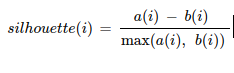

we evaluate the quality of clustering also with another method called Silhouette Score and for each item of clothes in each image andfor 100 samples from data we calculate silhouette scores for k = 2, 3, 4 to see in which number of cluster the silhouette score has is the best score.which shows the quality of clustering .then we can validate elbow method and we can decide for which number of cluster get the best clusters colors and then get the dominant color from them.

Where:

a(i) is the average distance between the sample i and all other points in the same cluster (cohesion).

b(i) is the average distance between the sample i and all points in the nearest cluster that the sample is not a part of (separation).

The overall Silhouette Score for a clustering solution is the average of the silhouette scores of all samples.

### our End to End Pipeline for obtaining short description for (type of clothing items and color) all clothing items for 100 sample images 

In [1]:

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from ultralytics import YOLO
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from torchvision.ops import nms
import random
from sklearn.cluster import KMeans


css3_colors = {
    'aliceblue': (240, 248, 255), 'antiquewhite': (250, 235, 215), 'aqua': (0, 255, 255),
    'aquamarine': (127, 255, 212), 'azure': (240, 255, 255), 'beige': (245, 245, 220),
    'bisque': (255, 228, 196), 'black': (0, 0, 0), 'blanchedalmond': (255, 235, 205),
    'blue': (0, 0, 255), 'blueviolet': (138, 43, 226), 'brown': (165, 42, 42),
    'burlywood': (222, 184, 135), 'cadetblue': (95, 158, 160), 'chartreuse': (127, 255, 0),
    'chocolate': (210, 105, 30), 'coral': (255, 127, 80), 'cornflowerblue': (100, 149, 237),
    'cornsilk': (255, 248, 220), 'crimson': (220, 20, 60), 'cyan': (0, 255, 255),
    'darkblue': (0, 0, 139), 'darkcyan': (0, 139, 139), 'darkgoldenrod': (184, 134, 11),
    'darkgray': (169, 169, 169), 'darkgreen': (0, 100, 0), 'darkkhaki': (189, 183, 107),
    'darkmagenta': (139, 0, 139), 'darkolivegreen': (85, 107, 47), 'darkorange': (255, 140, 0),
    'darkorchid': (153, 50, 204), 'darkred': (139, 0, 0), 'darksalmon': (233, 150, 122),
    'darkseagreen': (143, 188, 143), 'darkslateblue': (72, 61, 139), 'darkslategray': (47, 79, 79),
    'darkturquoise': (0, 206, 209), 'darkviolet': (148, 0, 211), 'deeppink': (255, 20, 147),
    'deepskyblue': (0, 191, 255), 'dimgray': (105, 105, 105), 'dodgerblue': (30, 144, 255),
    'firebrick': (178, 34, 34), 'floralwhite': (255, 250, 240), 'forestgreen': (34, 139, 34),
    'fuchsia': (255, 0, 255), 'gainsboro': (220, 220, 220), 'ghostwhite': (248, 248, 255),
    'gold': (255, 215, 0), 'goldenrod': (218, 165, 32), 'gray': (128, 128, 128),
    'green': (0, 128, 0), 'greenyellow': (173, 255, 47), 'honeydew': (240, 255, 240),
    'hotpink': (255, 105, 180), 'indianred': (205, 92, 92), 'indigo': (75, 0, 130),
    'ivory': (255, 255, 240), 'khaki': (240, 230, 140), 'lavender': (230, 230, 250),
    'lavenderblush': (255, 240, 245), 'lawngreen': (124, 252, 0), 'lemonchiffon': (255, 250, 205),
    'lightblue': (173, 216, 230), 'lightcoral': (240, 128, 128), 'lightcyan': (224, 255, 255),
    'lightgoldenrodyellow': (250, 250, 210), 'lightgreen': (144, 238, 144), 'lightgrey': (211, 211, 211),
    'lightpink': (255, 182, 193), 'lightsalmon': (255, 160, 122), 'lightseagreen': (32, 178, 170),
    'lightskyblue': (135, 206, 250), 'lightslategray': (119, 136, 153), 'lightsteelblue': (176, 196, 222),
    'lightyellow': (255, 255, 224), 'lime': (0, 255, 0), 'limegreen': (50, 205, 50),
    'linen': (250, 240, 230), 'magenta': (255, 0, 255), 'maroon': (128, 0, 0),
    'mediumaquamarine': (102, 205, 170), 'mediumblue': (0, 0, 205), 'mediumorchid': (186, 85, 211),
    'mediumpurple': (147, 112, 219), 'mediumseagreen': (60, 179, 113), 'mediumslateblue': (123, 104, 238),
    'mediumspringgreen': (0, 250, 154), 'mediumturquoise': (72, 209, 204), 'mediumvioletred': (199, 21, 133),
    'midnightblue': (25, 25, 112), 'mintcream': (245, 255, 250), 'mistyrose': (255, 228, 225),
    'moccasin': (255, 228, 181), 'navajowhite': (255, 222, 173), 'navy': (0, 0, 128),
    'oldlace': (253, 245, 230), 'olive': (128, 128, 0), 'olivedrab': (107, 142, 35),
    'orange': (255, 165, 0), 'orangered': (255, 69, 0), 'orchid': (218, 112, 214),
    'palegoldenrod': (238, 232, 170), 'palegreen': (152, 251, 152), 'paleturquoise': (175, 238, 238),
    'palevioletred': (219, 112, 147), 'papayawhip': (255, 239, 213), 'peachpuff': (255, 218, 185),
    'peru': (205, 133, 63), 'pink': (255, 192, 203), 'plum': (221, 160, 221),
    'powderblue': (176, 224, 230), 'purple': (128, 0, 128), 'rebeccapurple': (102, 51, 153),
    'red': (255, 0, 0), 'rosybrown': (188, 143, 143), 'royalblue': (65, 105, 225),
    'saddlebrown': (139, 69, 19), 'salmon': (250, 128, 114), 'sandybrown': (244, 164, 96),
    'seagreen': (46, 139, 87), 'seashell': (255, 245, 238), 'sienna': (160, 82, 45),
    'silver': (192, 192, 192), 'skyblue': (135, 206, 235), 'slateblue': (106, 90, 205),
    'slategray': (112, 128, 144), 'snow': (255, 250, 250), 'springgreen': (0, 255, 127),
    'silver': (192, 192, 192), 'skyblue': (135, 206, 235), 'slateblue': (106, 90, 205),
    'silver': (192, 192, 192), 'skyblue': (135, 206, 235), 'slateblue': (106, 90, 205),
    'slategray': (112, 128, 144), 'snow': (255, 250, 250), 'springgreen': (0, 255, 127),
    'steelblue': (70, 130, 180), 'tan': (210, 180, 140), 'teal': (0, 128, 128),
    'thistle': (216, 191, 216), 'tomato': (255, 99, 71), 'turquoise': (64, 224, 208),
    'violet': (238, 130, 238), 'wheat': (245, 222, 179), 'white': (255, 255, 255),
    'whitesmoke': (245, 245, 245), 'yellow': (255, 255, 0), 'yellowgreen': (154, 205, 50)
}









# Function to find the closest color name from the CSS3 color dictionary
def closest_color(requested_color):
    min_diff = float('inf')
    closest_color_name = None
    for color_name, rgb in css3_colors.items():
        diff = np.sqrt(np.sum((np.array(rgb) - np.array(requested_color)) ** 2))
        if diff < min_diff:
            min_diff = diff
            closest_color_name = color_name
    return closest_color_name, css3_colors[closest_color_name]

# Function to perform K-means clustering
def kmeans_clustering(image, n_clusters=2):
    pixels = image.reshape(-1, 4)
    pixels = pixels[pixels[:, 3] > 0]
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(pixels[:, :3])
    cluster_centers = kmeans.cluster_centers_
    cluster_centers = (cluster_centers * 255).astype(int)
    labels = kmeans.labels_
    return cluster_centers, labels

# Function to process a segmented image patch and return dominant color information
def process_segmented_patch(image):
    cluster_centers, labels = kmeans_clustering(image)
    labels = labels.flatten()
    counts = np.bincount(labels.astype(int))

    total_pixels = len(labels)
    percentages = (counts / total_pixels) * 100

    max_count_idx = np.argmax(percentages)
    dominant_color = cluster_centers[max_count_idx]
    dominant_color_name, dominant_color_rgb = closest_color(dominant_color[:3])

    return dominant_color_name, dominant_color_rgb, percentages, cluster_centers, counts, dominant_color, max_count_idx

# Dataset class for loading and processing images
class FashionDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image_path, image

# Function to apply Non-Maximum Suppression (NMS)
def apply_nms(detected_items, iou_threshold=0.5):
    boxes = [item['coordinates'] for item in detected_items]
    scores = [item['confidence'] for item in detected_items]
    labels = [item['label'] for item in detected_items]

    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
    scores_tensor = torch.tensor(scores, dtype=torch.float32)

    # Apply NMS
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)

    # Filter boxes, scores, and labels based on NMS output
    nms_boxes = boxes_tensor[nms_indices].tolist()
    nms_scores = scores_tensor[nms_indices].tolist()
    nms_labels = [labels[i] for i in nms_indices]

    # Reformat the filtered results into the detected_items structure
    nms_items = []
    for i in range(len(nms_boxes)):
        nms_items.append({
            'label': nms_labels[i],
            'coordinates': nms_boxes[i],
            'confidence': nms_scores[i]
        })
    return nms_items

# Function for conflict resolution
def conflict_resolution(items):
    final_items = []
    items_dict = {}
    for i, item in enumerate(items):
        items_dict[item['label']] = {'confidence': item['confidence'], 'idx': i}

    conflicts = {
        'shirt': ['dress'],
        'pants': ['shorts', 'skirt'],
        'shorts': ['pants', 'skirt'],
        'skirt': ['pants', 'shorts'],
        'dress': ['shirt']
    }

    conflict_pairs = []
    for k in items_dict.keys():
        if k not in conflicts:
            final_items.append(items[items_dict[k]['idx']])
        else:
            flag = True
            for conflict in conflicts[k]:
                if conflict in items_dict.keys():
                    if set([k, conflict]) not in conflict_pairs:
                        conflict_pairs.append(set([k, conflict]))
                    flag = False
            if flag:
                final_items.append(items[items_dict[k]['idx']])

    for i, pair in enumerate(conflict_pairs):
        conflict_pairs[i] = list(pair)
    winners = []

    for pair in conflict_pairs:
        if pair[0] in winners:
            final_items.append(items[items_dict[pair[0]]['idx']])
        elif pair[1] in winners:
            final_items.append(items[items_dict[pair[1]]['idx']])
        elif items_dict[pair[0]]['confidence'] > items_dict[pair[1]]['confidence']:
            final_items.append(items[items_dict[pair[0]]['idx']])
            winners.append(pair[0])
        else:
            final_items.append(items[items_dict[pair[1]]['idx']])
            winners.append(pair[1])
    return final_items

# Function to detect and segment objects in batches
def detect_and_segment_batch(base_path, image_paths, yolo_weights_path, sam2_weights_path, sam2_config_path, batch_size=4):
    # Load the SAMv2 model
    mask_predictor = SAM2ImagePredictor(build_sam2(sam2_config_path, sam2_weights_path))
    # Load the YOLO model
    model = YOLO(yolo_weights_path)
    transform = transforms.Compose([transforms.ToTensor()])

    dataset = FashionDataset(image_paths, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    for batch in dataloader:
        image_paths_batch, images_batch = batch
        images_batch = images_batch.to('cuda')

        for i, image in enumerate(images_batch):
            sample_image_path = image_paths_batch[i]
            image_name = os.path.splitext(os.path.basename(sample_image_path))[0]
            image_dir = os.path.join(base_path, f"color_detection_kmeans/{image_name}")
            os.makedirs(image_dir, exist_ok=True)

            # Perform object detection with YOLO
            results = model(sample_image_path)
            image_pil = transforms.ToPILImage()(image.cpu())
            image_rgb = np.array(image_pil)
            image_bgr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)

            # Collect detected items
            detected_items = []
            for result in results:
                boxes = result.boxes
                for box in boxes:
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    confidence = box.conf[0].item()
                    class_id = int(box.cls[0])
                    label = model.names[class_id]

                    detected_items.append({
                        'label': label,
                        'coordinates': (x1, y1, x2, y2),
                        'confidence': confidence
                    })

            # Apply NMS and conflict resolution
            nms_filtered_items = apply_nms(detected_items, iou_threshold=0.5)
            resolved_items = conflict_resolution(nms_filtered_items)

            crop_counter = 0
            predicted_boxes = []
            crop_dirs = []
            labels = []
            descriptions = []  # List to store descriptions
            for item in resolved_items:
                x1, y1, x2, y2 = item['coordinates']
                confidence = item['confidence']
                label = item['label']
                labels.append(label)

                cropped_dir = os.path.join(image_dir, f"{label}-{confidence:.2f}-{crop_counter}")
                os.makedirs(cropped_dir, exist_ok=True)
                crop_dirs.append(cropped_dir)

                original_filename = os.path.join(cropped_dir, "original.jpg")
                image_pil.save(original_filename)

                draw = ImageDraw.Draw(image_pil)
                draw.rectangle([x1, y1, x2, y2], outline="green", width=2)
                draw.text((x1, y1 - 10), f"{label} {confidence:.2f}", fill="green", font=ImageFont.load_default())

                cropped_filename = os.path.join(cropped_dir, "cropped.jpg")
                cropped_image = image_pil.crop((x1, y1, x2, y2))
                cropped_image.save(cropped_filename)
                predicted_boxes.append([x1, y1, x2, y2])
                crop_counter += 1

            # Perform segmentation with SAMv2
            predicted_boxes_tensor = torch.tensor(predicted_boxes, dtype=torch.float32).to('cuda')

            mask_predictor.set_image(image_bgr)
            masks, _, _ = mask_predictor.predict(
                point_coords=None,
                point_labels=None,
                box=predicted_boxes_tensor[None, :],
                multimask_output=False,
            )

            for j, mask in enumerate(masks):
                mask = mask[0].astype(np.uint8)
                mask_image = Image.fromarray(mask * 255)
                mask_filename = os.path.join(crop_dirs[j], "mask.png")
                mask_image.save(mask_filename)

                isolated_image = image_rgb * mask[:, :, np.newaxis]
                isolated_image_pil = Image.fromarray(isolated_image)
                isolated_filename = os.path.join(crop_dirs[j], "isolated.png")
                isolated_image_pil.save(isolated_filename)

                coords = np.column_stack(np.where(mask > 0))
                if coords.size == 0:
                    continue
                y1, x1 = coords.min(axis=0)
                y2, x2 = coords.max(axis=0)

                isolated_cropped_image = isolated_image[y1:y2+1, x1:x2+1]
                isolated_cropped_image_rgba = np.zeros((y2 - y1 + 1, x2 - x1 + 1, 4), dtype=np.uint8)
                isolated_cropped_image_rgba[..., :3] = isolated_cropped_image
                isolated_cropped_image_rgba[..., 3] = mask[y1:y2+1, x1:x2+1] * 255

                segmented_cropped_filename = os.path.join(crop_dirs[j], "segmented_cropped.png")
                isolated_cropped_image_rgba_pil = Image.fromarray(isolated_cropped_image_rgba, 'RGBA')
                isolated_cropped_image_rgba_pil.save(segmented_cropped_filename)

                segmented_cropped_image = plt.imread(segmented_cropped_filename)
                
                # Get dominant color information
                dominant_color_name, dominant_color_rgb, percentages, cluster_centers, counts, dominant_color, max_count_idx = process_segmented_patch(segmented_cropped_image)
                item_name = os.path.basename(crop_dirs[j]).split('-')[0]
                
                # Create the description using the dominant color's RGB value and name
                description = f"A {dominant_color_name} (RGB: {dominant_color.tolist()}) {item_name}."
                descriptions.append(description)
                
                # Print the description for each item
                print(description)
                
                # Save description to a text file
                text_filename = os.path.join(crop_dirs[j], "color.txt")
                with open(text_filename, 'w') as f:
                    f.write(f"{description}\n")
                    f.write(f"Final Colors: {cluster_centers.tolist()}\n")
                    for idx, color_center in enumerate(cluster_centers):
                        # Get color name for each cluster center
                        color_name, _ = closest_color(color_center[:3])
                        f.write(f"Cluster {idx + 1}: Color Name: {color_name}, RGB: {color_center.tolist()}\n")
                    f.write(f"Counts of cluster pixels: {counts.tolist()}\n")
                    f.write(f"Percentages: {percentages.tolist()}\n")
                    f.write(f"Dominant Cluster: {max_count_idx}\n")

        torch.cuda.empty_cache()

    print("Segmentation and color detection complete.")

# Example usage:
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
jpeg_images_path = "JPEGImages"

train_image_path = os.path.join(jpeg_images_path, "train")
val_image_path = os.path.join(jpeg_images_path, "val")
test_image_path = os.path.join(jpeg_images_path, "test")

# Load the trained YOLO model
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train', 'weights')
yolo_best_weights_path = os.path.join(weights_save_path, "best.pt")

# Paths for SAMv2
sam2_weights_path = os.path.join(base_path, "segment-anything-2/checkpoints/sam2_hiera_large.pt")
sam2_config_path = "sam2_hiera_l.yaml"

# Gather all image paths
train_images = [os.path.join(train_image_path, img) for img in os.listdir(train_image_path) if img.endswith(('.jpg', '.jpeg', '.png'))]
val_images = [os.path.join(val_image_path, img) for img in os.listdir(val_image_path) if img.endswith(('.jpg', '.jpeg', '.png'))]
test_images = [os.path.join(test_image_path, img) for img in os.listdir(test_image_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Sample 100 images
all_image_paths = random.sample(train_images + val_images + test_images, 100)

# Process the images and print descriptions
detect_and_segment_batch(base_path, all_image_paths, yolo_best_weights_path, sam2_weights_path, sam2_config_path, batch_size=10)

/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/segment-anything-2/sam2/modeling/sam/transformer.py:23: UserWarning: Flash Attention is disabled as it requires a GPU with Ampere (8.0) CUDA capability.
  OLD_GPU, USE_FLASH_ATTN, MATH_KERNEL_ON = get_sdpa_settings()



image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/val/44730.jpg: 640x448 1 sunglass, 1 jacket, 1 shirt, 1 skirt, 1 bag, 1 shoe, 40.1ms
Speed: 4.4ms preprocess, 40.1ms inference, 129.6ms postprocess per image at shape (1, 3, 640, 448)
A seagreen (RGB: [27, 120, 87]) jacket.
A sienna (RGB: [139, 81, 47]) bag.
A darkolivegreen (RGB: [105, 79, 62]) shoe.
A rosybrown (RGB: [190, 146, 129]) skirt.
A black (RGB: [41, 18, 16]) sunglass.
A silver (RGB: [222, 197, 184]) shirt.

image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train/97381.jpg: 640x448 1 dress, 1 shoe, 15.6ms
Speed: 2.2ms preprocess, 15.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 448)
A goldenrod (RGB: [220, 199, 68]) dress.
A lightgrey (RGB: [219, 212, 212]) shoe.

image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train/185284.jpg: 640x448 1 dress, 1 bag, 1 shoe, 15.3ms
Speed: 1.9ms preprocess, 15.3ms 

## our End to End pipeline on the entire dataset

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from ultralytics import YOLO
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from torchvision.ops import nms
import random
from sklearn.cluster import KMeans


css3_colors = {
    'aliceblue': (240, 248, 255), 'antiquewhite': (250, 235, 215), 'aqua': (0, 255, 255),
    'aquamarine': (127, 255, 212), 'azure': (240, 255, 255), 'beige': (245, 245, 220),
    'bisque': (255, 228, 196), 'black': (0, 0, 0), 'blanchedalmond': (255, 235, 205),
    'blue': (0, 0, 255), 'blueviolet': (138, 43, 226), 'brown': (165, 42, 42),
    'burlywood': (222, 184, 135), 'cadetblue': (95, 158, 160), 'chartreuse': (127, 255, 0),
    'chocolate': (210, 105, 30), 'coral': (255, 127, 80), 'cornflowerblue': (100, 149, 237),
    'cornsilk': (255, 248, 220), 'crimson': (220, 20, 60), 'cyan': (0, 255, 255),
    'darkblue': (0, 0, 139), 'darkcyan': (0, 139, 139), 'darkgoldenrod': (184, 134, 11),
    'darkgray': (169, 169, 169), 'darkgreen': (0, 100, 0), 'darkkhaki': (189, 183, 107),
    'darkmagenta': (139, 0, 139), 'darkolivegreen': (85, 107, 47), 'darkorange': (255, 140, 0),
    'darkorchid': (153, 50, 204), 'darkred': (139, 0, 0), 'darksalmon': (233, 150, 122),
    'darkseagreen': (143, 188, 143), 'darkslateblue': (72, 61, 139), 'darkslategray': (47, 79, 79),
    'darkturquoise': (0, 206, 209), 'darkviolet': (148, 0, 211), 'deeppink': (255, 20, 147),
    'deepskyblue': (0, 191, 255), 'dimgray': (105, 105, 105), 'dodgerblue': (30, 144, 255),
    'firebrick': (178, 34, 34), 'floralwhite': (255, 250, 240), 'forestgreen': (34, 139, 34),
    'fuchsia': (255, 0, 255), 'gainsboro': (220, 220, 220), 'ghostwhite': (248, 248, 255),
    'gold': (255, 215, 0), 'goldenrod': (218, 165, 32), 'gray': (128, 128, 128),
    'green': (0, 128, 0), 'greenyellow': (173, 255, 47), 'honeydew': (240, 255, 240),
    'hotpink': (255, 105, 180), 'indianred': (205, 92, 92), 'indigo': (75, 0, 130),
    'ivory': (255, 255, 240), 'khaki': (240, 230, 140), 'lavender': (230, 230, 250),
    'lavenderblush': (255, 240, 245), 'lawngreen': (124, 252, 0), 'lemonchiffon': (255, 250, 205),
    'lightblue': (173, 216, 230), 'lightcoral': (240, 128, 128), 'lightcyan': (224, 255, 255),
    'lightgoldenrodyellow': (250, 250, 210), 'lightgreen': (144, 238, 144), 'lightgrey': (211, 211, 211),
    'lightpink': (255, 182, 193), 'lightsalmon': (255, 160, 122), 'lightseagreen': (32, 178, 170),
    'lightskyblue': (135, 206, 250), 'lightslategray': (119, 136, 153), 'lightsteelblue': (176, 196, 222),
    'lightyellow': (255, 255, 224), 'lime': (0, 255, 0), 'limegreen': (50, 205, 50),
    'linen': (250, 240, 230), 'magenta': (255, 0, 255), 'maroon': (128, 0, 0),
    'mediumaquamarine': (102, 205, 170), 'mediumblue': (0, 0, 205), 'mediumorchid': (186, 85, 211),
    'mediumpurple': (147, 112, 219), 'mediumseagreen': (60, 179, 113), 'mediumslateblue': (123, 104, 238),
    'mediumspringgreen': (0, 250, 154), 'mediumturquoise': (72, 209, 204), 'mediumvioletred': (199, 21, 133),
    'midnightblue': (25, 25, 112), 'mintcream': (245, 255, 250), 'mistyrose': (255, 228, 225),
    'moccasin': (255, 228, 181), 'navajowhite': (255, 222, 173), 'navy': (0, 0, 128),
    'oldlace': (253, 245, 230), 'olive': (128, 128, 0), 'olivedrab': (107, 142, 35),
    'orange': (255, 165, 0), 'orangered': (255, 69, 0), 'orchid': (218, 112, 214),
    'palegoldenrod': (238, 232, 170), 'palegreen': (152, 251, 152), 'paleturquoise': (175, 238, 238),
    'palevioletred': (219, 112, 147), 'papayawhip': (255, 239, 213), 'peachpuff': (255, 218, 185),
    'peru': (205, 133, 63), 'pink': (255, 192, 203), 'plum': (221, 160, 221),
    'powderblue': (176, 224, 230), 'purple': (128, 0, 128), 'rebeccapurple': (102, 51, 153),
    'red': (255, 0, 0), 'rosybrown': (188, 143, 143), 'royalblue': (65, 105, 225),
    'saddlebrown': (139, 69, 19), 'salmon': (250, 128, 114), 'sandybrown': (244, 164, 96),
    'seagreen': (46, 139, 87), 'seashell': (255, 245, 238), 'sienna': (160, 82, 45),
    'silver': (192, 192, 192), 'skyblue': (135, 206, 235), 'slateblue': (106, 90, 205),
    'slategray': (112, 128, 144), 'snow': (255, 250, 250), 'springgreen': (0, 255, 127),
    'silver': (192, 192, 192), 'skyblue': (135, 206, 235), 'slateblue': (106, 90, 205),
    'silver': (192, 192, 192), 'skyblue': (135, 206, 235), 'slateblue': (106, 90, 205),
    'slategray': (112, 128, 144), 'snow': (255, 250, 250), 'springgreen': (0, 255, 127),
    'steelblue': (70, 130, 180), 'tan': (210, 180, 140), 'teal': (0, 128, 128),
    'thistle': (216, 191, 216), 'tomato': (255, 99, 71), 'turquoise': (64, 224, 208),
    'violet': (238, 130, 238), 'wheat': (245, 222, 179), 'white': (255, 255, 255),
    'whitesmoke': (245, 245, 245), 'yellow': (255, 255, 0), 'yellowgreen': (154, 205, 50)
}



# Function to find the closest color name from the CSS3 color dictionary
def closest_color(requested_color):
    min_diff = float('inf')
    closest_color_name = None
    for color_name, rgb in css3_colors.items():
        diff = np.sqrt(np.sum((np.array(rgb) - np.array(requested_color)) ** 2))
        if diff < min_diff:
            min_diff = diff
            closest_color_name = color_name
    return closest_color_name, css3_colors[closest_color_name]

# Function to perform K-means clustering
def kmeans_clustering(image, n_clusters=2):
    pixels = image.reshape(-1, 4)
    pixels = pixels[pixels[:, 3] > 0]
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(pixels[:, :3])
    cluster_centers = kmeans.cluster_centers_
    cluster_centers = (cluster_centers * 255).astype(int)
    labels = kmeans.labels_
    return cluster_centers, labels

# Function to process a segmented image patch and return dominant color information
def process_segmented_patch(image):
    cluster_centers, labels = kmeans_clustering(image)
    labels = labels.flatten()
    counts = np.bincount(labels.astype(int))

    total_pixels = len(labels)
    percentages = (counts / total_pixels) * 100

    max_count_idx = np.argmax(percentages)
    dominant_color = cluster_centers[max_count_idx]
    dominant_color_name, dominant_color_rgb = closest_color(dominant_color[:3])

    return dominant_color_name, dominant_color_rgb, percentages, cluster_centers, counts, dominant_color, max_count_idx

# Dataset class for loading and processing images
class FashionDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image_path, image

# Function to apply Non-Maximum Suppression (NMS)
def apply_nms(detected_items, iou_threshold=0.5):
    boxes = [item['coordinates'] for item in detected_items]
    scores = [item['confidence'] for item in detected_items]
    labels = [item['label'] for item in detected_items]

    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
    scores_tensor = torch.tensor(scores, dtype=torch.float32)

    # Apply NMS
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)

    # Filter boxes, scores, and labels based on NMS output
    nms_boxes = boxes_tensor[nms_indices].tolist()
    nms_scores = scores_tensor[nms_indices].tolist()
    nms_labels = [labels[i] for i in nms_indices]

    # Reformat the filtered results into the detected_items structure
    nms_items = []
    for i in range(len(nms_boxes)):
        nms_items.append({
            'label': nms_labels[i],
            'coordinates': nms_boxes[i],
            'confidence': nms_scores[i]
        })
    return nms_items

# Function for conflict resolution
def conflict_resolution(items):
    final_items = []
    items_dict = {}
    for i, item in enumerate(items):
        items_dict[item['label']] = {'confidence': item['confidence'], 'idx': i}

    conflicts = {
        'shirt': ['dress'],
        'pants': ['shorts', 'skirt'],
        'shorts': ['pants', 'skirt'],
        'skirt': ['pants', 'shorts'],
        'dress': ['shirt']
    }

    conflict_pairs = []
    for k in items_dict.keys():
        if k not in conflicts:
            final_items.append(items[items_dict[k]['idx']])
        else:
            flag = True
            for conflict in conflicts[k]:
                if conflict in items_dict.keys():
                    if set([k, conflict]) not in conflict_pairs:
                        conflict_pairs.append(set([k, conflict]))
                    flag = False
            if flag:
                final_items.append(items[items_dict[k]['idx']])

    for i, pair in enumerate(conflict_pairs):
        conflict_pairs[i] = list(pair)
    winners = []

    for pair in conflict_pairs:
        if pair[0] in winners:
            final_items.append(items[items_dict[pair[0]]['idx']])
        elif pair[1] in winners:
            final_items.append(items[items_dict[pair[1]]['idx']])
        elif items_dict[pair[0]]['confidence'] > items_dict[pair[1]]['confidence']:
            final_items.append(items[items_dict[pair[0]]['idx']])
            winners.append(pair[0])
        else:
            final_items.append(items[items_dict[pair[1]]['idx']])
            winners.append(pair[1])
    return final_items

# Function to detect and segment objects in batches
def detect_and_segment_batch(base_path, image_paths, yolo_weights_path, sam2_weights_path, sam2_config_path, batch_size=4):
    # Load the SAMv2 model
    mask_predictor = SAM2ImagePredictor(build_sam2(sam2_config_path, sam2_weights_path))
    # Load the YOLO model
    model = YOLO(yolo_weights_path)
    transform = transforms.Compose([transforms.ToTensor()])

    dataset = FashionDataset(image_paths, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    for batch in dataloader:
        image_paths_batch, images_batch = batch
        images_batch = images_batch.to('cuda')

        for i, image in enumerate(images_batch):
            sample_image_path = image_paths_batch[i]
            image_name = os.path.splitext(os.path.basename(sample_image_path))[0]
            image_dir = os.path.join(base_path, f"color_detection_kmeans_clustering/{image_name}")
            os.makedirs(image_dir, exist_ok=True)

            # Perform object detection with YOLO
            results = model(sample_image_path)
            image_pil = transforms.ToPILImage()(image.cpu())
            image_rgb = np.array(image_pil)
            image_bgr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)

            # Collect detected items
            detected_items = []
            for result in results:
                boxes = result.boxes
                for box in boxes:
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    confidence = box.conf[0].item()
                    class_id = int(box.cls[0])
                    label = model.names[class_id]

                    detected_items.append({
                        'label': label,
                        'coordinates': (x1, y1, x2, y2),
                        'confidence': confidence
                    })

            # Apply NMS and conflict resolution
            nms_filtered_items = apply_nms(detected_items, iou_threshold=0.5)
            resolved_items = conflict_resolution(nms_filtered_items)

            crop_counter = 0
            predicted_boxes = []
            crop_dirs = []
            labels = []
            for item in resolved_items:
                x1, y1, x2, y2 = item['coordinates']
                confidence = item['confidence']
                label = item['label']
                labels.append(label)

                cropped_dir = os.path.join(image_dir, f"{label}-{confidence:.2f}-{crop_counter}")
                os.makedirs(cropped_dir, exist_ok=True)
                crop_dirs.append(cropped_dir)

                original_filename = os.path.join(cropped_dir, "original.jpg")
                image_pil.save(original_filename)

                cropped_filename = os.path.join(cropped_dir, "cropped.jpg")
                cropped_image = image_pil.crop((x1, y1, x2, y2))
                cropped_image.save(cropped_filename)
                predicted_boxes.append([x1, y1, x2, y2])
                crop_counter += 1

            # Perform segmentation with SAMv2
            predicted_boxes_tensor = torch.tensor(predicted_boxes, dtype=torch.float32).to('cuda')

            mask_predictor.set_image(image_bgr)
            masks, _, _ = mask_predictor.predict(
                point_coords=None,
                point_labels=None,
                box=predicted_boxes_tensor[None, :],
                multimask_output=False,
            )

            for j, mask in enumerate(masks):
                mask = mask[0].astype(np.uint8)

                # Ensure mask has at least 2 dimensions (expand if needed)
                if mask.ndim == 2:
                    mask = np.expand_dims(mask, axis=-1)

                mask_image = Image.fromarray(mask[:, :, 0] * 255)
                mask_filename = os.path.join(crop_dirs[j], "mask.png")
                mask_image.save(mask_filename)

                isolated_image = image_rgb * mask[:, :, :3]
                isolated_image_pil = Image.fromarray(isolated_image)
                isolated_filename = os.path.join(crop_dirs[j], "isolated.png")
                isolated_image_pil.save(isolated_filename)

                coords = np.column_stack(np.where(mask[:, :, 0] > 0))
                if coords.size == 0:
                    continue
                y1, x1 = coords.min(axis=0)
                y2, x2 = coords.max(axis=0)

                isolated_cropped_image = isolated_image[y1:y2+1, x1:x2+1]
                isolated_cropped_image_rgba = np.zeros((y2 - y1 + 1, x2 - x1 + 1, 4), dtype=np.uint8)
                isolated_cropped_image_rgba[..., :3] = isolated_cropped_image
                isolated_cropped_image_rgba[..., 3] = mask[y1:y2+1, x1:x2+1, 0] * 255

                segmented_cropped_filename = os.path.join(crop_dirs[j], "segmented_cropped.png")
                isolated_cropped_image_rgba_pil = Image.fromarray(isolated_cropped_image_rgba, 'RGBA')
                isolated_cropped_image_rgba_pil.save(segmented_cropped_filename)

                segmented_cropped_image = plt.imread(segmented_cropped_filename)
                
                # Get dominant color information
                dominant_color_name, dominant_color_rgb, percentages, cluster_centers, counts, dominant_color, max_count_idx = process_segmented_patch(segmented_cropped_image)
                item_name = os.path.basename(crop_dirs[j]).split('-')[0]
                
                # Create the description using the dominant color's RGB value and name
                description = f"A {dominant_color_name} (RGB: {dominant_color.tolist()}) {item_name}."
                
                # Save description to a text file
                text_filename = os.path.join(crop_dirs[j], "color.txt")
                with open(text_filename, 'w') as f:
                    f.write(f"{description}\n")
                    f.write(f"Final Colors: {cluster_centers.tolist()}\n")
                    for idx, color_center in enumerate(cluster_centers):
                        # Get color name for each cluster center
                        color_name, _ = closest_color(color_center[:3])
                        f.write(f"Cluster {idx + 1}: Color Name: {color_name}, RGB: {color_center.tolist()}\n")
                    f.write(f"Counts of cluster pixels: {counts.tolist()}\n")
                    f.write(f"Percentages: {percentages.tolist()}\n")
                    f.write(f"Dominant Cluster: {max_count_idx}\n")

        torch.cuda.empty_cache()

# Example usage:
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
jpeg_images_path = "JPEGImages"

train_image_path = os.path.join(jpeg_images_path, "train")
val_image_path = os.path.join(jpeg_images_path, "val")
test_image_path = os.path.join(jpeg_images_path, "test")

# Load the trained YOLO model
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train', 'weights')
yolo_best_weights_path = os.path.join(weights_save_path, "best.pt")

# Paths for SAMv2
sam2_weights_path = os.path.join(base_path, "segment-anything-2/checkpoints/sam2_hiera_large.pt")
sam2_config_path = "sam2_hiera_l.yaml"

# Gather all image paths
all_image_paths = []
for image_dir in [train_image_path, val_image_path, test_image_path]:
    all_image_paths.extend([os.path.join(image_dir, img) for img in os.listdir(image_dir) if img.endswith(('.jpg', '.jpeg', '.png'))])

# Process the entire dataset
detect_and_segment_batch(base_path, all_image_paths, yolo_best_weights_path, sam2_weights_path, sam2_config_path, batch_size=10)


image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train/110094.jpg: 640x448 1 dress, 1 bag, 1 shoe, 16.6ms
Speed: 1.5ms preprocess, 16.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train/14487.jpg: 640x448 1 jacket, 1 shirt, 1 skirt, 1 shoe, 16.6ms
Speed: 1.9ms preprocess, 16.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train/171333.jpg: 640x448 1 shirt, 1 shorts, 1 bag, 1 shoe, 15.7ms
Speed: 1.8ms preprocess, 15.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/JPEGImages/train/5083.jpg: 640x448 1 sunglass, 1 jacket, 1 shirt, 1 skirt, 1 shoe, 18.8ms
Speed: 1.6ms preprocess, 18.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640

###  Methodology of Calculating Accuracy of Color Extraction

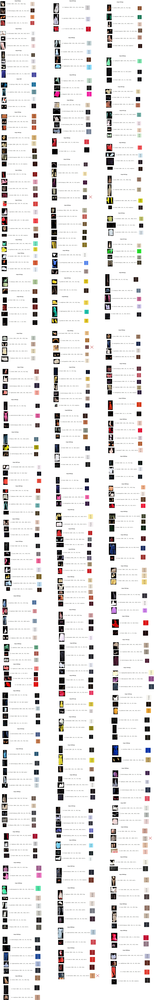

In [24]:
import os
from IPython.display import Image, display

# Path to your image
img_path = '/home/zohreh/Pictures/Screenshots/Diagram-Page-3.jpg'

# Check if the file exists
if os.path.exists(img_path):
    display(Image(filename=img_path))
else:
    print(f"File not found: {img_path}")

Manual RGB verification:

For each clothing item processed by our color extraction pipeline, we manually compared the predicted RGB values.

we used the rgb.to website to check the corresponding color for each RGB value. This website converts an RGB value to a named color (e.g., 255, 0, 0 would be "Red").

After obtaining the color name or visual representation, we compared it with the actual color of the clothing item to determine if the pipeline's prediction was accurate.

each image had a minimum of 3 and a maximum of 8 items of clothing.

Manual assessment process:

For each prediction, we evaluated whether the color extracted by the pipeline was similar to the actual color of the clothing item.
we noted down whether each prediction was correct (if the predicted color matched the actual clothing item color) or incorrect.

Final Manual Accuracy Calculation:

After comparing all items, we calculated the accuracy by dividing the number of correct predictions by the total number of predictions:
Accuracy = Number of Correct Predictions / Total Number of Predictions



In [29]:
# manual RGB verification
number_of_correctly_predicted_images = 96
total_number_of_images = 100
total_number_clothing_items = 350
total_number_correctly_predicted = 346
Accuracy_per_image = number_of_correctly_predicted_images / total_number_of_images
Accurcy_per_item = total_number_correctly_predicted / total_number_clothing_items
print(f'Accuracy per image :{Accuracy_per_image}')
print(f'Accuracy per item:{Accurcy_per_item}') 


Accuracy per image :0.96
Accuracy per item:0.9885714285714285


Our model’s mistakes in color extraction primarily stem from two issues: inaccurate segmentation and challenges with multi-colored clothing items. 

When segmentation is faulty, the extracted regions may include background or miss parts of the clothing, leading to incorrect color predictions. For multi-colored 

items, if different colors cover equal areas, the pipeline struggles to identify a dominant color, similar to human perception. However, in cases where one color

 clearly dominates, the pipeline successfully identifies it as the primary color, aligning well with human judgment

### 8. Test the Pipeline with a new images apart from our datset

The nex step is testing our model on new images. To this end we used 50 images from websites which are very limited in bounding box annotations .we pass through these images from our combinational model (YOLO + SAM) to see the results.

In [1]:
# import libraries 
import os
import glob
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt



we aim to pass 100 fashion images through the pipeline for color extraction .

there is very limited ground truth for the images and this is as a test for seeing our pipeline works properly for images without any groundtruth. 

## test our pipeline model in inference mode 


image 1/1 /home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering/new_images_for_test/images/001002.jpg: 640x544 1 jacket, 1 shirt, 1 skirt, 1 shoe, 21.7ms
Speed: 2.1ms preprocess, 21.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 544)


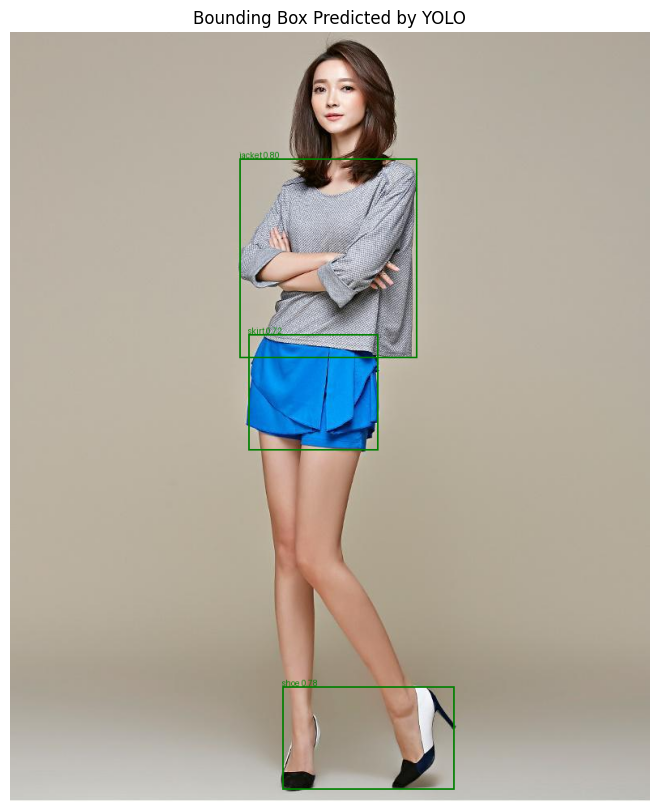

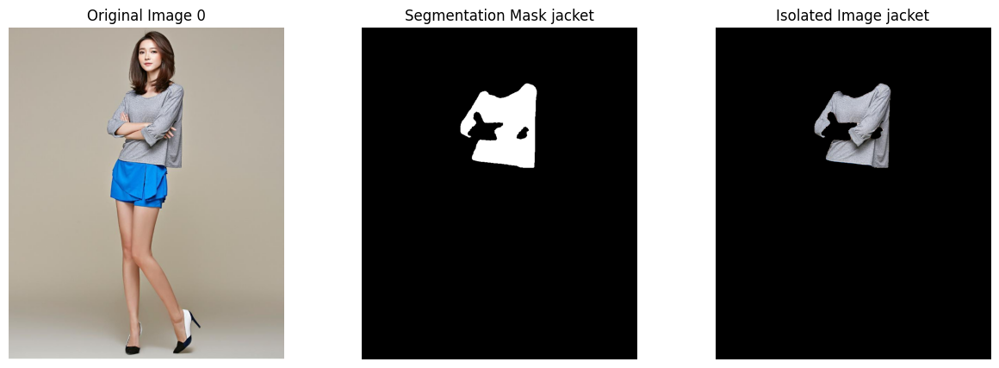

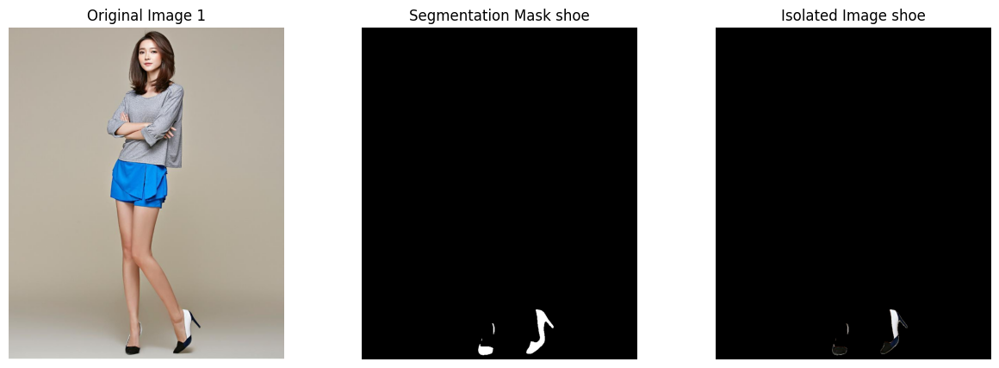

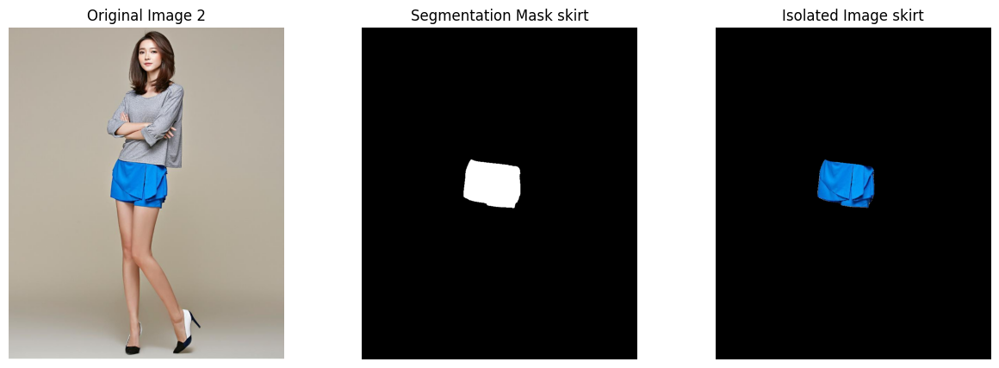

Segmentation and isolation complete.


In [3]:
import os
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
from ultralytics import YOLO
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from torchvision.ops import nms

torch.cuda.empty_cache()

def apply_nms(detected_items, iou_threshold=0.5):
    boxes = [item['coordinates'] for item in detected_items]
    scores = [item['confidence'] for item in detected_items]
    labels = [item['label'] for item in detected_items]
    
    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
    scores_tensor = torch.tensor(scores, dtype=torch.float32)

    # Apply NMS
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)
    
    # Filter boxes, scores, and labels based on NMS output
    nms_boxes = boxes_tensor[nms_indices].tolist()
    nms_scores = scores_tensor[nms_indices].tolist()
    nms_labels = [labels[i] for i in nms_indices]

    # Reformat the filtered results into the detected_items structure
    nms_items = []
    for i in range(len(nms_boxes)):
        nms_items.append({
            'label': nms_labels[i],
            'coordinates': nms_boxes[i],
            'confidence': nms_scores[i]
        })
    return nms_items
#function for solving conflict
def conflict_resolution(items):
    final_items = []
    items_dict = {}
    for i, item in enumerate(items):
        items_dict[item['label']] = {'confidence': item['confidence'], 'idx': i}

    conflicts = {
        'shirt': ['dress'],
        'pants': ['shorts', 'skirt'],
        'shorts': ['pants', 'skirt'],
        'skirt': ['pants', 'shorts'],
        'dress': ['shirt']
    }

    conflict_pairs = []
    for k in items_dict.keys():
        if k not in conflicts:
            final_items.append(items[items_dict[k]['idx']])
        else:
            flag = True
            for conflict in conflicts[k]:
                if conflict in items_dict.keys():
                    if set([k, conflict]) not in conflict_pairs:
                        conflict_pairs.append(set([k, conflict]))
                    flag = False
            if flag:
                final_items.append(items[items_dict[k]['idx']])

    for i, pair in enumerate(conflict_pairs):
        conflict_pairs[i] = list(pair)
    winners = []

    for pair in conflict_pairs:
        if pair[0] in winners:
            final_items.append(items[items_dict[pair[0]]['idx']])
        elif pair[1] in winners:
            final_items.append(items[items_dict[pair[1]]['idx']])
        elif items_dict[pair[0]]['confidence'] > items_dict[pair[1]]['confidence']:
            final_items.append(items[items_dict[pair[0]]['idx']])
            winners.append(pair[0])
        else:
            final_items.append(items[items_dict[pair[1]]['idx']])
            winners.append(pair[1])
    return final_items

def detect_and_segment_objects(sample_image_path, yolo_weights_path, sam2_weights_path, sam2_config_path):
    # Load the SAM2 model
    mask_predictor = SAM2ImagePredictor(build_sam2(sam2_config_path, sam2_weights_path))

    # Load the YOLO model
    model = YOLO(yolo_weights_path)

    # Load sample image
    image = Image.open(sample_image_path).convert('RGB')
    image_rgb = np.array(image)
    image_bgr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)

   

    # Perform object detection with YOLO
    results = model(sample_image_path)

    detected_items = []
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
            confidence = box.conf[0].item()  # Get confidence score
            class_id = int(box.cls[0])  # Get class id
            label = model.names[class_id]  # Get label for class id

            detected_items.append({
                'label': label,
                'coordinates': (x1, y1, x2, y2),
                'confidence': confidence
            })

    # Apply NMS and conflict resolution to filter and refine the bounding boxes
    nms_filtered_items = apply_nms(detected_items)
    resolved_items = conflict_resolution(nms_filtered_items)

    # Get the final bounding boxes after conflict resolution
    predicted_boxes = [item['coordinates'] for item in resolved_items]

    # Draw bounding boxes on the image
    draw = ImageDraw.Draw(image)
    for item in resolved_items:
        x1, y1, x2, y2 = item['coordinates']
        confidence = item['confidence']
        label = item['label']

        draw.rectangle([x1, y1, x2, y2], outline="green", width=2)
        draw.text((x1, y1 - 10), f"{label} {confidence:.2f}", fill="green", font=ImageFont.load_default())

    # Display the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title("Bounding Box Predicted by YOLO")
    plt.axis('off')
    plt.show()

    # Set the image for SAMv2 to generate segmentation masks
    mask_predictor.set_image(image_bgr)

    # SAMv2 generates masks for the objects within the bounding boxes
    predicted_boxes = np.array(predicted_boxes)
    masks, _, _ = mask_predictor.predict(
        point_coords=None,
        point_labels=None,
        box=predicted_boxes[None, :],
        multimask_output=False,
    )

    # Display the original image, segmentation mask, and isolated image together
    for i, mask in enumerate(masks):
        mask = mask[0].astype(np.uint8)  # Ensure mask is uint8 type

        # Isolate the object using the mask
        isolated_image = image_rgb * mask[:, :, np.newaxis]

        # Display the original image, segmentation mask, and isolated image side by side
        plt.figure(figsize=(15, 5))
        
        plt.subplot(1, 3, 1)
        plt.imshow(image_rgb)
        plt.title(f"Original Image {i}")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(mask, cmap='gray')
        plt.title(f"Segmentation Mask {resolved_items[i]['label']}")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(isolated_image)
        plt.title(f"Isolated Image {resolved_items[i]['label']}")
        plt.axis('off')

        plt.show()

    print("Segmentation and isolation complete.")

# Example usage:
base_path = '/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering'
# jpeg_images_path = "JPEGImages"
# val_image_path = os.path.join(jpeg_images_path, "val")

 #Directory containing the images you want to annotate
base_path_new = "/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering"
test_path = os.path.join(base_path_new, "new_images_for_test")
image_dir = os.path.join(test_path, "images")
# annotation_dir = os.path.join(base_path_new, 'ground_truth_dir')

# Load the trained YOLO model
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train', 'weights')
yolo_best_weights_path = os.path.join(weights_save_path, "best.pt")

# Paths for SAMv2
sam2_weights_path = os.path.join(base_path, "segment-anything-2/checkpoints/sam2_hiera_large.pt")
sam2_config_path = "sam2_hiera_l.yaml"

# Select a sample image
sample_image_path = os.path.join(image_dir, "001002.jpg")

# Perform detection and segmentation
detect_and_segment_objects(sample_image_path, yolo_best_weights_path, sam2_weights_path, sam2_config_path)

### 8.1. Get the Accuracy of of predictions from YOLOv8l 

#### 8.1.1 Annotate the images Manually

we annotated the clothing items manually because the bounding boxes for the images were limited to one or two clothing items

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Directory containing the images you want to annotate
base_path_new = "/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering"
test_path = os.path.join(base_path_new, "new_images_for_test")
image_dir = os.path.join(test_path, "images")
annotation_dir = os.path.join(base_path_new, 'ground_truth_dir')

# Create the annotation directory if it doesn't exist
os.makedirs(annotation_dir, exist_ok=True)

# Function to annotate an image
def annotate_image(image_path):
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('on')
    plt.show()

    # Prompt the user to enter the labels in a single input
    labels_input = input("Enter labels as a comma-separated list (e.g., 'shirt, pants, hat'): ").strip().lower()
    annotations = [label.strip() for label in labels_input.split(',')]

    print(f"Annotations for the image: {annotations}")
    return annotations

# List of all images in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

# Process each image in the directory
for image_filename in image_files:
    image_path = os.path.join(image_dir, image_filename)
    
    print(f"Annotating image: {image_filename}")
    annotations = annotate_image(image_path)
    
    # Save annotations to a text file
    annotation_filename = os.path.splitext(image_filename)[0] + ".txt"
    annotation_path = os.path.join(annotation_dir, annotation_filename)
    
    with open(annotation_path, "w") as f:
        for label in annotations:
            f.write(f"{label}\n")
    
    print(f"Annotations for {image_filename} saved to {annotation_path}\n")
    
    # Ask if the user wants to continue annotating
    continue_process = input("Do you want to continue annotating the next image? (yes/no): ").strip().lower()
    if continue_process != "yes":
        print("Annotation process stopped by the user.")
        break

#### 8.2. Segmentation with SAM on test images

In [ ]:

import glob
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from ultralytics import YOLO
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from sklearn.cluster import KMeans
import os
from torchvision.ops import nms



# CSS3 colors dictionary
css3_colors = {
    'aliceblue': (240, 248, 255), 'antiquewhite': (250, 235, 215), 'aqua': (0, 255, 255),
    'aquamarine': (127, 255, 212), 'azure': (240, 255, 255), 'beige': (245, 245, 220),
    'bisque': (255, 228, 196), 'black': (0, 0, 0), 'blanchedalmond': (255, 235, 205),
    'blue': (0, 0, 255), 'blueviolet': (138, 43, 226), 'brown': (165, 42, 42),
    'burlywood': (222, 184, 135), 'cadetblue': (95, 158, 160), 'chartreuse': (127, 255, 0),
    'chocolate': (210, 105, 30), 'coral': (255, 127, 80), 'cornflowerblue': (100, 149, 237),
    'cornsilk': (255, 248, 220), 'crimson': (220, 20, 60), 'cyan': (0, 255, 255),
    'darkblue': (0, 0, 139), 'darkcyan': (0, 139, 139), 'darkgoldenrod': (184, 134, 11),
    'darkgray': (169, 169, 169), 'darkgreen': (0, 100, 0), 'darkkhaki': (189, 183, 107),
    'darkmagenta': (139, 0, 139), 'darkolivegreen': (85, 107, 47), 'darkorange': (255, 140, 0),
    'darkorchid': (153, 50, 204), 'darkred': (139, 0, 0), 'darksalmon': (233, 150, 122),
    'darkseagreen': (143, 188, 143), 'darkslateblue': (72, 61, 139), 'darkslategray': (47, 79, 79),
    'darkturquoise': (0, 206, 209), 'darkviolet': (148, 0, 211), 'deeppink': (255, 20, 147),
    'deepskyblue': (0, 191, 255), 'dimgray': (105, 105, 105), 'dodgerblue': (30, 144, 255),
    'firebrick': (178, 34, 34), 'floralwhite': (255, 250, 240), 'forestgreen': (34, 139, 34),
    'fuchsia': (255, 0, 255), 'gainsboro': (220, 220, 220), 'ghostwhite': (248, 248, 255),
    'gold': (255, 215, 0), 'goldenrod': (218, 165, 32), 'gray': (128, 128, 128),
    'green': (0, 128, 0), 'greenyellow': (173, 255, 47), 'honeydew': (240, 255, 240),
    'hotpink': (255, 105, 180), 'indianred': (205, 92, 92), 'indigo': (75, 0, 130),
    'ivory': (255, 255, 240), 'khaki': (240, 230, 140), 'lavender': (230, 230, 250),
    'lavenderblush': (255, 240, 245), 'lawngreen': (124, 252, 0), 'lemonchiffon': (255, 250, 205),
    'lightblue': (173, 216, 230), 'lightcoral': (240, 128, 128), 'lightcyan': (224, 255, 255),
    'lightgoldenrodyellow': (250, 250, 210), 'lightgreen': (144, 238, 144), 'lightgrey': (211, 211, 211),
    'lightpink': (255, 182, 193), 'lightsalmon': (255, 160, 122), 'lightseagreen': (32, 178, 170),
    'lightskyblue': (135, 206, 250), 'lightslategray': (119, 136, 153), 'lightsteelblue': (176, 196, 222),
    'lightyellow': (255, 255, 224), 'lime': (0, 255, 0), 'limegreen': (50, 205, 50),
    'linen': (250, 240, 230), 'magenta': (255, 0, 255), 'maroon': (128, 0, 0),
    'mediumaquamarine': (102, 205, 170), 'mediumblue': (0, 0, 205), 'mediumorchid': (186, 85, 211),
    'mediumpurple': (147, 112, 219), 'mediumseagreen': (60, 179, 113), 'mediumslateblue': (123, 104, 238),
    'mediumspringgreen': (0, 250, 154), 'mediumturquoise': (72, 209, 204), 'mediumvioletred': (199, 21, 133),
    'midnightblue': (25, 25, 112), 'mintcream': (245, 255, 250), 'mistyrose': (255, 228, 225),
    'moccasin': (255, 228, 181), 'navajowhite': (255, 222, 173), 'navy': (0, 0, 128),
    'oldlace': (253, 245, 230), 'olive': (128, 128, 0), 'olivedrab': (107, 142, 35),
    'orange': (255, 165, 0), 'orangered': (255, 69, 0), 'orchid': (218, 112, 214),
    'palegoldenrod': (238, 232, 170), 'palegreen': (152, 251, 152), 'paleturquoise': (175, 238, 238),
    'palevioletred': (219, 112, 147), 'papayawhip': (255, 239, 213), 'peachpuff': (255, 218, 185),
    'peru': (205, 133, 63), 'pink': (255, 192, 203), 'plum': (221, 160, 221),
    'powderblue': (176, 224, 230), 'purple': (128, 0, 128), 'rebeccapurple': (102, 51, 153),
    'red': (255, 0, 0), 'rosybrown': (188, 143, 143), 'royalblue': (65, 105, 225),
    'saddlebrown': (139, 69, 19), 'salmon': (250, 128, 114), 'sandybrown': (244, 164, 96),
    'seagreen': (46, 139, 87), 'seashell': (255, 245, 238), 'sienna': (160, 82, 45),
    'silver': (192, 192, 192), 'skyblue': (135, 206, 235), 'slateblue': (106, 90, 205),
    'slategray': (112, 128, 144), 'snow': (255, 250, 250), 'springgreen': (0, 255, 127),
    'steelblue': (70, 130, 180), 'tan': (210, 180, 140), 'teal': (0, 128, 128),
    'thistle': (216, 191, 216), 'tomato': (255, 99, 71), 'turquoise': (64, 224, 208),
    'violet': (238, 130, 238), 'wheat': (245, 222, 179), 'white': (255, 255, 255),
    'whitesmoke': (245, 245, 245), 'yellow': (255, 255, 0), 'yellowgreen': (154, 205, 50)
}




def closest_color(requested_color):
    min_diff = float('inf')
    closest_color_name = None
    for color_name, rgb in css3_colors.items():
        diff = np.sqrt(np.sum((np.array(rgb) - np.array(requested_color)) ** 2))
        if diff < min_diff:
            min_diff = diff
            closest_color_name = color_name
    return closest_color_name

def kmeans_clustering(image, n_clusters=2):
    pixels = image.reshape(-1, 4)
    pixels = pixels[pixels[:, 3] > 0]
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(pixels[:, :3])
    cluster_centers = kmeans.cluster_centers_
    cluster_centers = cluster_centers.astype(int)
    labels = kmeans.labels_
    return cluster_centers, labels

def process_segmented_patch(image):
    cluster_centers, labels = kmeans_clustering(image)
    labels = labels.flatten()
    counts = np.bincount(labels.astype(int))

    max_count_idx = np.argmax(counts)
    dominant_color = cluster_centers[max_count_idx]
    dominant_color_name = closest_color(dominant_color[:3])

    return dominant_color_name, dominant_color

# Function to apply Non-Maximum Suppression (NMS)
def apply_nms(detected_items, iou_threshold=0.5):
    boxes = [item['coordinates'] for item in detected_items]
    scores = [item['confidence'] for item in detected_items]
    labels = [item['label'] for item in detected_items]

    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
    scores_tensor = torch.tensor(scores, dtype=torch.float32)

    # Apply NMS
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold)

    # Filter boxes, scores, and labels based on NMS output
    nms_boxes = boxes_tensor[nms_indices].tolist()
    nms_scores = scores_tensor[nms_indices].tolist()
    nms_labels = [labels[i] for i in nms_indices]

    # Reformat the filtered results into the detected_items structure
    nms_items = []
    for i in range(len(nms_boxes)):
        nms_items.append({
            'label': nms_labels[i],
            'coordinates': nms_boxes[i],
            'confidence': nms_scores[i]
        })
    return nms_items

# Function for conflict resolution
def conflict_resolution(items):
    final_items = []
    items_dict = {}
    for i, item in enumerate(items):
        items_dict[item['label']] = {'confidence': item['confidence'], 'idx': i}

    conflicts = {
        'shirt': ['dress'],
        'pants': ['shorts', 'skirt'],
        'shorts': ['pants', 'skirt'],
        'skirt': ['pants', 'shorts'],
        'dress': ['shirt']
    }

    conflict_pairs = []
    for k in items_dict.keys():
        if k not in conflicts:
            final_items.append(items[items_dict[k]['idx']])
        else:
            flag = True
            for conflict in conflicts[k]:
                if conflict in items_dict.keys():
                    if set([k, conflict]) not in conflict_pairs:
                        conflict_pairs.append(set([k, conflict]))
                    flag = False
            if flag:
                final_items.append(items[items_dict[k]['idx']])

    for i, pair in enumerate(conflict_pairs):
        conflict_pairs[i] = list(pair)
    winners = []

    for pair in conflict_pairs:
        if pair[0] in winners:
            final_items.append(items[items_dict[pair[0]]['idx']])
        elif pair[1] in winners:
            final_items.append(items[items_dict[pair[1]]['idx']])
        elif items_dict[pair[0]]['confidence'] > items_dict[pair[1]]['confidence']:
            final_items.append(items[items_dict[pair[0]]['idx']])
            winners.append(pair[0])
        else:
            final_items.append(items[items_dict[pair[1]]['idx']])
            winners.append(pair[1])
    return final_items

# Load SAMv2 model
def load_samv2_model(sam2_config_path, sam2_weights_path):
    sam = build_sam2(sam2_config_path, sam2_weights_path)
    mask_predictor = SAM2ImagePredictor(sam)
    return mask_predictor

# Process and visualize SAMv2 segmentation
def process_with_samv2(mask_predictor, img_path, converted_boxes):
    image = Image.open(img_path).convert('RGB')
    image_rgb = np.array(image)
    image_bgr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)

    if len(converted_boxes) == 0:
        print(f"No valid bounding boxes for {img_path}. Skipping SAM processing.")
        return image_rgb, []

    predicted_boxes_tensor = torch.tensor(converted_boxes, dtype=torch.float32).to('cuda')

    mask_predictor.set_image(image_bgr)

    masks, _, _ = mask_predictor.predict(
        point_coords=None,
        point_labels=None,
        box=predicted_boxes_tensor,
        multimask_output=False,
    )

    if masks.ndim == 4:                               # If masks have 4 dimensions, squeeze the first dimension
        masks = masks.squeeze(1)

    # Return the original image, masks, and isolated images
    isolated_images = []
    for mask in masks:
        mask = mask.astype(np.uint8)

        if mask.shape != image_rgb.shape[:2]:         # Ensure mask is same size as image
            mask = cv2.resize(mask, (image_rgb.shape[1], image_rgb.shape[0]))

        isolated_image = image_rgb * mask[:, :, np.newaxis]
        isolated_images.append((mask, isolated_image))

    return image_rgb, isolated_images

# Example usage
base_path = "./"
base_path_new = "/home/zohreh/Documents/color_detection_YOLO_SAM_KMeansClustering"
test_path = os.path.join(base_path_new, "new_images_for_test")
image_dir = os.path.join(test_path, "images")

# Load the trained YOLO model
runs_path = os.path.join(base_path, 'runs', 'detect')
weights_save_path = os.path.join(runs_path, 'train', 'weights')
yolo_best_weights_path = os.path.join(weights_save_path, "best.pt")
model = YOLO(yolo_best_weights_path)

# Paths for SAMv2
sam2_weights_path = os.path.join(base_path, "segment-anything-2/checkpoints/sam2_hiera_large.pt")
sam2_config_path = "sam2_hiera_l.yaml"
mask_predictor = load_samv2_model(sam2_config_path, sam2_weights_path)

# Get all images in the directory
image_paths = glob.glob(os.path.join(image_dir, "*.jpg"))

# Loop through each image in the test set
for img_path in image_paths:
    # Perform object detection with YOLO
    results = model(img_path)
    detected_items = []
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])      # Get bounding box coordinates
            confidence = box.conf[0].item()             # Get confidence score
            class_id = int(box.cls[0])                  # Get class id
            label = model.names[class_id]               # Get label for class id

            detected_items.append({
                'label': label,
                'coordinates': (x1, y1, x2, y2),
                'confidence': confidence
            })

    # Apply NMS and conflict resolution
    nms_filtered_items = apply_nms(detected_items, iou_threshold=0.5)
    resolved_items = conflict_resolution(nms_filtered_items)

    # Extract the final predicted boxes and labels
    final_predicted_boxes = [item['coordinates'] for item in resolved_items]
    labels = [item['label'] for item in resolved_items]

    # Process the image with SAMv2 and get masks and isolated images
    original_image, isolated_images = process_with_samv2(mask_predictor, img_path, final_predicted_boxes)

    # Visualization with item names
    if len(isolated_images) > 0:  # Only visualize if there are valid masks
        for i, (mask, isolated_image) in enumerate(isolated_images):
            # Convert isolated image to RGBA for KMeans clustering
            isolated_image_rgba = np.zeros((isolated_image.shape[0], isolated_image.shape[1], 4), dtype=np.uint8)
            isolated_image_rgba[..., :3] = isolated_image
            isolated_image_rgba[..., 3] = mask

            # Process the isolated patch with KMeans
            dominant_color_name, dominant_color = process_segmented_patch(isolated_image_rgba)

            # Print the final result
            print(f"A {dominant_color_name} (RGB: {dominant_color.tolist()}) {labels[i]}.")

            plt.figure(figsize=(15, 5))
            plt.subplot(1, 3, 1)
            plt.imshow(original_image)
            plt.title(f"Original Image - {labels[i]}")
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(mask, cmap='gray')
            plt.title(f"Segmentation Mask - {labels[i]}")
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(isolated_image)
            plt.title(f"Isolated Image - {labels[i]}")
            plt.axis('off')

            plt.show()  